In [39]:
import matplotlib.pyplot as plt
from matplotlib.patches import FancyBboxPatch
import pandas as pd
import numpy as np
import os
import seaborn as sns
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score, mean_absolute_percentage_error
#sns.set_theme(style="darkgrid")

In [40]:
import statsmodels.api as sm
import statsmodels.tsa.api as tsa
from statsmodels.stats.descriptivestats import describe

In [41]:
from scipy import stats

# Artigos

In [42]:
# papers = pd.read_csv('./artigos.csv', sep=';')

In [43]:
# papers['Inicio'] = papers['Inicio'] + ' - ' + papers['Fim']

In [44]:
# papers.drop(['Link', 'Título', 'Entrada','Fim'],axis=1)

In [45]:
new_countries = ["Argentina" , "Australia" , "Canada" , "China" , "France" , "Germany" , "Iran" , "Israel" , "Italy" , "Japan" , "Portugal" , "Qatar" , "Spain" ]

In [46]:
# new_countries = ["Argentina" , "Australia" , "Canada" , "China" , "France" , "Germany" , "Iran" , "Israel" , "Italy" , "Japan" , "Portugal" , "Qatar" , "Spain" , "United Arab Emirates"]
# prefix = "python codrift5.py"
# sufix = "test 14 7 1 mse 10"

# models = ['mlp', 'lstm', 'elm', 'arima', 'sarima', 'AA', 'AADS', 'AAO', 'AS', 'ASDS', 'ASO', 'rw', 'svm', 'proph', 'ensemble', 'ensemble']
# exps = ["NEW_MLP10X" ,"NEW_LSTM10X" ,"NEW_ELM10X" ,"NEW_ARIMA2" ,"NEW_SARIMA" ,"NEW_AA4" ,"NEW_AADS" ,"NEW_AAO2" ,"NEW_AS4" ,"NEW_ASDS" ,"NEW_ASO2" ,"NEW_RW" ,"NEW_SVM4" ,"NEW_debug_proph" ,"NEW_xgb_test5" , "NEW_ensemble_median3","NEW_ensemble_mean3"]

# for m, e in zip(models,exps):
#     print(f"#{m}")    
#     for c in new_countries:
#         print(f"{prefix} {c} {m} {sufix} {e}")
#     print(f" ")

In [47]:
# countries = ["Brazil","France","India","Italy","Mexico","Russia","South Africa","US","United Kingdom"]
# countries = ["Brazil","France","India","Italy","Mexico","Russia","South Africa","US","United Kingdom", "Argentina" , "Australia" , "Canada" , "China" , "France" , "Germany" , "Iran" , "Israel" , "Italy" , "Japan" , "Portugal" , "Qatar" , "Spain" , "United Arab Emirates"]
countries = ["Brazil","France","India","Italy","Germany","Russia","South Africa","US","United Kingdom", "Japan"]


# Data

In [48]:
data = {}
for country in countries:
    data[country] = {}
    path = './outputs/'+country+'/data/'
    for split in ['train_data', 'val_data', 'test_data']:
        tmp = pd.read_csv(path+split+'.csv', index_col=0)        
        data[country][split] = tmp
        

In [49]:
# for country in countries:
#     fig, ax = plt.subplots(figsize=(10,6))
#     ax.plot(data[country]['train_data'], color='black', label='train')
#     ax.plot(data[country]['val_data'], color='darkgray', label='val')
#     ax.plot(data[country]['test_data'], color='lightgray', label='test')
#     plt.xticks([])
#     plt.yticks(fontsize=16)
#     plt.title(country, fontsize=16)
#     plt.legend(fontsize=16)
#     plt.savefig('outputs/'+country+'/data2.png')

In [50]:
rw = pd.read_csv('./results/rw.csv')
arima = pd.read_csv('./results/arima.csv')
# arimap = pd.read_csv('./results/arima_predict.csv')
sarima = pd.read_csv('./results/sarima.csv')
svm = pd.read_csv('./results/svm.csv')
# svmp = pd.read_csv('./results/svm_predict.csv')
mlp = pd.read_csv('./results/mlp.csv')
elm = pd.read_csv('./results/elm.csv')
lstm = pd.read_csv('./results/lstm.csv')
xgb = pd.read_csv('./results/xgb.csv')
# xgb = pd.read_csv('./results/xgb2.csv')
# ens = pd.read_csv('./results/ensemble.csv')
ens_median = pd.read_csv('./results/median.csv')
ens_mean = pd.read_csv('./results/mean.csv')

In [51]:
AADS = pd.read_csv('./results/aads.csv')
ASDS = pd.read_csv('./results/asds.csv')

In [52]:
# sarima = arima.loc[arima.model == 'sarima']

In [53]:
arima = arima.loc[arima.model == 'arima']

In [54]:
AAO = pd.read_csv('./results/aao.csv')
ASO = pd.read_csv('./results/aso.csv')
# AAOR = pd.read_csv('./results/aaor.csv')
# ASOR = pd.read_csv('./results/asor.csv')

In [55]:
# AA = AADS.loc[AADS.model == 'AA']
# AS = ASDS.loc[ASDS.model == 'AS']

In [56]:
AA = pd.read_csv('./results/aa.csv')
AA = AA.loc[AA.model != 'AA']
AS = pd.read_csv('./results/as.csv')
AS = AS.loc[AS.model != 'AS']

In [57]:
# AS = pd.read_csv('./results/as.csv')
# AS = AS.loc[AS.model == 'AS']

In [58]:
# AADS = AADS.loc[AADS.model == 'AADS']
# ASDS = ASDS.loc[ASDS.model == 'ASDS']

In [59]:
metrics = ['mape', 'rmse', 'mae', 'r2']

# Pool Analysis

In [61]:
rw_pool = rw[['data', 'mape']].sort_values('data').rename({'mape': 'rw'}, axis=1).set_index('data')
arima_pool = arima[['data', 'mape']].sort_values('data').rename({'mape': 'arima'}, axis=1).set_index('data')
AA_pool_med = AA.groupby('data')[['mape']].median().sort_values('data').rename({'mape': 'AA_median'}, axis=1)
AA_pool_min = AA.groupby('data')[['mape']].min().sort_values('data').rename({'mape': 'AA best'}, axis=1)
AADS_pool = AADS[['data', 'mape']].sort_values('data').rename({'mape': 'AADS'}, axis=1).set_index('data')
sarima_pool = sarima[['data', 'mape']].sort_values('data').rename({'mape': 'sarima'}, axis=1).set_index('data')
AS_pool_med = AS.groupby('data')[['mape']].median().sort_values('data').rename({'mape': 'AS_median'}, axis=1)
AS_pool_min = AS.groupby('data')[['mape']].min().sort_values('data').rename({'mape': 'AS best'}, axis=1)
ASDS_pool = ASDS[['data', 'mape']].sort_values('data').rename({'mape': 'ASDS'}, axis=1).set_index('data')
ASO_pool = ASO[['data', 'mape']].sort_values('data').rename({'mape': 'Oracle'}, axis=1).set_index('data')

In [ ]:
# rw_pool = rw[['data', 'rmse']].sort_values('data').rename({'rmse': 'rw'}, axis=1).set_index('data')
# arima_pool = arima[['data', 'rmse']].sort_values('data').rename({'rmse': 'arima'}, axis=1).set_index('data')
# AA_pool_med = AA.groupby('data')[['rmse']].median().sort_values('data').rename({'rmse': 'AA_median'}, axis=1)
# AA_pool_min = AA.groupby('data')[['rmse']].min().sort_values('data').rename({'rmse': 'AA best'}, axis=1)
# AADS_pool = AADS[['data', 'rmse']].sort_values('data').rename({'rmse': 'AADS'}, axis=1).set_index('data')
# sarima_pool = sarima[['data', 'rmse']].sort_values('data').rename({'rmse': 'sarima'}, axis=1).set_index('data')
# AS_pool_med = AS.groupby('data')[['rmse']].median().sort_values('data').rename({'rmse': 'AS_median'}, axis=1)
# AS_pool_min = AS.groupby('data')[['rmse']].min().sort_values('data').rename({'rmse': 'AS best'}, axis=1)
# ASDS_pool = ASDS[['data', 'rmse']].sort_values('data').rename({'rmse': 'ASDS'}, axis=1).set_index('data')
# ASO_pool = ASO[['data', 'rmse']].sort_values('data').rename({'rmse': 'Oracle'}, axis=1).set_index('data')

In [ ]:
# rw_pool = rw[['data', 'mae']].sort_values('data').rename({'mae': 'rw'}, axis=1).set_index('data')
# arima_pool = arima[['data', 'mae']].sort_values('data').rename({'mae': 'arima'}, axis=1).set_index('data')
# AA_pool_med = AA.groupby('data')[['mae']].median().sort_values('data').rename({'mae': 'AA_median'}, axis=1)
# AA_pool_min = AA.groupby('data')[['mae']].min().sort_values('data').rename({'mae': 'AA best'}, axis=1)
# AADS_pool = AADS[['data', 'mae']].sort_values('data').rename({'mae': 'AADS'}, axis=1).set_index('data')
# sarima_pool = sarima[['data', 'mae']].sort_values('data').rename({'mae': 'sarima'}, axis=1).set_index('data')
# AS_pool_med = AS.groupby('data')[['mae']].median().sort_values('data').rename({'mae': 'AS_median'}, axis=1)
# AS_pool_min = AS.groupby('data')[['mae']].min().sort_values('data').rename({'mae': 'AS best'}, axis=1)
# ASDS_pool = ASDS[['data', 'mae']].sort_values('data').rename({'mae': 'ASDS'}, axis=1).set_index('data')

In [29]:
#table = rw_pool.merge(arima_pool, on='data').merge(AA_pool_min, on='data').merge(AADS_pool, on='data').merge(sarima_pool, on='data').merge(AS_pool_min, on='data').merge(ASDS_pool, on='data') * 100
table = (rw_pool.merge(sarima_pool, on='data').merge(AS_pool_min, on='data').merge(ASDS_pool, on='data') * 100)
table = table.loc[countries]
table = table.round(1).drop_duplicates().rename({'United Kingdom': 'UK', 'South Africa':'SA'})
#table = rw_pool.merge(arima_pool, on='data').merge(AA_pool_min, on='data').merge(AADS_pool, on='data') * 100
table

,rw,sarima,AS best,ASDS
data,,,,
Brazil,35.8,35.4,27.9,24.3
France,64.9,55.9,62.1,56.3
India,20.0,23.2,18.0,13.9
Italy,22.4,17.0,21.7,17.1
Germany,31.4,15.4,18.1,15.6
Russia,2.1,2.2,1.8,1.6
SA,60.7,47.5,53.2,44.1
US,55.5,28.6,35.2,34.5
UK,9.3,8.5,8.9,7.7


In [30]:
sns.set_theme(style='white', palette='binary')


/tmp/ipykernel_4425/3593439592.py:24: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "bb_inches" which is no longer supported as of 3.3 and will become an error in 3.6
  plt.savefig(f"./images/pool.pdf", bb_inches="tight")


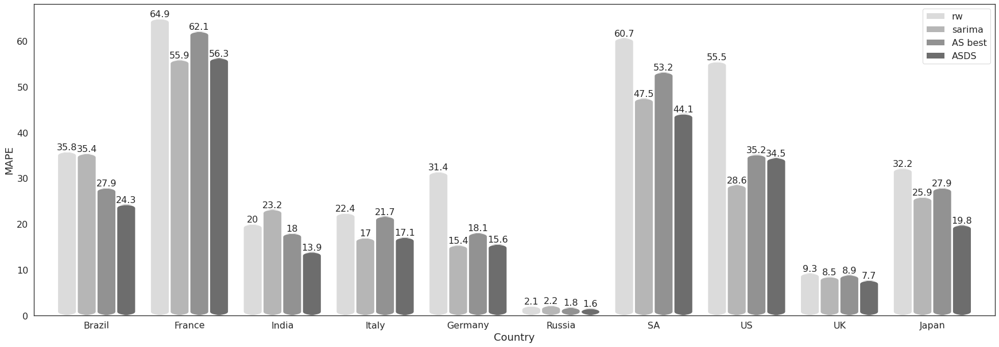

In [31]:
ax = table.plot.bar(layout=(1,9), figsize=(30,10), fontsize=16, xlabel='Country', width=0.85, ylabel='MAPE', rot=0.90)
ax.legend(fontsize=16)
ax.xaxis.label.set_size(18)

ax.yaxis.label.set_size(18)

for container in ax.containers:
    ax.bar_label(container, fontsize=16)

new_patches = []
for patch in reversed(ax.patches):
    bb = patch.get_bbox()
    color=patch.get_facecolor()
    p_bbox = FancyBboxPatch((bb.xmin, bb.ymin),
                        abs(bb.width), abs(bb.height),
                        boxstyle="round,pad=-0.01,rounding_size=0.2",
                        ec="none", fc=color,
                        mutation_aspect=4
                        )
    patch.remove()
    new_patches.append(p_bbox)
for patch in new_patches:
    ax.add_patch(patch)
plt.savefig(f"./images/pool.pdf", bb_inches="tight")

AttributeError: 'AxesSubplot' object has no attribute 'datavalues'

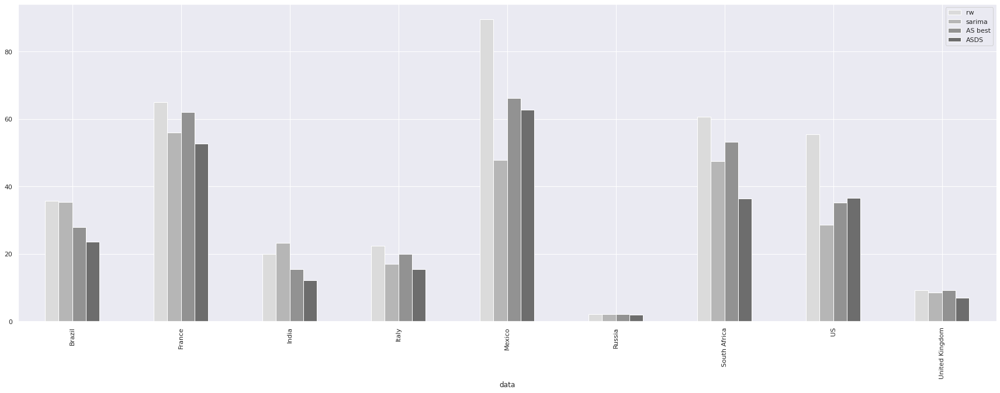

In [ ]:
fig, ax = plt.subplots()
bars = table.plot.bar(layout=(1,9), figsize=(30,10), ax=ax)

ax.bar_label(bars)

# ax.bar_label(bars)
# for container in containers:
#     ax.bar_label(container)
#plt.savefig('mape_pool_sarima.png')

In [ ]:
ax

array([[<AxesSubplot:title={'center':'Brazil'}>,
        <AxesSubplot:title={'center':'France'}>,
        <AxesSubplot:title={'center':'India'}>,
        <AxesSubplot:title={'center':'Italy'}>,
        <AxesSubplot:title={'center':'Mexico'}>,
        <AxesSubplot:title={'center':'Russia'}>,
        <AxesSubplot:title={'center':'South Africa'}>,
        <AxesSubplot:title={'center':'US'}>,
        <AxesSubplot:title={'center':'United Kingdom'}>]], dtype=object)

In [ ]:
for container in ax.containers:
    ax.bar_label(container)

In [ ]:
table.style.highlight_min(axis=1,
                           props='bfseries: ;').format('{:.1f}').to_latex('./latex/pool_mape',  caption='MAPE pool', hrules=True, label='pool_mape', position='H', position_float="centering")

KeyError: '`Styler.apply` and `.applymap` are not compatible with non-unique index or columns.'

In [ ]:
table_diff = table.rsub(table['rw'].values, axis=0) * -1
table_diff['rw'] = rw_pool.values * 100
table_diff = table_diff.append(pd.Series(table_diff.mean(), name='Mean'))
table_diff

/tmp/ipykernel_41868/1862628163.py:3: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  table_diff = table_diff.append(pd.Series(table_diff.mean(), name='Mean'))


,rw,arima,AA_min,AADS,sarima,AS_min,ASDS
data,,,,,,,
Brazil,35.797473,-6.539914,-2.064524,-9.525804,-0.350793,-7.853385,-12.670157
France,66.670525,3.759159,-24.970010,-17.626345,-10.082579,-30.380353,-37.538012
India,19.977002,0.384042,-4.484410,-8.532176,3.208281,-3.029142,-4.640164
Italy,20.061563,-5.225166,-0.187760,-1.204856,-4.997078,-7.493289,-8.795201
Mexico,89.552130,-39.603994,-43.035284,-29.051759,-41.742921,-30.943829,-28.264631
Russia,1.783033,-0.017190,-0.017190,-0.088839,0.229236,-0.091313,-0.361320
South Africa,56.656485,-9.446718,-12.920326,-23.970590,-13.004349,-14.663928,-25.737651
US,57.498870,-28.432019,-7.921101,-9.963664,-28.734107,-31.225934,-34.066838
United Kingdom,8.659550,-0.122988,-0.210921,-1.601411,-0.737779,-1.395732,-2.511879


In [ ]:
table_diff.style.highlight_min(axis=1,
                           props='bfseries: ;').format('{:.1f}').to_latex('./latex/pool_mape_diff',  caption='MAPE pool', hrules=True, label='pool_mape_diff', position='H', position_float="centering")

## Stat Test

In [ ]:
tests = {}
for col in table.columns:
    tests[col] = {}
    for row in table.columns:
        if col != row: 
            tests[col][row] = stats.wilcoxon(table[col], table[row])[1]
        else:
            tests[col][row] = 1

/storage/apps/codrift/venv/lib/python3.9/site-packages/scipy/stats/_morestats.py:3145: UserWarning: Exact p-value calculation does not work if there are ties. Switching to normal approximation.
  warnings.warn("Exact p-value calculation does not work if there are "
/storage/apps/codrift/venv/lib/python3.9/site-packages/scipy/stats/_morestats.py:3159: UserWarning: Sample size too small for normal approximation.
  warnings.warn("Sample size too small for normal approximation.")


In [ ]:
pd.DataFrame(tests)

,rw,sarima,AS best,ASDS
rw,1.000000,0.039062,0.011719,0.003906
sarima,0.039062,1.000000,0.496094,0.359375
AS best,0.011719,0.496094,1.000000,0.011719
ASDS,0.003906,0.359375,0.011719,1.000000


In [ ]:
# Series

# Drifts

In [23]:
drifts = {}
drifts2 = {}
drifts3 = {}
for country in countries:
    path = './outputs/'+country+'/data/'
    tmp = pd.read_csv(path+'drifts.csv', index_col=0, parse_dates=True)
    drifts[country] = tmp
    drifts2[country] = tmp.groupby('drift').count()
    drifts3[country] = tmp.groupby('drift').agg(['mean', 'std'])

In [ ]:
from sklearn.metrics import pairwise
from scipy.spatial import distance
from scipy.stats import wilcoxon, mannwhitneyu

In [ ]:
from scipy import stats

In [ ]:
pvs = {}
for country in countries:
    pvs[country] = {}
    groups = list(drifts[country].groupby('drift'))
    for k, drift1 in groups:
        if k != 0:
            drift0 = groups[k-1][1]
            if (drift0[country].shape[0] > drift1[country].shape[0]):
                # print(drift0[country])
                # # print(drift0[country].iloc[:len(drift1[country])])
                # print(drift1[country])
                # print(drift1[country].corr(drift0[country].iloc[:len(drift1[country])]))
                # value = drift1[country].corr(drift0[country].iloc[:len(drift1[country])])
                if k == 1:
                    value = stats.pearsonr(drift1[country].values, drift0[country].iloc[-len(drift1[country]):].values)[0]
                else:
                    value = stats.pearsonr(drift1[country].values, drift0[country].iloc[:len(drift1[country])].values)[0]
                pvs[country][k] = value
            else:
                # value = drift0[country].corr(drift1[country].iloc[:len(drift0[country])])
                value = stats.pearsonr(drift0[country].values, drift1[country].iloc[:len(drift0[country])].values)[0]
                pvs[country][k] = value
            # print(value)
        else:
             pvs[country][k] = 0    

In [ ]:
d0 =drifts['Brazil'].query('drift == 0')['Brazil'].values
d1 = drifts['Brazil'].query('drift == 1')['Brazil'].values


In [ ]:
d0[:d1.shape[0]]

array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.])

In [ ]:
pd.DataFrame(pvs).round(2).drop(0)

,Brazil,France,India,Italy,Mexico,Russia,South Africa,US,United Kingdom
1,0.68,-0.19,0.88,-0.69,0.87,-0.02,0.30,-0.49,-0.59
2,0.14,-0.06,0.94,0.41,0.49,0.15,0.81,-0.62,0.58
3,0.04,-0.46,0.94,-0.38,-0.07,0.92,0.15,-0.48,-0.32
4,-0.47,-0.13,0.71,0.35,-0.45,0.73,-0.57,-0.59,0.34
5,-0.56,-0.46,-0.49,0.91,-0.09,-0.69,0.08,0.22,0.54
6,0.04,0.03,0.18,-0.85,0.09,0.86,0.02,-0.17,0.65
7,-0.31,0.03,0.37,-0.24,-0.34,0.92,-0.66,0.49,-0.68
8,0.38,-0.10,0.51,-0.40,-0.04,-0.91,0.51,-0.51,-0.76
9,-0.43,NaN,0.44,-0.24,0.47,0.89,-0.10,-0.60,-0.90
10,-0.52,NaN,-0.31,-0.50,-0.33,0.75,0.35,-0.30,0.42


In [ ]:
pvs = {}
for country in countries:
    pvs[country] = {}
    groups = list(drifts[country].groupby('drift'))
    for k, drift1 in groups:
        if k != 0:
            drift0 = groups[k-1][1]
            pvs[country][k] = mannwhitneyu(drift0[country].values, drift1[country].values)[1]
        else:
             pvs[country][k] = np.nan    
       

In [ ]:
type(0.705189) == float

True

In [ ]:
#pvsmann = pd.DataFrame(pvs)≠
pvsmann = pd.DataFrame(pvs).applymap(lambda x: '≠' if (x < 0.05) else x ).fillna(' ').applymap(lambda x: '=' if (type(x) == float) else x )
pvsmann

,Brazil,France,India,Italy,Mexico,Russia,South Africa,US,United Kingdom
0,,,,,,,,,
1,≠,≠,≠,≠,≠,≠,≠,≠,≠
2,≠,≠,≠,≠,≠,≠,≠,≠,≠
3,≠,=,≠,≠,≠,≠,≠,=,≠
4,=,=,≠,≠,≠,≠,≠,≠,≠
5,≠,≠,≠,≠,≠,≠,≠,≠,≠
6,≠,≠,≠,≠,≠,≠,≠,≠,≠
7,≠,≠,≠,≠,≠,≠,≠,≠,=
8,≠,≠,≠,=,≠,≠,≠,=,≠
9,≠,,≠,≠,≠,≠,=,≠,≠


In [ ]:
pvsmann.style.to_latex('./latex/mannwhitneyu',  caption='mannwhitneyu', hrules=True, label='pool_mape', position='H', position_float="centering")

In [ ]:
pvs = {}
for country in countries:
    pvs[country] = {}
    for k, drift in drifts[country].groupby('drift'):
        #print(drift[country])
        pvs[k] = {}
        for i, drift2 in drifts[country].groupby('drift'):
            print(k,i)
            #print(drift)
            #print(drift2)
            print(drift[country].shape)
            print(drift2[country].shape)
            #print(drift[country].equals(drift2[country]))
            if not(drift[country].equals(drift2[country])):
                value = mannwhitneyu(drift[country].values, drift2[country].values)[1]
                pvs[k][i] = value


0 0
(96,)
(96,)
0 1
(96,)
(33,)
0 2
(96,)
(33,)
0 3
(96,)
(33,)
0 4
(96,)
(33,)
0 5
(96,)
(65,)
0 6
(96,)
(33,)
0 7
(96,)
(65,)
0 8
(96,)
(33,)
0 9
(96,)
(33,)
0 10
(96,)
(65,)
0 11
(96,)
(97,)
0 12
(96,)
(31,)
1 0
(33,)
(96,)
1 1
(33,)
(33,)
1 2
(33,)
(33,)
1 3
(33,)
(33,)
1 4
(33,)
(33,)
1 5
(33,)
(65,)
1 6
(33,)
(33,)
1 7
(33,)
(65,)
1 8
(33,)
(33,)
1 9
(33,)
(33,)
1 10
(33,)
(65,)
1 11
(33,)
(97,)
1 12
(33,)
(31,)
2 0
(33,)
(96,)
2 1
(33,)
(33,)
2 2
(33,)
(33,)
2 3
(33,)
(33,)
2 4
(33,)
(33,)
2 5
(33,)
(65,)
2 6
(33,)
(33,)
2 7
(33,)
(65,)
2 8
(33,)
(33,)
2 9
(33,)
(33,)
2 10
(33,)
(65,)
2 11
(33,)
(97,)
2 12
(33,)
(31,)
3 0
(33,)
(96,)
3 1
(33,)
(33,)
3 2
(33,)
(33,)
3 3
(33,)
(33,)
3 4
(33,)
(33,)
3 5
(33,)
(65,)
3 6
(33,)
(33,)
3 7
(33,)
(65,)
3 8
(33,)
(33,)
3 9
(33,)
(33,)
3 10
(33,)
(65,)
3 11
(33,)
(97,)
3 12
(33,)
(31,)
4 0
(33,)
(96,)
4 1
(33,)
(33,)
4 2
(33,)
(33,)
4 3
(33,)
(33,)
4 4
(33,)
(33,)
4 5
(33,)
(65,)
4 6
(33,)
(33,)
4 7
(33,)
(65,)
4 8
(33,)
(33,)
4 9
(33,)
(3

In [ ]:
pvs

{'Brazil': {},
 0: {1: 0.000422370338931564,
  2: 0.1112702575574972,
  3: 0.3145112329714296,
  4: 0.09209722532662618,
  5: 2.380481519217317e-07,
  6: 1.1017748843527615e-17,
  7: 1.1017748843527615e-17,
  8: 1.1017748843527615e-17,
  9: 2.0928975691266384e-25,
  10: 0.01164908145040124,
  11: 4.0163573417854636e-07,
  12: 1.1017748843527615e-17,
  13: 1.1017748843527615e-17,
  14: 1.1017748843527615e-17,
  15: 6.043358799258383e-17},
 1: {0: 0.000422370338931564,
  2: 5.9685701429654105e-12,
  3: 3.0260417925061747e-12,
  4: 6.246403248401406e-12,
  5: 0.008563246345980388,
  6: 3.0260417925061747e-12,
  7: 3.0260417925061747e-12,
  8: 3.0260417925061747e-12,
  9: 1.3082864033248565e-12,
  10: 0.008891680065520218,
  11: 0.014306545257521104,
  12: 3.0260417925061747e-12,
  13: 3.0260417925061747e-12,
  14: 3.0260417925061747e-12,
  15: 6.666459108310296e-12},
 2: {0: 0.1112702575574972,
  1: 5.9685701429654105e-12,
  3: 1.3759175625057742e-06,
  4: 0.2756680639403555,
  5: 5.21629

In [ ]:
df_drifts = pd.DataFrame()
for d in drifts:
    df_drifts=drift[d]

KeyError: 'Brazil'

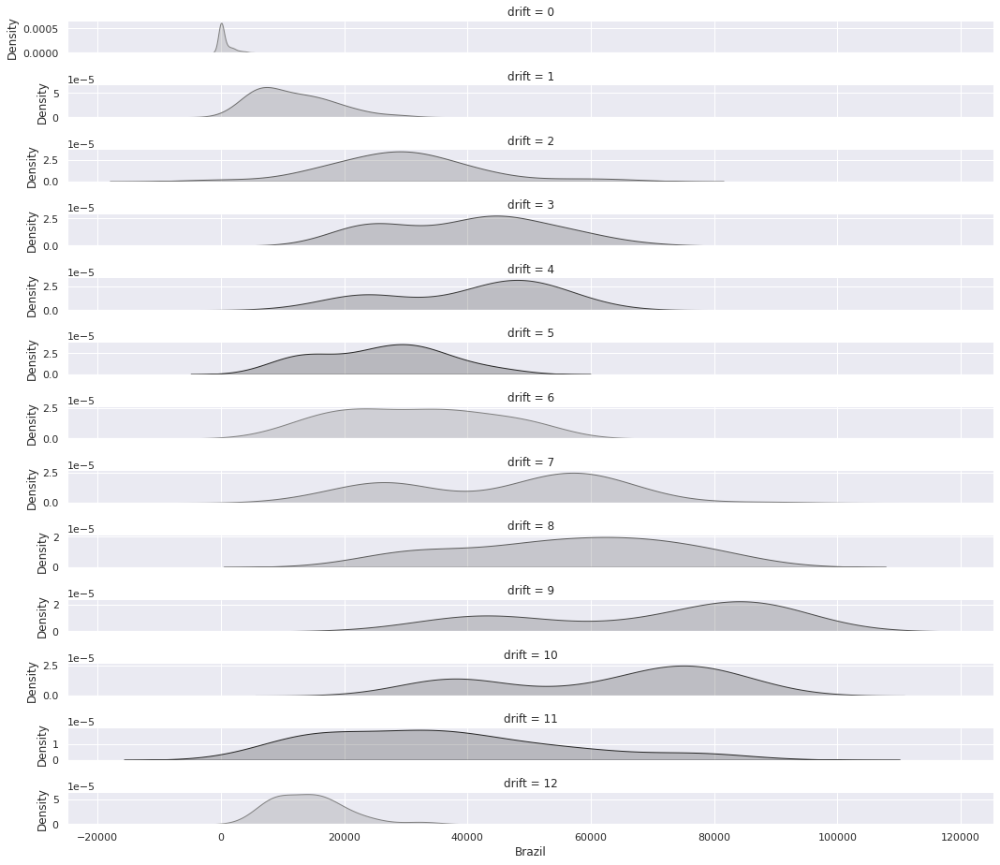

In [ ]:
pal = sns.dark_palette("gray", reverse=True)
g = sns.FacetGrid(drifts['Brazil'], row="drift", hue="drift", aspect=15, height=1, sharey=False, palette=pal)
g.map(sns.kdeplot, "Brazil", fill=True,)
#g.map(sns.kdeplot, "Brazil", clip_on=False, lw=2, bw_adjust=.5)

In [ ]:
df_drifts2 = pd.concat(drifts2, axis=1).droplevel(0, axis=1)

In [ ]:
df_drifts3 = pd.concat(drifts3, axis=1).droplevel(0, axis=1)
#df_drifts3.round(2).style.background_gradient(cmap='Greys').format('{:.2f}').to_latex('./latex/drifts_skew',  caption='Drifts Skew', hrules=True, label='drifts_skew', position='H', position_float="centering", convert_css=True)
df_drifts3.round(0)

Brazil            France              India             Italy          \
          mean      std     mean      std      mean      std     mean     std   
drift                                                                           
0        657.0   1132.0    390.0    793.0     291.0    507.0   1162.0  1886.0   
1      11648.0   6147.0   3249.0   5221.0    4215.0   1792.0   2501.0  1658.0   
2      29619.0  12100.0  29117.0  18965.0   12386.0   3694.0    286.0   131.0   
3      39970.0  12729.0  22515.0  18414.0   34778.0  12049.0    219.0    64.0   
4      40666.0  12881.0  13359.0   6575.0   64690.0   8741.0   1163.0   620.0   
5      25835.0  10114.0  19807.0   7976.0   86612.0   7116.0  14257.0  9842.0   
6      31399.0  12285.0  15316.0  15891.0   57289.0  11623.0  29254.0  6712.0   
7      45801.0  17187.0  19639.0   8344.0   41313.0   5662.0  15466.0  3737.0   
8      56003.0  17032.0   8252.0   7792.0   23309.0   4804.0  14982.0  4420.0   
9      69404.0  19984.0      NaN      NaN   13698.0   5359.0  11334.0  7676.0   
10     62821.0  18237.0      NaN      NaN   15016.0   3926.0   1225.0   741.0   
11     35544.0  19640.0      NaN      NaN   77727.0  46806.0   5445.0  1466.0   
12     14298.0   5931.0      NaN      NaN  325363.0  54325.0   5508.0  1406.0   
13         NaN      NaN      NaN      NaN  161437.0  76606.0   2896.0   696.0   
14         NaN      NaN      NaN      NaN   41934.0   7795.0      NaN     NaN   
15         NaN      NaN      NaN      NaN   35827.0   7187.0      NaN     NaN   
16         NaN      NaN      NaN      NaN   20936.0   5376.0      NaN     NaN   

        Mexico           Russia         South Africa                US  \
          mean     std     mean     std         mean     std      mean   
drift                                                                    
0        153.0   275.0    843.0  1702.0         47.0    73.0   10112.0   
1       2047.0   774.0   9226.0  1542.0        698.0   380.0   23527.0   
2       4322.0   936.0   8169.0   762.0       3586.0  1658.0   43751.0   
3       6297.0  1159.0   6209.0   444.0      10759.0  2314.0   48659.0   
4       5753.0  1329.0   4972.0   241.0       4427.0  2646.0   91087.0   
5       4935.0   983.0   6250.0  1406.0       1592.0   457.0  210719.0   
6       8541.0  3138.0  14899.0  2657.0       6796.0  5396.0  171671.0   
7      13417.0  5856.0  25181.0  2843.0       9937.0  6204.0   69013.0   
8       5449.0  2779.0  20138.0  2854.0       1290.0   567.0   62608.0   
9       2995.0  1219.0  12064.0  1852.0       1577.0   827.0   34443.0   
10      2588.0  1257.0   8895.0   537.0       5028.0  2859.0   18491.0   
11     10085.0  7138.0   8421.0   460.0      15585.0  3596.0  100596.0   
12     12055.0  6872.0  15661.0  6566.0      11175.0  3191.0  151690.0   
13      6390.0  4238.0  20451.0  2064.0       4426.0  4170.0  100295.0   
14         NaN     NaN  25803.0  4568.0          NaN     NaN       NaN   
15         NaN     NaN      NaN     NaN          NaN     NaN       NaN   
16         NaN     NaN      NaN     NaN          NaN     NaN       NaN   

               United Kingdom           
           std           mean      std  
drift                                   
0      13326.0         1643.0   2052.0  
1       3635.0         2976.0   1094.0  
2      18780.0          987.0    298.0  
3       9988.0          621.0    225.0  
4      58818.0         1057.0    245.0  
5      32576.0         4368.0   2362.0  
6      51418.0        19149.0   4036.0  
7      15780.0        19678.0   5005.0  
8      13245.0        35862.0  15523.0  
9      20314.0        15916.0  15797.0  
10     14470.0         2288.0    350.0  
11     61738.0         4405.0   2313.0  
12     64765.0        25846.0  12902.0  
13     40345.0        30479.0   6683.0  
14         NaN        33623.0   4274.0  
15         NaN        37419.0   5286.0  
16         NaN            NaN      NaN

In [ ]:
df_drifts

""


In [ ]:
drifts_stats = df_drifts.describe().T[['count', 'min', '50%', 'max']]
drifts_stats = pd.concat([drifts_stats,pd.DataFrame(drifts_stats.median()).T]).rename({0:'Median'})
drifts_stats

ValueError: Cannot describe a DataFrame without columns

In [ ]:
df_drifts.fillna(0).style.format('{:.0f}').to_latex('./latex/drift_stats',  caption='Concept Drift Stats', hrules=True, label='drift_stats', position='H', position_float="centering")

<AxesSubplot:title={'center':'Concepts by country'}, ylabel='Country'>

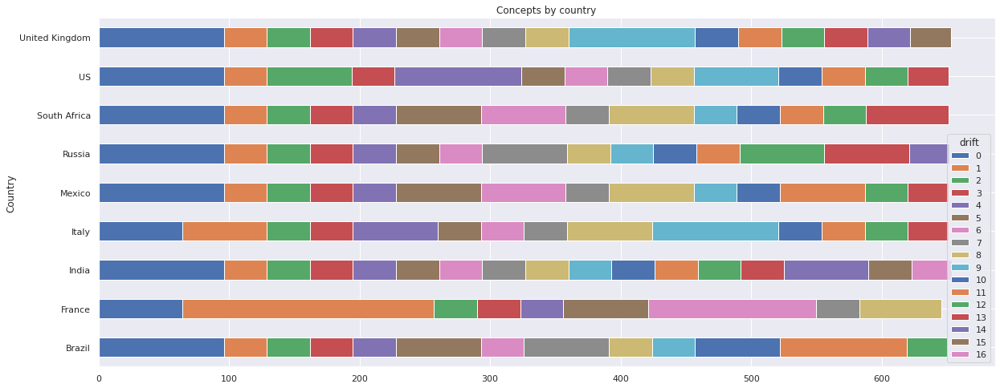

In [ ]:
pd.concat(drifts2, axis=1).droplevel(0, axis=1).T.plot.barh(stacked=True, figsize=(20,8), xlabel="Country", ylabel='days', title='Concepts by country')

array([<AxesSubplot:xlabel='level_1'>, <AxesSubplot:xlabel='level_1'>,
       <AxesSubplot:xlabel='level_1'>, <AxesSubplot:xlabel='level_1'>,
       <AxesSubplot:xlabel='level_1'>, <AxesSubplot:xlabel='level_1'>,
       <AxesSubplot:xlabel='level_1'>, <AxesSubplot:xlabel='level_1'>,
       <AxesSubplot:xlabel='level_1'>], dtype=object)

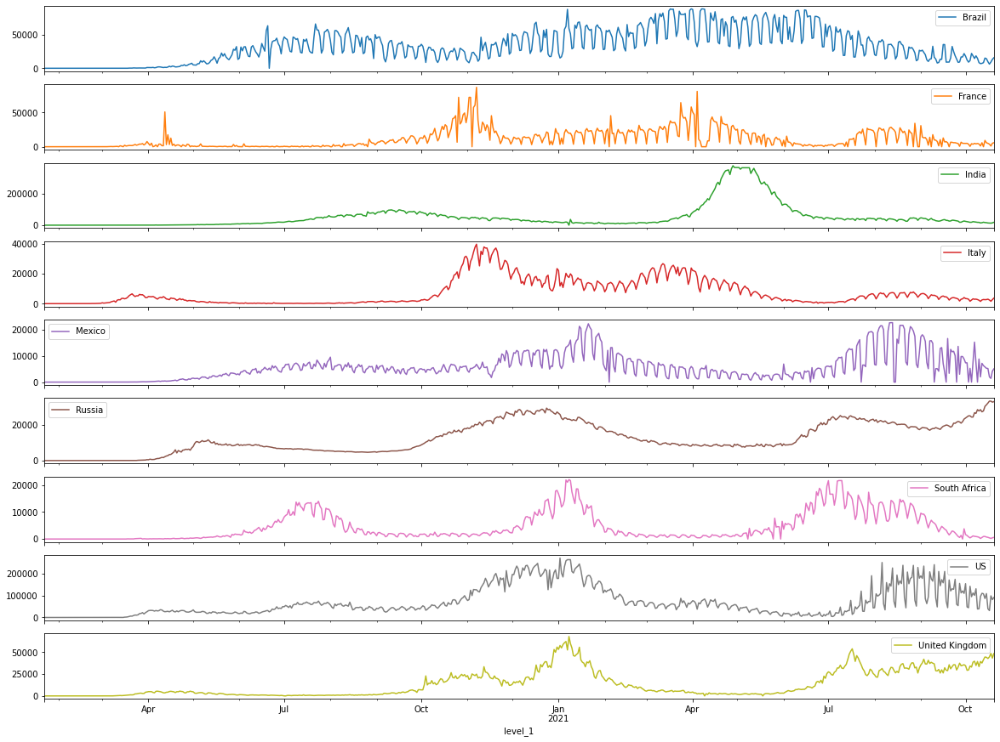

In [ ]:
pd.concat(drifts).reset_index().pivot_table(index='level_1').drop('drift', axis=1).plot(subplots=True, figsize=(20,15))

## concepts

In [24]:
drift_data = pd.concat(drifts).reset_index().pivot_table(index=['drift','level_1'])
drift_data = drift_data.reset_index().set_index('level_1')

In [ ]:
# font = {'weight' : 'bold',
#         'size'   : 20}

# matplotlib.rc('font', **font)

In [25]:
(data['Brazil']['train_data'].max() * 0.1).values[0]

8855.5

In [26]:
from cycler import cycler

In [27]:
sns.set_theme(style='white')
#default_cycler = (cycler(color=['#111111', '#555555', '#888888', '#AAAAAA']))
default_cycler = (cycler(color=['#111111', '#AAAAAA']))

plt.rc('axes', prop_cycle=default_cycler)

In [36]:
drifts_br = drift_data[['drift', 'Brazil']].dropna()
drifts_br

,drift,Brazil
level_1,,
2020-01-22,0,0.0
2020-01-23,0,0.0
2020-01-24,0,0.0
2020-01-25,0,0.0
2020-01-26,0,0.0
...,...,...
2021-10-16,12,9761.0
2021-10-17,12,6185.0
2021-10-18,12,9319.0


In [ ]:
drifts_br.columns

Index(['drift', 'Brazil'], dtype='object')

In [ ]:
drifts_br

,drift,Brazil
level_1,,
2020-01-22,0,0.0
2020-01-23,0,0.0
2020-01-24,0,0.0
2020-01-25,0,0.0
2020-01-26,0,0.0
...,...,...
2021-10-16,12,9761.0
2021-10-17,12,6185.0
2021-10-18,12,9319.0


/tmp/ipykernel_15382/2067359427.py:4: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "bb_inches" which is no longer supported as of 3.3 and will become an error in 3.6
  plt.savefig('./images/concepts/box_brazil.pdf', bb_inches='tight')


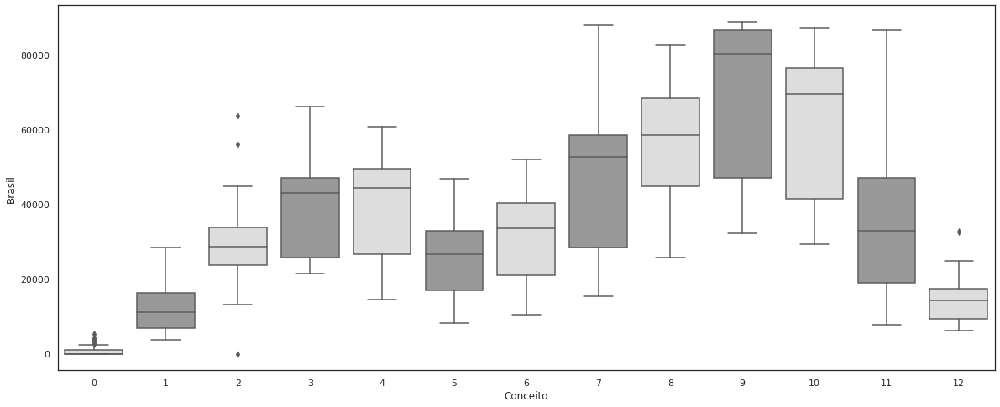

In [ ]:
fig, ax = plt.subplots(figsize=(20,8))
drifts_br = drifts_br.rename({'drift':'Conceito', 'Brazil':'Brasil'}, axis=1)
sns.boxplot(x=drifts_br['Conceito'], y=drifts_br['Brasil'], palette=['#DDDDDD', '#999999'])
plt.savefig('./images/concepts/box_brazil.pdf', bb_inches='tight')


<AxesSubplot:xlabel='Conceito', ylabel='Brasil'>

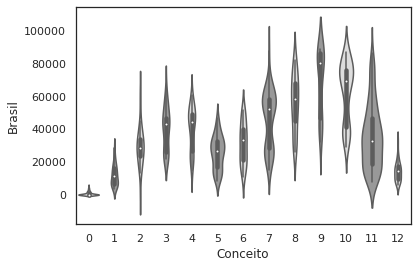

In [ ]:
sns.violinplot(x=drifts_br['Conceito'], y=drifts_br['Brasil'], palette=['#DDDDDD', '#999999'], scale='count')

/tmp/ipykernel_15382/3436716066.py:4: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "bb_inches" which is no longer supported as of 3.3 and will become an error in 3.6
  plt.savefig('./images/concepts/violin_brazil.pdf', bb_inches='tight')


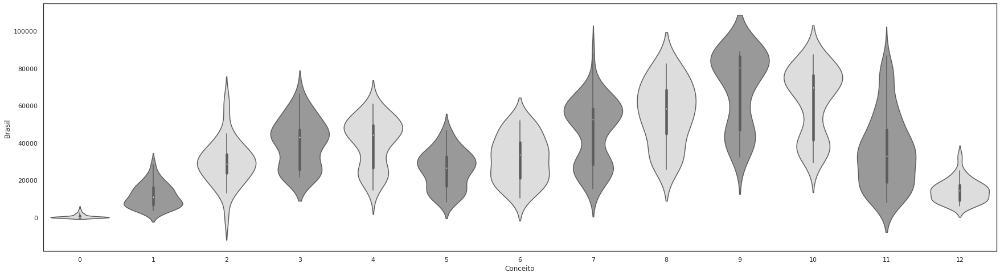

In [ ]:
fig, ax = plt.subplots(figsize=(30,8))
drifts_br = drifts_br.rename({'drift':'Conceito', 'Brazil':'Brasil'}, axis=1)
sns.violinplot(x=drifts_br['Conceito'], y=drifts_br['Brasil'], palette=['#DDDDDD', '#999999'], scale='width')
plt.savefig('./images/concepts/violin_brazil.pdf', bb_inches='tight')

In [ ]:
dados = {}
for g in drifts_br.groupby('drift'):
    i = g[1].head(1)
    f = g[1].tail(1)
    # print(i['drift'].values[0])
    # print(f['drift'].values[0])
    dados[i['drift'].values[0]] = {'data': i.index.values[0],'inicio': i['Brazil'].values[0], 'fim': f['Brazil'].values[0]}
    # print(g[1].tail(1))

In [ ]:
pd.DataFrame(dados).T

,data,inicio,fim
0,2020-01-22,0.0,3776.0
1,2020-04-26,3776.0,28337.0
2,2020-05-28,28337.0,21550.0
3,2020-06-29,21550.0,53264.0
4,2020-07-31,53264.0,44329.0
5,2020-09-01,44329.0,23316.0
6,2020-11-04,23316.0,26430.0
7,2020-12-06,26430.0,28586.0
8,2021-02-08,28586.0,82471.0
9,2021-03-12,82471.0,82661.0


In [ ]:
drifts_br.pivot_table(index='drift', values='Brazil', aggfunc=['min','median', 'max','std']).droplevel(1,axis=1).style.format('{:.2f}').to_latex('./latex/conceptsbr',  caption='Brazil Drifts Stats', hrules=True, label='br_drifts', position='H', position_float="centering")

In [ ]:
drifts_br.groupby('drift').describe().style.format('{:,.0f}').to_latex('./latex/conceptsbr',  caption='Brazil Drifts Stats', hrules=True, label='br_drifts', position='H', position_float="centering")

In [ ]:
drifts_br.pivot_table(index='drift', values='Brazil', aggfunc=['min','median', 'max','std'])

,min,median,max,std
,Brazil,Brazil,Brazil,Brazil
drift,,,,
0,0.0,6.5,5281.0,1131.611221
1,3776.0,11121.0,28337.0,6147.354645
2,0.0,28692.0,63523.0,12100.372737
3,21550.0,42962.0,66150.0,12729.037962
4,14534.0,44329.0,60713.0,12880.529322
5,8249.0,26700.0,46809.0,10114.404420
6,10502.0,33508.0,51985.0,12284.754996
7,15353.0,52550.0,87969.0,17186.592408


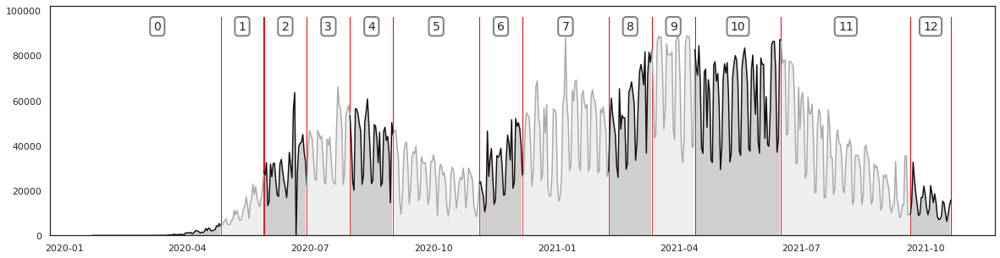

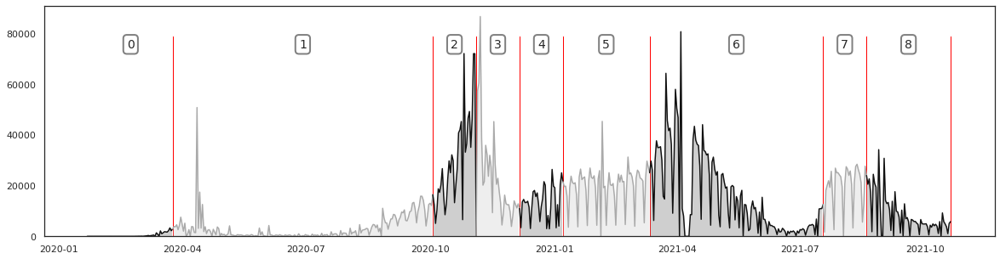

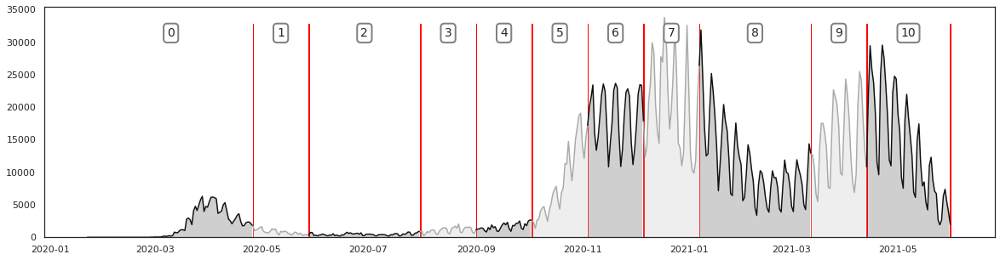

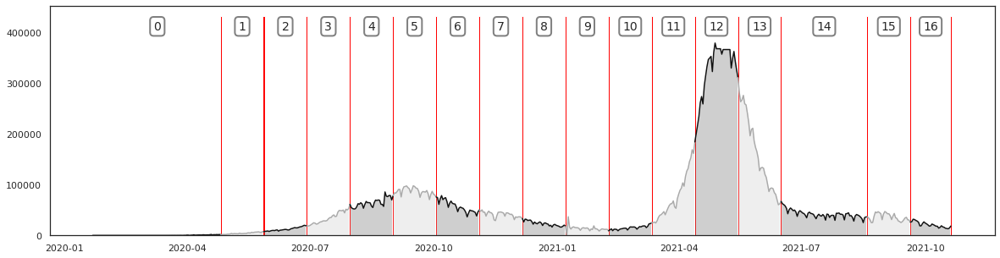

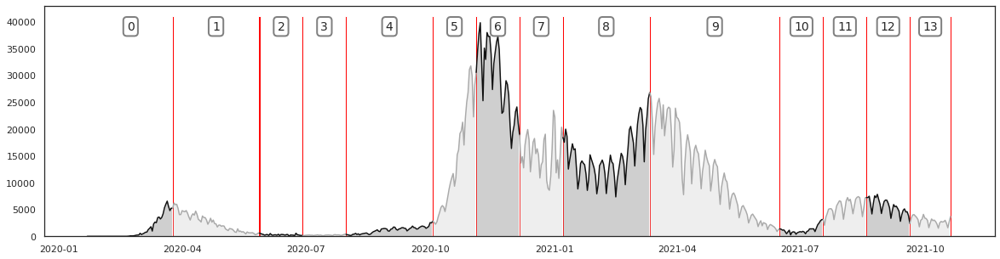

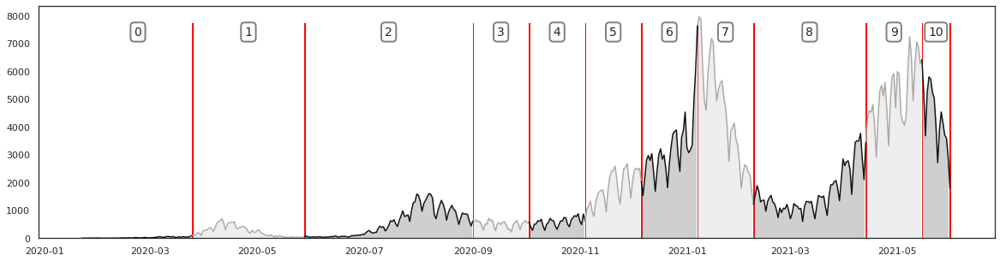

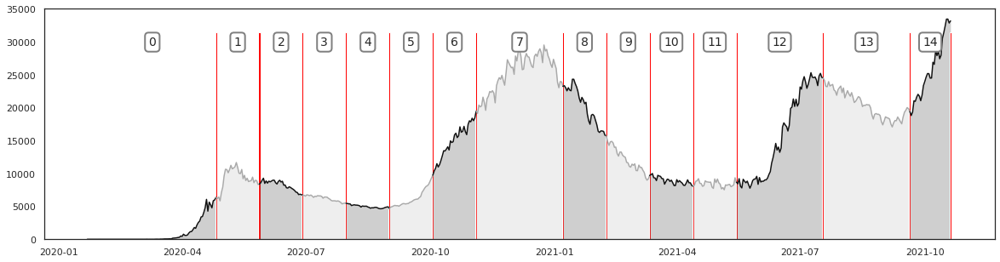

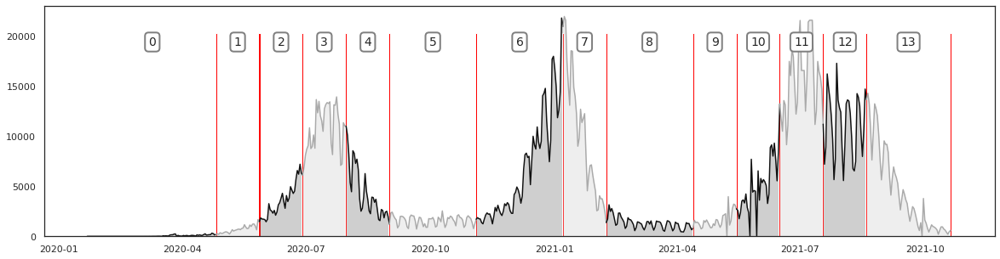

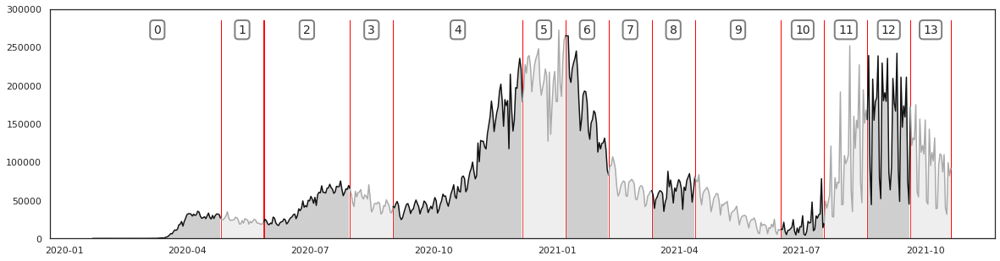

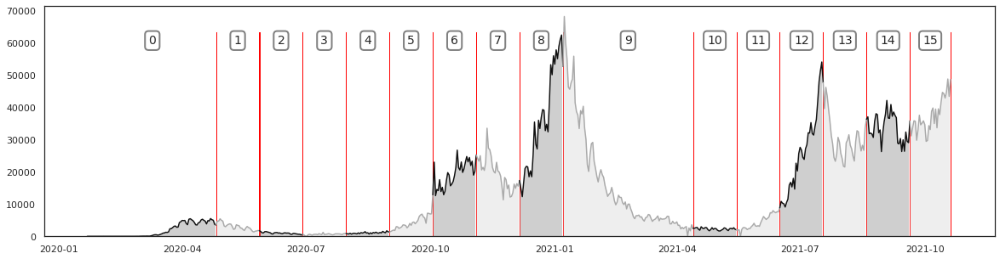

In [30]:
for k, col in enumerate(drift_data.columns[1:]):  
  fig, ax = plt.subplots(figsize=(20,5))
  #print(drift_data)
  max_value = data[col]['train_data'].max().values[0]
  for d in range(20):
    try:
      #print(drift_data.loc[drift_data['drift'] == d][col])
      tmp = drift_data.loc[drift_data['drift'] == d][col]
      tmp = tmp.dropna()
      #print(tmp.dropna())
      #print(tmp.tail(1).index)
      ax.plot(tmp)
      ax.fill_between(tmp.index, tmp, alpha=0.2)
    #   ax.fill_between(tmp.index, tmp)
      delta = tmp.tail(1).index[0].date() - tmp.head(1).index[0].date()
      # ax.bar(x=tmp.tail(1).index, height=tmp.tail(1).values, width=1, color='black')
      # print(d, tmp.tail(1).index[0].date())
      # ax.text(pd.to_datetime('2020-02-01'),-200, d, ha="center", va="center", rotation=45, size=15,bbox=dict(boxstyle="rarrow,pad=0.3", fc="cyan", ec="b", lw=2))
      ax.text(pd.to_datetime(tmp.tail(1).index[0].date() - delta/2),max_value * 1.05, d, ha="center", va="center", rotation=0, size=14, bbox=dict(boxstyle="round,pad=0.3", fc="white", ec="gray", lw=2))
      delta = tmp.tail(1).index[0].date() - tmp.head(1).index[0].date()
      ax.bar(x=tmp.tail(1).index, height=max_value * 1.1, width=1.3, color='red')
      # ax.annotate(d, xy=(pd.to_datetime('2020-02-01'),-200),  xycoords='data', xytext=(pd.to_datetime(tmp.tail(1).index[0].date() - delta/2), 0), textcoords='data')
    except:
      pass
  # break
  # ax.set_title(col , size=16)
  plt.savefig(f"./images/concepts/{col}.pdf")

  
  #ax[k].set_label(col)
#fig.legend()

# plt.subplots_adjust(hspace=0.5)

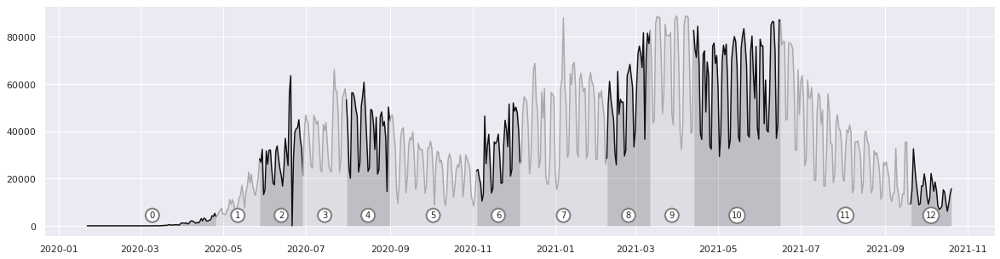

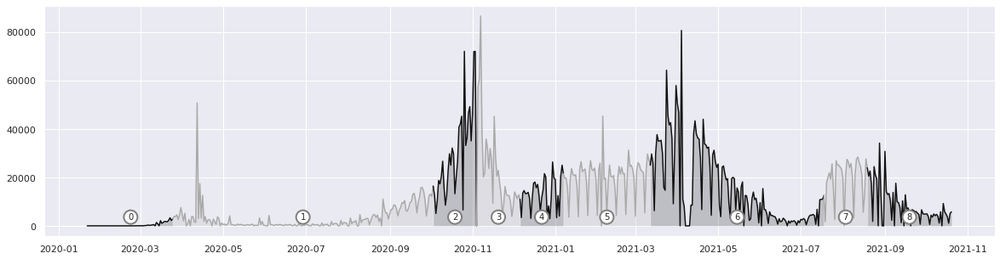

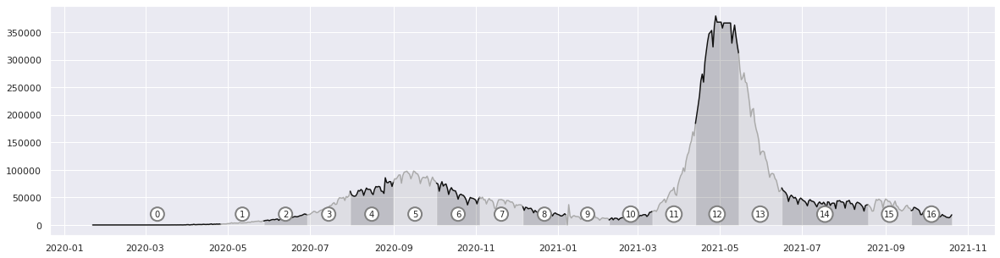

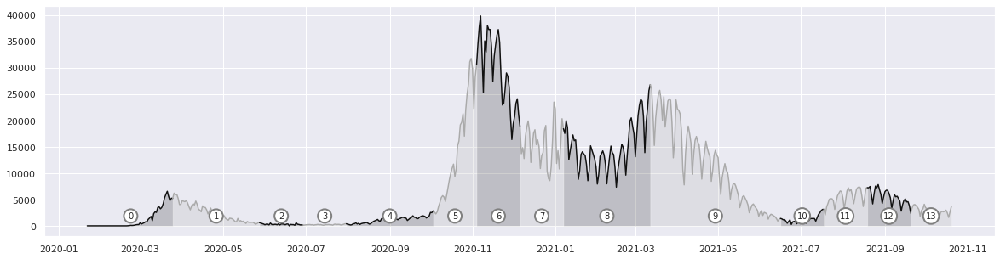

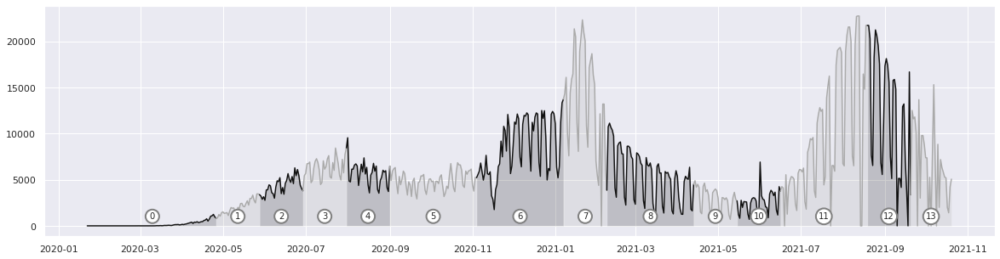

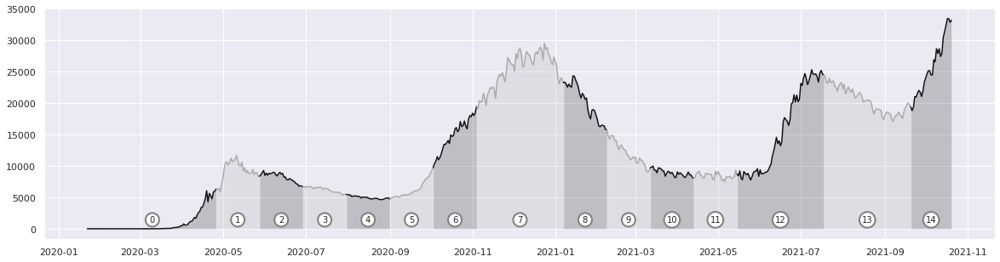

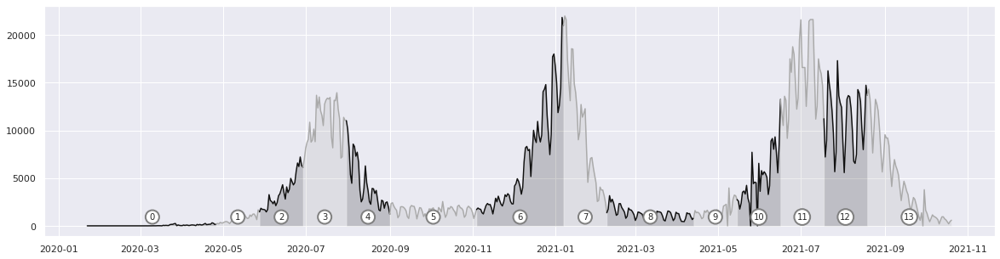

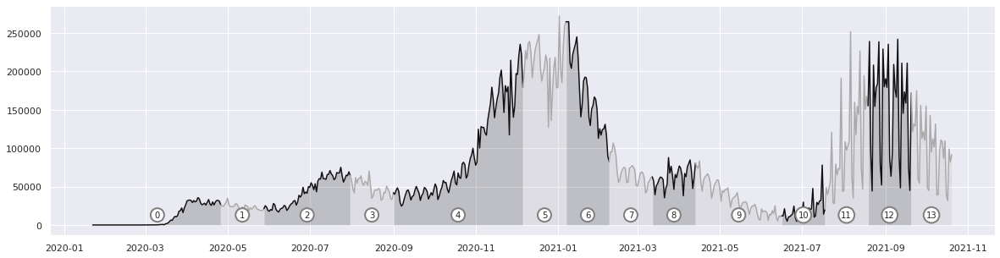

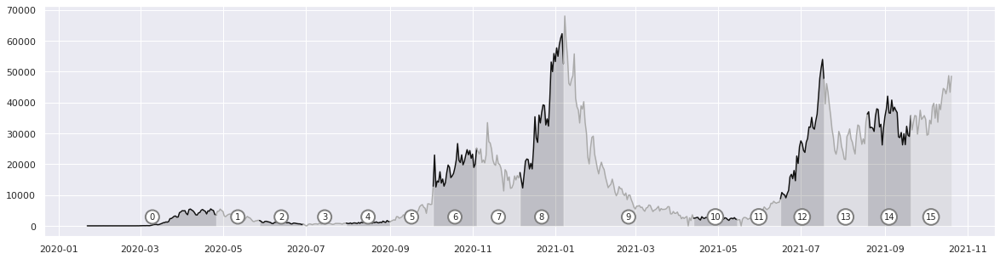

In [ ]:

for k, col in enumerate(drift_data.columns[1:]):  
  fig, ax = plt.subplots(figsize=(20,5))
  #print(drift_data)
  max_value = data[col]['train_data'].max().values[0]
  for d in range(20):
    try:
      #print(drift_data.loc[drift_data['drift'] == d][col])
      tmp = drift_data.loc[drift_data['drift'] == d][col]
      tmp = tmp.dropna()
      #print(tmp.dropna())
      #print(tmp.tail(1).index)
      ax.plot(tmp)
      ax.fill_between(tmp.index, tmp, alpha=0.2)
    #   ax.fill_between(tmp.index, tmp)
      delta = tmp.tail(1).index[0].date() - tmp.head(1).index[0].date()
      # ax.bar(x=tmp.tail(1).index, height=tmp.tail(1).values, width=1, color='black')
      # print(d, tmp.tail(1).index[0].date())
      # ax.text(pd.to_datetime('2020-02-01'),-200, d, ha="center", va="center", rotation=45, size=15,bbox=dict(boxstyle="rarrow,pad=0.3", fc="cyan", ec="b", lw=2))
      ax.text(pd.to_datetime(tmp.tail(1).index[0].date() - delta/2),max_value * 0.05, d, ha="center", va="center", rotation=0, size=10,bbox=dict(boxstyle="circle,pad=0.3", fc="white", ec="gray", lw=2))
      # ax.annotate(d, xy=(pd.to_datetime('2020-02-01'),-200),  xycoords='data', xytext=(pd.to_datetime(tmp.tail(1).index[0].date() - delta/2), 0), textcoords='data')
    except:
      pass

  #ax.set_title(col , size=16)
  plt.savefig(f"./images/{col}.pdf")
  
  #ax[k].set_label(col)
#fig.legend()

# plt.subplots_adjust(hspace=0.5)

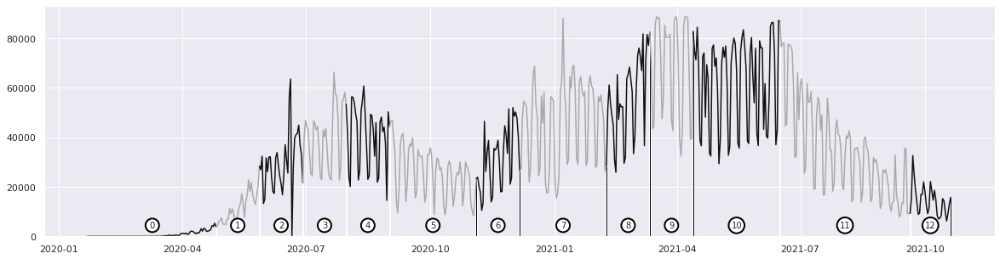

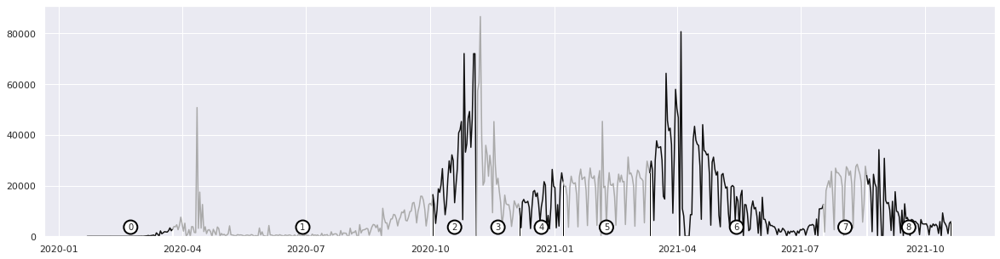

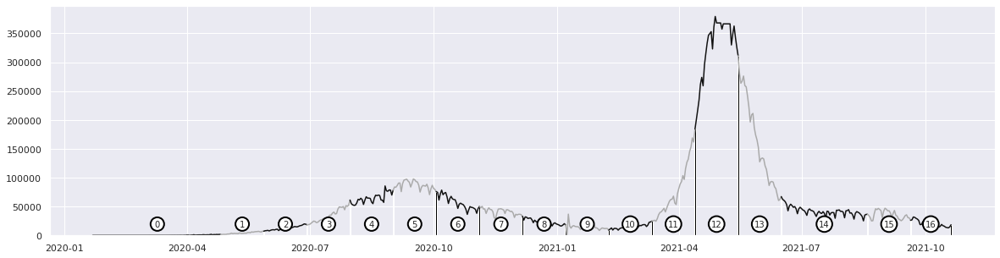

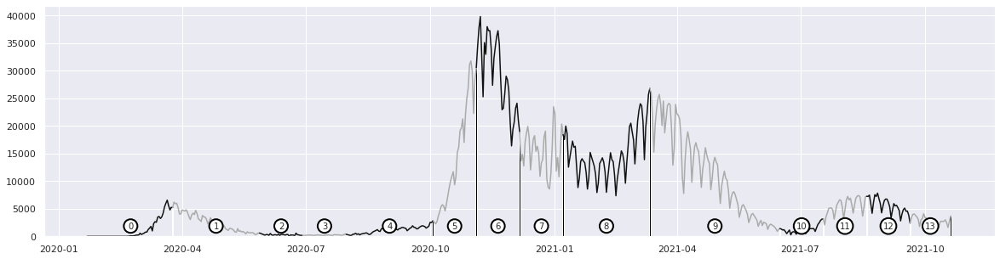

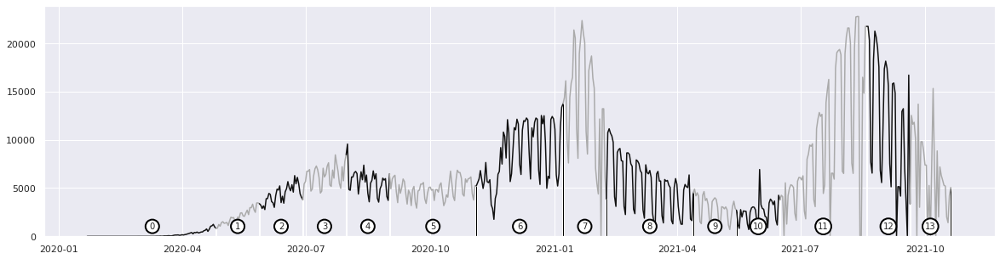

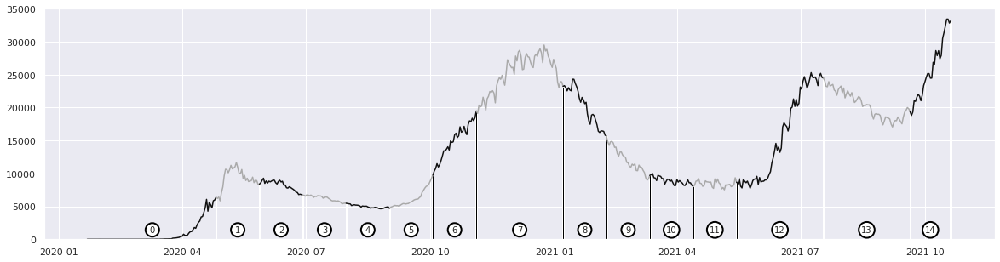

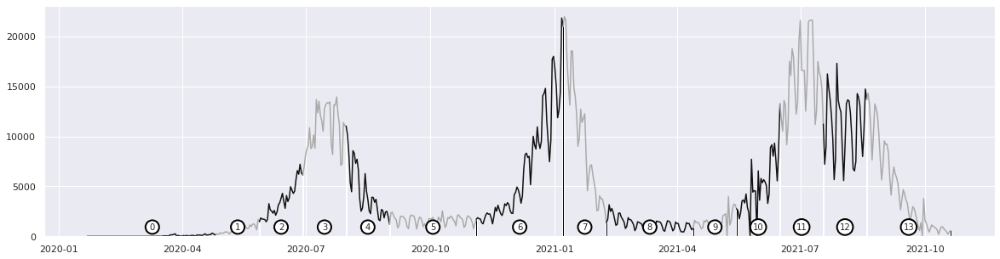

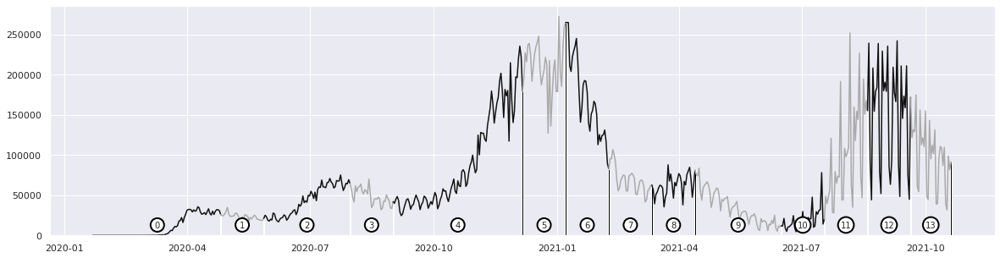

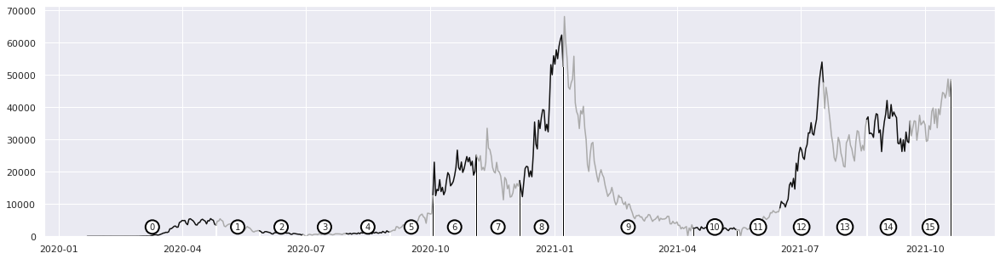

In [ ]:

for k, col in enumerate(drift_data.columns[1:]):  
  fig, ax = plt.subplots(figsize=(20,5))
  #print(drift_data)
  max_value = data[col]['train_data'].max().values[0]
  for d in range(20):
    try:
      #print(drift_data.loc[drift_data['drift'] == d][col])
      tmp = drift_data.loc[drift_data['drift'] == d][col]
      tmp = tmp.dropna()
      #print(tmp.dropna())
      #print(tmp.tail(1).index)
      ax.plot(tmp)
      #ax.fill_between(tmp.index, tmp)
      delta = tmp.tail(1).index[0].date() - tmp.head(1).index[0].date()
      ax.bar(x=tmp.tail(1).index, height=tmp.tail(1).values, width=1, color='black')
      # print(d, tmp.tail(1).index[0].date())
      # ax.text(pd.to_datetime('2020-02-01'),-200, d, ha="center", va="center", rotation=45, size=15,bbox=dict(boxstyle="rarrow,pad=0.3", fc="cyan", ec="b", lw=2))
      ax.text(pd.to_datetime(tmp.tail(1).index[0].date() - delta/2),max_value * 0.05, d, ha="center", va="center", rotation=0, size=10,bbox=dict(boxstyle="circle,pad=0.3", fc="white", ec="black", lw=2))
      # ax.annotate(d, xy=(pd.to_datetime('2020-02-01'),-200),  xycoords='data', xytext=(pd.to_datetime(tmp.tail(1).index[0].date() - delta/2), 0), textcoords='data')
    except:
      pass

  #ax.set_title(col , size=16)
  plt.savefig(f"./images/{col}.pdf")
  
  #ax[k].set_label(col)
#fig.legend()

# plt.subplots_adjust(hspace=0.5)

In [ ]:
pd.concat(drifts).reset_index().drop(['level_0', 'drift'], axis=1).set_index(['level_1'])

,Brazil,France,India,Italy,Mexico,Russia,South Africa,US,United Kingdom
level_1,,,,,,,,,
2020-01-22,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-01-23,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-01-24,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-01-25,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-01-26,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...
2021-10-16,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,42818.0
2021-10-17,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,44696.0
2021-10-18,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,48703.0


In [ ]:
df_slope.style.format('{:+.0f}').to_latex('./latex/drift_slopes',  caption='Drift Slope', hrules=True, label='drift_slopes', position='H', position_float="centering", convert_css=True)

NameError: name 'df_slope' is not defined

In [ ]:
import joblib

In [ ]:
slope = {}
intercept = {}
for country in countries:
    slope[country] = {}
    intercept[country] = {}
    path = './models/'+country+'/rl/'
    for i in range(len(os.listdir(path))//2):
        m = joblib.load(f"{path}rl_{i}.pkl")
        intercept[country][i] = m.params[0]
        slope[country][i] = m.params[1]

In [ ]:
m.params

array([30611.16935484,   453.85967742])

In [ ]:
#slope['Brazil'][0], slope['Brazil'][1]
slope['Brazil'][1]

542.235628342246

In [ ]:
from scipy.spatial import distance

In [ ]:
distance.cosine([-783, -813], [1, 0])


1.6936927609948

In [ ]:
np.arccos(distance.cosine([-813, -783], [0, 1]))

/tmp/ipykernel_4399/143078483.py:1: RuntimeWarning: invalid value encountered in arccos
  np.arccos(distance.cosine([-813, -783], [0, 1]))


nan

In [ ]:
np.arccos(distance.cosine([-813, -783], [0, 1])) / np.pi

/tmp/ipykernel_4399/1908110435.py:1: RuntimeWarning: invalid value encountered in arccos
  np.arccos(distance.cosine([-813, -783], [0, 1])) / np.pi


nan

In [ ]:
np.rad2deg(np.arccos(distance.cosine([-783, -813], [1, 0])))

/tmp/ipykernel_4399/1556421747.py:1: RuntimeWarning: invalid value encountered in arccos
  np.rad2deg(np.arccos(distance.cosine([-783, -813], [1, 0])))


nan

/storage/apps/codrift/venv/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/storage/apps/codrift/venv/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/storage/apps/codrift/venv/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  w

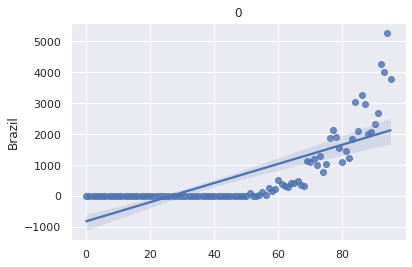

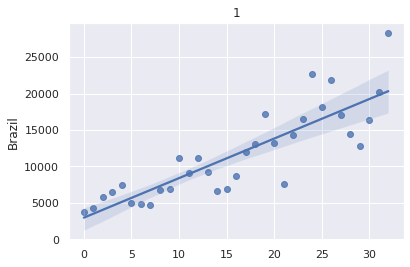

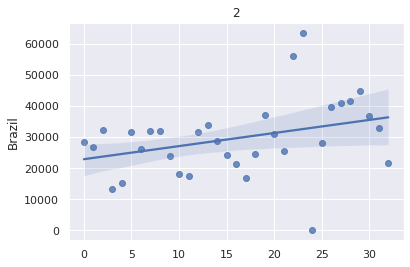

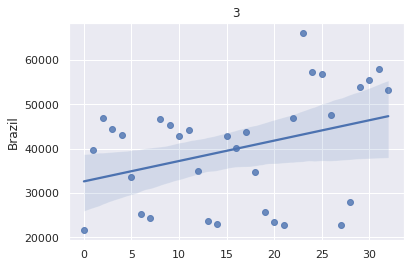

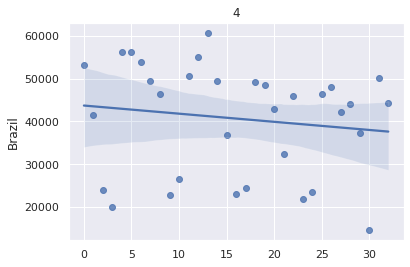

...

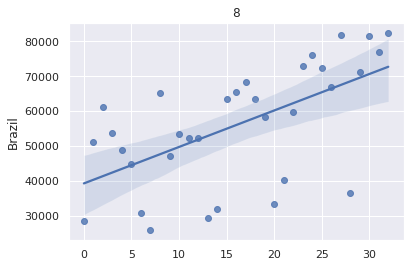

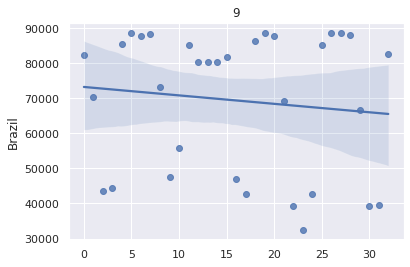

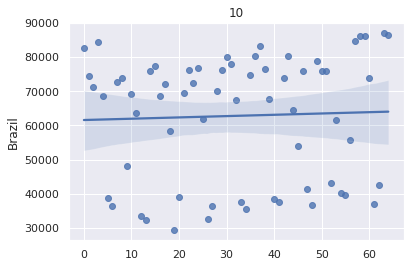

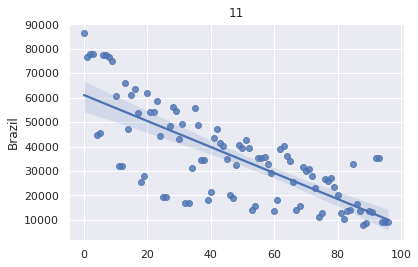

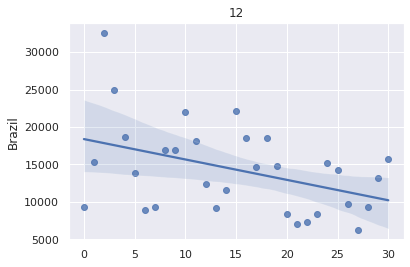

In [ ]:
for drift in drifts['Brazil'].groupby('drift'):
    #sns.regplot(drift.values)
    #print(drift[1]['Brazil'])
    fig, ax = plt.subplots()
    sns.regplot(drift[1]['Brazil'].reset_index(drop=True).index, drift[1]['Brazil'])
    plt.title(drift[0])

In [ ]:
np.rad2deg(np.arctan(1/2))

26.56505117707799

In [ ]:
np.rad2deg(np.arctan2([1], [1,0]))

array([ 88.03770939, -90.        ])

In [ ]:
a = -813.2399054982822
b = 30.95855941399892 
np.rad2deg(np.arctan2([b*y + a for y in range(10)], [x for x in range(10)]))

array([-90.        , -89.92675813, -89.84748062, -89.76138967,
       -89.66756794, -89.56492574, -89.45215861, -89.32769172,
       -89.18960604, -89.03553891])

In [ ]:
import math

In [ ]:
for a, b in zip(slope['Brazil'].values(), intercept['Brazil'].values()):
    print(a,b)
    #print(distance.cosine([0, a], [1, a+b]))
    angle = np.rad2deg(np.arctan2((30*b), (30 - 0)))
    print(angle)

30.95855941399892 -813.2399054982822
-89.92954631192107
542.235628342246 2972.078431372545
89.98072198339514
420.470588235294 22891.22816399286
89.9974970421392
459.7603609625669 32613.894830659512
89.99824320953408
-190.14070855614975 43708.03921568626
89.99868912491773
-255.13719405594424 33999.29790209791
89.99831479521544
680.7613636363636 20506.75757575756
89.99720600493492
140.9061188811191 41291.634965034966
89.99861241194372
1044.952540106952 39283.81996434936
89.99854149164841
-240.85895721925172 73258.01604278073
89.99921789064727
38.25506993007031 61597.33006993009
89.99906983339305
-531.4718204292026 61054.22470018938
89.99906155913388
-272.2999999999997 18382.790322580648
89.99688318375769


In [ ]:
df_slope = pd.DataFrame(slope).fillna(0)

In [ ]:
df_slope.style.format('{:+.0f}').to_latex('./latex/drift_slopes',  caption='Drift Slope', hrules=True, label='drift_slopes', position='H', position_float="centering", convert_css=True)

In [ ]:
df_slope.style.text_gradient(cmap='Greys').format('{:.0f}').to_latex('./latex/drift_slopes',  caption='Drift Slope', hrules=True, label='drift_slopes', position='H', position_float="centering", convert_css=True)
df_slope.style.text_gradient(cmap='Greys')

,Brazil,France,India,Italy,Mexico,Russia,South Africa,US,United Kingdom
0,30.958559,29.402770,13.882528,80.979121,7.372429,43.012853,1.940450,410.489135,64.402828
1,542.235628,27.385481,178.119318,-84.084572,74.783088,34.315508,35.364639,-242.500000,-96.318182
2,420.470588,1224.575869,363.673463,-5.939505,63.162767,-68.409091,159.400067,935.196809,-25.271725
3,459.760361,-1186.203877,1210.857286,3.786765,44.778409,-43.238971,80.503008,-687.354278,12.787767
4,-190.140709,165.433489,680.990642,29.862369,-59.232286,-21.880013,-226.912767,1891.752656,17.615307
5,-255.137194,58.360227,-252.060160,975.905414,6.452404,133.468583,-1.721591,54.430147,212.467246
6,680.761364,-277.898876,-1063.813503,-536.433489,85.838811,268.285428,255.291434,-4861.920455,304.178142
7,140.906119,179.580548,-342.724599,-19.054479,-243.831217,100.386757,-607.703209,-1115.634024,-394.243984
8,1044.952540,-247.052419,-441.903075,98.573776,-80.212893,-279.331217,-18.002010,571.716578,1532.675468
9,-240.858957,0.000000,-188.673797,-256.059094,-55.331551,-185.553810,46.461564,-980.238462,-485.186317


In [ ]:
df_slope.style.background_gradient(cmap='Greys').format('{:.0f}').to_latex('./latex/drift_slopes',  caption='Drift Slope', hrules=True, label='drift_slopes', position='H', position_float="centering", convert_css=True)
df_slope.style.background_gradient(cmap='Greys').format('{:.0f}')

,Brazil,France,India,Italy,Mexico,Russia,South Africa,US,United Kingdom
0,31,29,14,81,7,43,2,410,64
1,542,27,178,-84,75,34,35,-243,-96
2,420,1225,364,-6,63,-68,159,935,-25
3,460,-1186,1211,4,45,-43,81,-687,13
4,-190,165,681,30,-59,-22,-227,1892,18
5,-255,58,-252,976,6,133,-2,54,212
6,681,-278,-1064,-536,86,268,255,-4862,304
7,141,180,-343,-19,-244,100,-608,-1116,-394
8,1045,-247,-442,99,-80,-279,-18,572,1533
9,-241,0,-189,-256,-55,-186,46,-980,-485


# Oracle

In [ ]:
# selection = {}
# oracle = {}
# for country in countries:
#     selection[country] = {}
#     oracle[country] = {}
#     path = './outputs/'+country+'/preds/'
#     for split in ['AAO', 'ASO']:
#         tmp = pd.read_csv(path+split+'/best.csv', index_col=0)        
#         oracle[country][split] = tmp
#     for split in ['AADS', 'ASDS']:
#         tmp = pd.read_csv(path+split+'/selection.csv', index_col=0)        
#         selection[country][split] = tmp

In [ ]:
selection = pd.DataFrame()
oracle = pd.DataFrame()
selection_oracle = {}
for country in countries:
    path = './outputs/'+country+'/preds/'
    for split in ['AAO']:
        tmp = pd.read_csv(path+split+'/best.csv', index_col=0).reset_index(drop=True).iloc[-65:]
        oracle = oracle.append(tmp)
    for split in ['AADS']:
        tmp2 = pd.read_csv(path+split+'/selection.csv', index_col=0).reset_index(drop=True).iloc[-65:]
        selection = selection.append(tmp2)
    selection_oracle[country] = (tmp.eq(tmp2).sum()/len(tmp)).values[0]
oracle = oracle.reset_index(drop=True).rename({'0':'oracle'},axis=1)
selection = selection.reset_index(drop=True).rename({'0':'selection'},axis=1)

/tmp/ipykernel_4361/1158627580.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  oracle = oracle.append(tmp)
/tmp/ipykernel_4361/1158627580.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  selection = selection.append(tmp2)
/tmp/ipykernel_4361/1158627580.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  oracle = oracle.append(tmp)
/tmp/ipykernel_4361/1158627580.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  selection = selection.append(tmp2)
/tmp/ipykernel_4361/1158627580.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  oracle = ora

In [ ]:
selection2 = pd.DataFrame()
oracle2 = pd.DataFrame()
selection_oracle2 = {}
for country in countries:
    path = './outputs/'+country+'/preds/'
    for split in ['ASO']:
        tmp = pd.read_csv(path+split+'/best.csv', index_col=0).reset_index(drop=True).iloc[-65:]
        oracle2 = oracle2.append(tmp)
    for split in ['ASDS']:
        tmp2 = pd.read_csv(path+split+'/selection.csv', index_col=0).reset_index(drop=True).iloc[-65:]
        selection2 = selection2.append(tmp2)
    selection_oracle2[country] = (tmp.eq(tmp2).sum()/len(tmp)).values[0]
oracle2 = oracle2.reset_index(drop=True).rename({'0':'oracle'},axis=1)
selection2 = selection2.reset_index(drop=True).rename({'0':'selection'},axis=1)

/tmp/ipykernel_4361/2858918282.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  oracle2 = oracle2.append(tmp)
/tmp/ipykernel_4361/2858918282.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  selection2 = selection2.append(tmp2)
/tmp/ipykernel_4361/2858918282.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  oracle2 = oracle2.append(tmp)
/tmp/ipykernel_4361/2858918282.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  selection2 = selection2.append(tmp2)
/tmp/ipykernel_4361/2858918282.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  orac

In [ ]:
oracle2

,oracle
0,8
1,1
2,12
3,7
4,1
...,...
580,15
581,4
582,0
583,7


In [ ]:
so = pd.concat([pd.Series(selection_oracle), pd.Series(selection_oracle2)], axis=1) * 100
so.columns = ['AADS \% AAO','ASDS \% ASO']
so = pd.concat([so,pd.DataFrame(so.mean()).T]).rename({0:'Mean'})
so.style.format('{:.1f}').to_latex('./latex/selection_oracle',  caption='Dynamic Selection x Oracle', hrules=True, label='selection_oracle', position='H', position_float="centering")
so

,AADS \% AAO,ASDS \% ASO
Brazil,21.538462,12.307692
France,12.307692,18.461538
India,21.538462,20.000000
Italy,40.000000,23.076923
Mexico,20.000000,13.846154
Russia,30.769231,18.461538
South Africa,26.153846,13.846154
US,10.769231,13.846154
United Kingdom,30.769231,12.307692
Mean,23.760684,16.239316


In [ ]:
from sklearn.metrics import confusion_matrix

Text(48.5, 0.5, 'Selection')

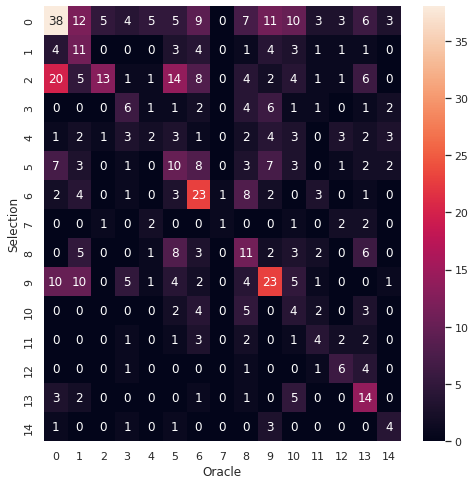

In [ ]:
fig, ax = plt.subplots(figsize=(8,8))
sns.heatmap(confusion_matrix(oracle, selection), annot=True, ax=ax, fmt='d')
#sns.heatmap(confusion_matrix(oracle, selection, normalize='true'), annot=True, ax=ax, fmt='.1g')
ax.set_xlabel('Oracle')
ax.set_ylabel('Selection')

In [ ]:
pd.concat([oracle, selection], axis=1)

,oracle,selection
0,8,4
1,6,8
2,4,8
3,0,1
4,1,1
...,...,...
580,3,9
581,4,9
582,9,9
583,9,9


In [ ]:
selectionw = pd.DataFrame()
oracle = pd.DataFrame()
selection_oracle = {}
for country in countries:
    path = './outputs/'+country+'/preds/'
    for split in ['AAO']:
        tmp = pd.read_csv(path+split+'/worst.csv', index_col=0).reset_index(drop=True).iloc[-65:]
        oracle = oracle.append(tmp)
    for split in ['AADS']:
        tmp2 = pd.read_csv(path+split+'/selection.csv', index_col=0).reset_index(drop=True).iloc[-65:]
        selection = selection.append(tmp2)
    selection_oracle[country] = (tmp.eq(tmp2).sum()/len(tmp)).values[0]
oracle = oracle.reset_index(drop=True).rename({'0':'oracle'},axis=1)
selection = selection.reset_index(drop=True).rename({'0':'selection'},axis=1)

/tmp/ipykernel_4361/1926090782.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  oracle = oracle.append(tmp)
/tmp/ipykernel_4361/1926090782.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  selection = selection.append(tmp2)
/tmp/ipykernel_4361/1926090782.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  oracle = oracle.append(tmp)
/tmp/ipykernel_4361/1926090782.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  selection = selection.append(tmp2)
/tmp/ipykernel_4361/1926090782.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  oracle = ora

In [ ]:
selection2 = pd.DataFrame()
oracle2 = pd.DataFrame()
selection_oracle2w = {}
for country in countries:
    path = './outputs/'+country+'/preds/'
    for split in ['ASO']:
        tmp = pd.read_csv(path+split+'/worst.csv', index_col=0).reset_index(drop=True).iloc[-65:]
        oracle2 = oracle2.append(tmp)
    for split in ['ASDS']:
        tmp2 = pd.read_csv(path+split+'/selection.csv', index_col=0).reset_index(drop=True).iloc[-65:]
        selection2 = selection2.append(tmp2)
    selection_oracle2w[country] = (tmp.eq(tmp2).sum()/len(tmp)).values[0]
oracle2 = oracle2.reset_index(drop=True).rename({'0':'oracle'},axis=1)
selection2 = selection2.reset_index(drop=True).rename({'0':'selection'},axis=1)

/tmp/ipykernel_4361/2379802963.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  oracle2 = oracle2.append(tmp)
/tmp/ipykernel_4361/2379802963.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  selection2 = selection2.append(tmp2)
/tmp/ipykernel_4361/2379802963.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  oracle2 = oracle2.append(tmp)
/tmp/ipykernel_4361/2379802963.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  selection2 = selection2.append(tmp2)
/tmp/ipykernel_4361/2379802963.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  orac

In [ ]:
so = pd.concat([pd.Series(selection_oracle2), pd.Series(selection_oracle2w)], axis=1) * 100
so.columns = ['ASDS \% Oracle','ASDS \% Worst']
so = pd.concat([so,pd.DataFrame(so.mean()).T]).rename({0:'Mean'})
so.style.format('{:.1f}').to_latex('./latex/selection_roracle',  caption='Dynamic Selection x Reverse Oracle', hrules=True, label='selection_roracle', position='H', position_float="centering")
so

,ASDS \% Oracle,ASDS \% Worst
Brazil,12.307692,0.000000
France,18.461538,7.692308
India,20.000000,3.076923
Italy,23.076923,3.076923
Germany,1.538462,0.000000
Russia,18.461538,4.615385
South Africa,13.846154,10.769231
US,13.846154,1.538462
United Kingdom,12.307692,4.615385
Japan,10.769231,0.000000


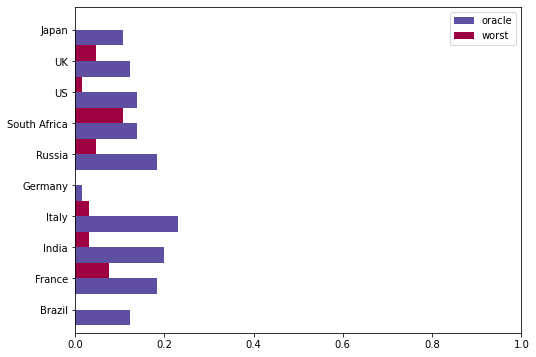

In [ ]:
pd.concat([pd.Series(selection_oracle2), pd.Series(selection_oracle2w)], axis=1).rename({0:'oracle', 1:'worst'}, axis=1).rename({'United Kingdom': 'UK'}).plot.barh(xlim=(0,1), width=1, cmap='Spectral_r', figsize=(8,6))
plt.legend()
plt.savefig(f"./images/oracle.pdf")

AttributeError: 'Rectangle' object has no property 'y_label'

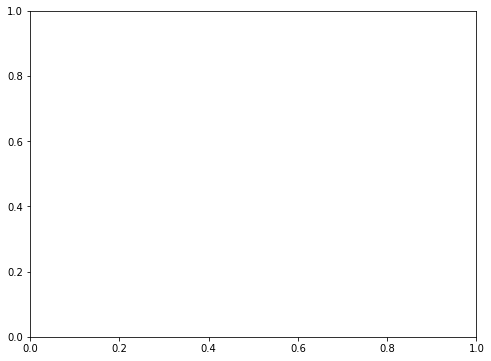

In [ ]:
table = pd.concat([pd.Series(selection_oracle2), pd.Series(selection_oracle2w)], axis=1).rename({0:'oracle', 1:'worst'}, axis=1).rename({'United Kingdom': 'UK'}).round(2)

ax = table.plot.barh( figsize=(8,6),fontsize=14, xlim=(0,1), xlabel='Country', y_label='Proportion', width=0.85, ylabel='MAPE', rot=0.90, cmap='Spectral_r')
ax.legend(fontsize=14)
ax.xaxis.label.set_size(12)
ax.yaxis.label.set_size(12)

for container in ax.containers:
    ax.bar_label(container, fontsize=14)

new_patches = []
for patch in reversed(ax.patches):
    bb = patch.get_bbox()
    color=patch.get_facecolor()
    p_bbox = FancyBboxPatch((bb.xmin, bb.ymin),
                        abs(bb.width), abs(bb.height),
                        boxstyle="round,pad=-0.001,rounding_size=0.01",
                        ec="none", fc=color,
                        mutation_aspect=4
                        )
    patch.remove()
    new_patches.append(p_bbox)

for patch in new_patches:
    ax.add_patch(patch)
plt.savefig(f"./images/oracle.pdf")

In [ ]:
oracle_df = pd.concat([pd.Series(selection_oracle2), pd.Series(selection_oracle2w)], axis=1).rename({0:'oracle', 1:'worst'}, axis=1).rename({'United Kingdom': 'UK'})
oracle_df

,oracle,worst
Brazil,0.169231,0.000000
France,0.261538,0.015385
India,0.184615,0.030769
Italy,0.184615,0.000000
Mexico,0.138462,0.030769
Russia,0.107692,0.015385
South Africa,0.046154,0.046154
US,0.061538,0.015385
UK,0.107692,0.046154


In [ ]:
oracle_df['other'] = 1 - oracle_df['oracle'] +  oracle_df['worst']

In [ ]:
import plotly

In [ ]:
import bokeh

Index(['oracle', 'worst'], dtype='object')
Index(['oracle', 'worst'], dtype='object')
Index(['oracle', 'worst'], dtype='object')
Index(['oracle', 'worst'], dtype='object')
Index(['oracle', 'worst'], dtype='object')
Index(['oracle', 'worst'], dtype='object')
Index(['oracle', 'worst'], dtype='object')
Index(['oracle', 'worst'], dtype='object')
Index(['oracle', 'worst'], dtype='object')


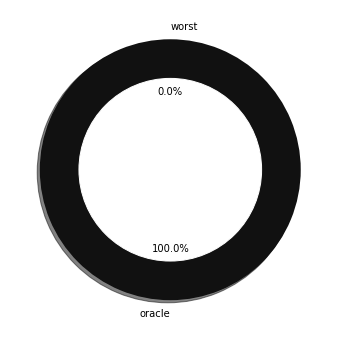

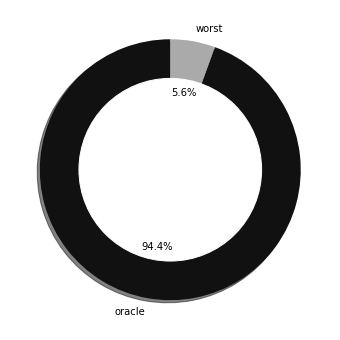

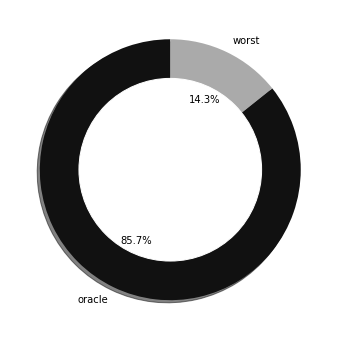

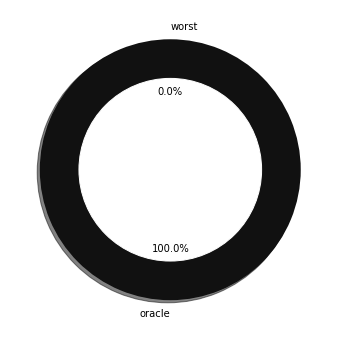

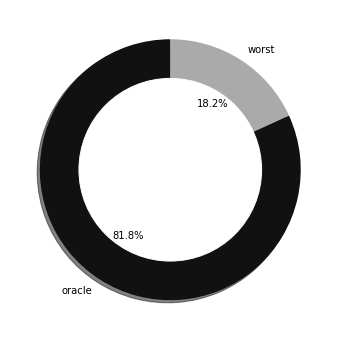

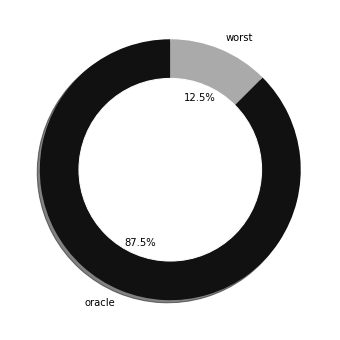

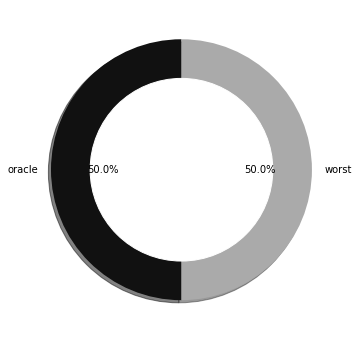

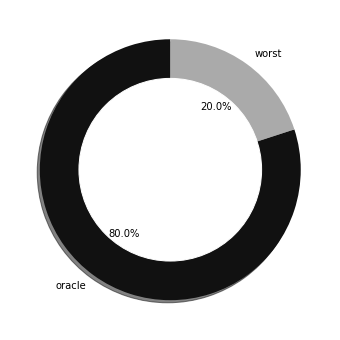

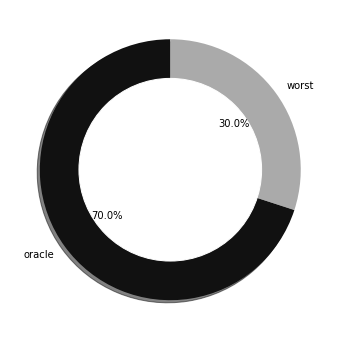

In [ ]:
for row in oracle_df.iterrows():
    fig, ax = plt.subplots(figsize=(6,6))
    print(row[1].index)
    plt.pie(row[1], labels=row[1].index, autopct='%1.0f%%', startangle=90, labeldistance=None, counterclock=False, textprops={'fontsize':18})

    my_circle=plt.Circle( (0,0), 0.7, color='white')
    p=plt.gcf()
    p.gca().add_artist(my_circle)
    ax.legend(fontsize=16)
    #plt.legend()
    #plt.title(row[0])
    plt.savefig(f"./images/oracle/oracle_{row[0]}.pdf")
    # break

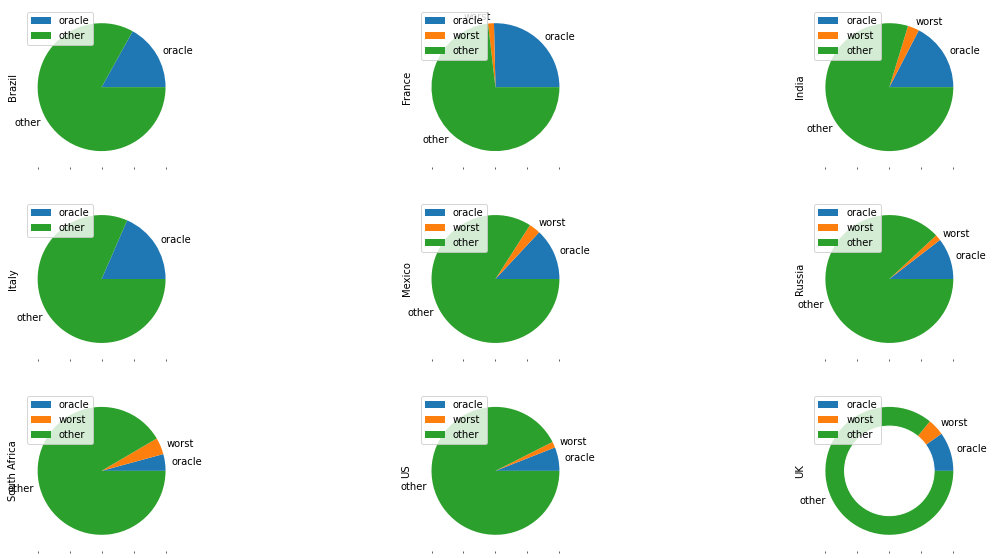

In [ ]:
axs = oracle_df.T.plot.pie(subplots=True, figsize=(20,10), layout=(3,3))
my_circle=plt.Circle( (0,0), 0.7, color='white')
p=plt.gcf()
p.gca().add_artist(my_circle)
    

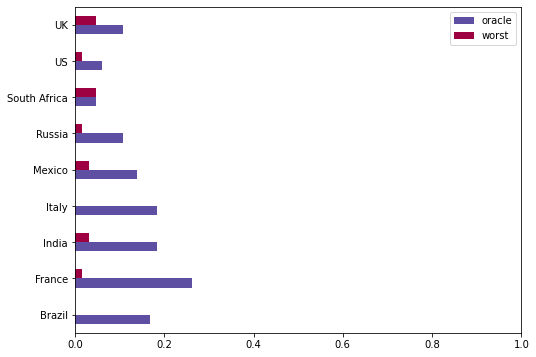

In [ ]:
    pd.concat([pd.Series(selection_oracle2), pd.Series(selection_oracle2w)], axis=1).rename({0:'oracle', 1:'worst'}, axis=1).rename({'United Kingdom': 'UK'}).plot.barh(xlim=(0,1), cmap='Spectral_r', figsize=(8,6))
plt.legend()

<AxesSubplot:>

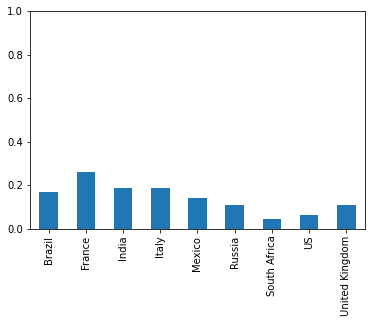

In [ ]:
pd.Series(selection_oracle2).plot.bar(ylim=(0,1))

<AxesSubplot:>

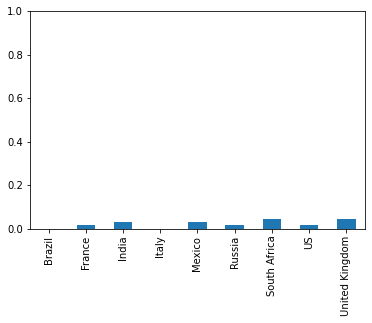

In [ ]:
pd.Series(selection_oracle2w).plot.bar(ylim=(0,1))

## Selection x Oracle


In [144]:
asds2 = pd.read_csv('./outputs/Brazil/preds/ASDS3/ASDS3_test.csv')
selection2 = pd.read_csv('./outputs/Brazil/preds/ASDS3/selection.csv')
aso2 = pd.read_csv('./outputs/Brazil/preds/ASO2/ASO2_test.csv')
oracle2 = pd.read_csv('./outputs/Brazil/preds/ASO2/best.csv')

In [145]:
selection_oracle = pd.concat([data['Brazil']['test_data'][-65:].reset_index(drop=True),
           asds2.drop('Unnamed: 0', axis=1), selection2.drop('Unnamed: 0', axis=1),
           aso2[-65:].drop('Unnamed: 0', axis=1).reset_index(drop=True), oracle2[-65:].drop('Unnamed: 0', axis=1).reset_index(drop=True)], axis=1)


In [146]:
selection_oracle.columns = ['teste', 'asds', 'seleção', 'aso', 'oracle']


In [147]:
selection_oracle['erro seleção'] =  selection_oracle['asds'] - selection_oracle['teste']
selection_oracle['erro oracle'] = selection_oracle['aso'] - selection_oracle['teste']

In [148]:
selection_oracle['s = o'] = selection_oracle['seleção'] == selection_oracle['oracle']
selection_oracle['s < o'] = selection_oracle['erro seleção'].abs() < selection_oracle['erro oracle'].abs()

In [151]:
selection_oracle[['teste','seleção', 'erro seleção', 'oracle', 'erro oracle', 's = o']]

,teste,seleção,erro seleção,oracle,erro oracle,s = o,s < o
0,13686.0,10,-187.517146,10,-187.517146,True,False
1,12681.0,10,-1837.235227,3,-467.678248,False,False
2,10012.0,10,2294.099839,12,27.009296,False,False
3,6130.0,10,3823.332764,11,-796.184882,False,False
4,4626.0,10,4195.247260,0,491.380342,False,False
...,...,...,...,...,...,...,...
60,6952.0,3,-2228.222631,4,-95.703254,False,False
61,9052.0,3,-2057.936264,10,1668.376669,False,False
62,9761.0,3,-706.315081,12,-706.127230,False,False
63,12618.0,3,-3436.495087,10,-1154.292190,False,False


In [153]:
selection_oracle[['teste','seleção', 'erro seleção', 'oracle', 'erro oracle', 's = o']].style.format('{:,.0f}').to_latex('./latex/selorcbr',  caption='Selecao Oracle Brasil', hrules=True, label='selorcbr', position='H', position_float="centering")

# Benchmarking

In [62]:
# lstm_mean = lstm.groupby('data')[metrics].mean()
# elm_mean = elm.groupby('data')[metrics].mean()
# mlp_mean = mlp.groupby('data')[metrics].mean()
svm_pool = svm[['data', 'mape']].sort_values('data').rename({'mape': 'svm'}, axis=1).set_index('data')
elm_mean = elm.groupby('data')['mape'].mean().sort_index().rename( 'elm')
mlp_mean = mlp.groupby('data')['mape'].mean().sort_index().rename( 'mlp')
lstm_mean = lstm.groupby('data')['mape'].mean().sort_index().rename('lstm')
xgb_mean = xgb.groupby('data')['mape'].mean().sort_index().rename('xgb')
# ens_pool = ens[['data', 'mape']].sort_values('data').rename({'mape': 'ensemble'}, axis=1).set_index('data')
ens_median = ens_median[['data', 'mape']].sort_values('data').rename({'mape': 'ensemble_median'}, axis=1).set_index('data')
ens_mean = ens_mean[['data', 'mape']].sort_values('data').rename({'mape': 'ensemble_mean'}, axis=1).set_index('data')

In [ ]:
# # lstm_mean = lstm.groupby('data')[metrics].mean()
# # elm_mean = elm.groupby('data')[metrics].mean()
# # mlp_mean = mlp.groupby('data')[metrics].mean()
# svm_pool = svm[['data', 'rmse']].sort_values('data').rename({'rmse': 'svm'}, axis=1).set_index('data')
# # ens_pool = ens[['data', 'rmse']].sort_values('data').rename({'rmse': 'ensemble'}, axis=1).set_index('data')
# elm_mean = elm.groupby('data')['rmse'].mean().sort_index().rename( 'elm')
# mlp_mean = mlp.groupby('data')['rmse'].mean().sort_index().rename( 'mlp')
# lstm_mean = lstm.groupby('data')['rmse'].mean().sort_index().rename('lstm')
# xgb_mean = xgb.groupby('data')['rmse'].mean().sort_index().rename('xgb')
# ens_median = ens_median[['data', 'rmse']].sort_values('data').rename({'rmse': 'ensemble_median'}, axis=1).set_index('data')
# ens_mean = ens_mean[['data', 'rmse']].sort_values('data').rename({'rmse': 'ensemble_mean'}, axis=1).set_index('data')

In [ ]:
# # lstm_mean = lstm.groupby('data')[metrics].mean()
# # elm_mean = elm.groupby('data')[metrics].mean()
# # mlp_mean = mlp.groupby('data')[metrics].mean()
# svm_pool = svm[['data', 'mae']].sort_values('data').rename({'rmse': 'svm'}, axis=1).set_index('data')
# # ens_pool = ens[['data', 'mae']].sort_values('data').rename({'rmse': 'ensemble'}, axis=1).set_index('data')
# elm_mean = elm.groupby('data')['mae'].mean().sort_index().rename( 'elm')
# mlp_mean = mlp.groupby('data')['mae'].mean().sort_index().rename( 'mlp')
# lstm_mean = lstm.groupby('data')['mae'].mean().sort_index().rename('lstm')
# xgb_mean = xgb.groupby('data')['mae'].mean().sort_index().rename('xgb')
# ens_median = ens_median[['data', 'mae']].sort_values('data').rename({'mae': 'ensemble_median'}, axis=1).set_index('data')
# ens_mean = ens_mean[['data', 'mae']].sort_values('data').rename({'mae': 'ensemble_mean'}, axis=1).set_index('data')

KeyError: "None of [Index(['data', 'mae'], dtype='object')] are in the [columns]"

In [32]:
lstm['data'].unique()

array(['Spain', 'Qatar', 'Portugal', 'Japan', 'Israel', 'Iran', 'Germany',
       'China', 'Argentina', 'Russia', 'India', 'South Africa', 'France',
       'Italy', 'United Kingdom', 'US', 'Mexico', 'Brazil'], dtype=object)

In [63]:
models = [rw_pool, arima_pool,sarima_pool,svm_pool,elm_mean,mlp_mean,lstm_mean,xgb_mean,ens_mean,ens_median,ASDS_pool,ASO_pool]
for i, m in enumerate(models):
    print(i)
    print(m.shape)

0
(20, 1)
1
(21, 1)
2
(19, 1)
3
(20, 1)
4
(18,)
5
(20,)
6
(18,)
7
(18,)
8
(20, 1)
9
(20, 1)
10
(23, 1)
11
(23, 1)


In [64]:
tabelao = []

In [70]:
tabelao = rw_pool.merge(arima_pool, on='data').merge(sarima_pool, on='data').merge(svm_pool, on='data').merge(elm_mean, on='data').merge(mlp_mean, on='data').merge(lstm_mean, on='data').merge(xgb_mean, on='data').merge(ens_mean, on='data').merge(ens_median, on='data').merge(ASDS_pool, on='data').merge(ASO_pool, on='data')
# tabelao = pd.concat([tabelao,pd.DataFrame(tabelao.median()).T]).rename({0:'Median'}).T
tabelao.drop_duplicates(inplace=True)
tabelao

,rw,arima,sarima,svm,elm,mlp,lstm,xgb,ensemble_mean,ensemble_median,ASDS,Oracle
data,,,,,,,,,,,,
Argentina,0.319860,0.213162,0.217954,0.199342,0.347634,1.504076,0.900220,0.254696,0.382220,0.224339,0.222941,0.077475
Brazil,0.357975,0.301951,0.354467,0.299192,0.607440,0.877079,0.953209,0.675695,0.503089,0.570153,0.242931,0.093701
France,0.649109,0.648383,0.558652,0.552907,0.535517,0.519627,0.660487,0.548905,0.555761,0.558625,0.563426,0.203930
Germany,0.313732,0.155124,0.153772,0.558397,0.868926,0.305521,0.440925,0.493560,0.310704,0.361708,0.155848,0.033575
India,0.199770,0.201685,0.231853,0.142033,0.316971,2.089111,2.492748,0.220612,0.712924,0.212725,0.139299,0.051558
Iran,0.173952,0.086472,0.090824,0.076475,0.202300,0.206787,0.273112,0.377935,0.108854,0.075144,0.169312,0.046706
Israel,0.350565,0.422469,0.454731,0.370425,0.532713,0.592311,0.369568,0.416625,0.357478,0.352897,0.344727,0.126172
Italy,0.224039,0.167358,0.169692,0.154949,0.199660,0.237864,0.286888,0.219109,0.194395,0.178978,0.170671,0.074828
Japan,0.322294,0.460748,0.259343,0.290054,0.996203,3.556101,2.821831,1.805250,0.320319,0.335011,0.197574,0.098746


In [74]:
(tabelao.T * 100).round(3).drop('Oracle').rank()

data,Argentina,Brazil,France,Germany,India,Iran,Israel,Italy,Japan,Mexico,Portugal,Qatar,Russia,South Africa,Spain,US,United Kingdom
rw,7.0,5.0,10.0,6.0,3.0,7.0,2.0,9.0,5.0,11.0,10.0,3.0,4.0,7.0,11.0,11.0,5.0
arima,2.0,3.0,9.0,2.0,4.0,3.0,8.0,2.0,7.0,2.0,3.0,2.0,3.0,4.0,4.0,5.0,4.0
sarima,3.0,4.0,7.0,1.0,7.0,4.0,9.0,3.0,2.0,1.0,6.0,6.0,5.0,3.0,1.0,4.0,3.0
svm,1.0,2.0,4.0,10.0,2.0,2.0,6.0,1.0,3.0,4.0,1.0,5.0,2.0,1.0,7.0,1.0,2.0
elm,8.0,8.0,2.0,11.0,8.0,8.0,10.0,7.0,8.0,7.0,7.0,8.0,7.0,10.0,10.0,7.0,7.0
mlp,11.0,10.0,1.0,4.0,10.0,9.0,11.0,10.0,11.0,6.0,9.0,11.0,10.0,11.0,5.0,2.0,9.0
lstm,10.0,11.0,11.0,8.0,11.0,10.0,5.0,11.0,10.0,8.0,11.0,10.0,11.0,8.0,9.0,9.0,10.0
xgb,6.0,9.0,3.0,9.0,6.0,11.0,7.0,8.0,9.0,9.0,8.0,7.0,9.0,5.0,2.0,10.0,11.0
ensemble_mean,9.0,6.0,5.0,5.0,9.0,5.0,4.0,6.0,4.0,3.0,4.0,9.0,8.0,9.0,6.0,6.0,6.0
ensemble_median,5.0,7.0,6.0,7.0,5.0,1.0,3.0,5.0,6.0,5.0,2.0,4.0,6.0,6.0,3.0,3.0,8.0


In [66]:
tabelao = (tabelao * 100).round(3).loc[countries]
tabelao

,rw,arima,sarima,svm,elm,mlp,lstm,xgb,ensemble_mean,ensemble_median,ASDS,Oracle
data,,,,,,,,,,,,
Brazil,35.797,30.195,35.447,29.919,60.744,87.708,95.321,67.569,50.309,57.015,24.293,9.370
France,64.911,64.838,55.865,55.291,53.552,51.963,66.049,54.891,55.576,55.863,56.343,20.393
India,19.977,20.169,23.185,14.203,31.697,208.911,249.275,22.061,71.292,21.273,13.930,5.156
Italy,22.404,16.736,16.969,15.495,19.966,23.786,28.689,21.911,19.440,17.898,17.067,7.483
Germany,31.373,15.512,15.377,55.840,86.893,30.552,44.092,49.356,31.070,36.171,15.585,3.358
Russia,2.123,2.100,2.205,1.853,7.590,16.742,22.419,16.442,7.950,5.566,1.610,0.768
South Africa,60.702,50.775,47.515,43.299,93.831,228.848,62.533,51.459,75.307,53.233,44.136,14.902
US,55.484,28.887,28.556,25.120,32.523,26.640,37.805,49.835,30.310,28.266,34.525,12.312
United Kingdom,9.320,9.303,8.461,8.089,15.459,18.946,23.059,23.767,14.862,17.057,7.733,2.998


In [67]:
tabelao.loc[countries]

,rw,arima,sarima,svm,elm,mlp,lstm,xgb,ensemble_mean,ensemble_median,ASDS,Oracle
data,,,,,,,,,,,,
Brazil,35.797,30.195,35.447,29.919,60.744,87.708,95.321,67.569,50.309,57.015,24.293,9.370
France,64.911,64.838,55.865,55.291,53.552,51.963,66.049,54.891,55.576,55.863,56.343,20.393
India,19.977,20.169,23.185,14.203,31.697,208.911,249.275,22.061,71.292,21.273,13.930,5.156
Italy,22.404,16.736,16.969,15.495,19.966,23.786,28.689,21.911,19.440,17.898,17.067,7.483
Germany,31.373,15.512,15.377,55.840,86.893,30.552,44.092,49.356,31.070,36.171,15.585,3.358
Russia,2.123,2.100,2.205,1.853,7.590,16.742,22.419,16.442,7.950,5.566,1.610,0.768
South Africa,60.702,50.775,47.515,43.299,93.831,228.848,62.533,51.459,75.307,53.233,44.136,14.902
US,55.484,28.887,28.556,25.120,32.523,26.640,37.805,49.835,30.310,28.266,34.525,12.312
United Kingdom,9.320,9.303,8.461,8.089,15.459,18.946,23.059,23.767,14.862,17.057,7.733,2.998


In [ ]:
# tabelao.T.to_excel('./latex/tabelao_mae.xlsx')
# tabelao.T

data,Argentina,Brazil,France,Germany,India,Iran,Israel,Italy,Japan,Mexico,Portugal,Qatar,Russia,South Africa,US,United Kingdom
rw,1522.539683,2304.650794,13215.841270,10707.555556,2101.904762,641.555556,362.349206,4837.190476,40.857143,2972.158730,1392.333333,17.492063,669.253968,3227.063492,59247.857143,5899.571429
arima,1544.767894,1795.296041,17946.024122,5560.285737,2184.730028,445.414850,379.102691,4352.452591,54.645251,2061.778021,1090.516808,19.761804,662.937500,3161.238581,34428.822471,5693.493532
sarima,1668.932005,2083.958481,16633.427616,5002.880118,2502.622856,457.784477,403.689479,4311.362184,34.142984,2119.519661,1104.391067,20.126316,743.307200,2949.562839,31723.921103,5308.024776
mae,1602.937153,1718.825474,27482.751814,26665.920479,1698.323132,326.770353,419.663091,4266.287927,34.021968,2157.050155,1117.478920,21.827419,598.097233,2931.430513,32337.247618,5268.597178
elm,2139.290470,2758.259300,18281.701000,33644.968400,3064.901130,843.617715,454.766986,8884.526950,167.011271,2097.835490,1450.651690,21.517329,2631.251120,3459.197370,44789.371800,14335.463000
mlp,3469.553069,3586.266455,16721.355531,15219.569633,18793.669138,612.433756,450.731729,7672.765635,448.352338,2030.080457,1634.297630,54.173411,5895.974552,3379.430546,41214.653091,18703.607659
lstm,3236.291840,3977.450278,26802.170913,20259.373003,22461.164136,935.999361,403.355667,8765.064064,372.067332,2051.244979,1971.117562,42.940538,7912.187669,3148.500953,59772.605157,22011.385162
xgb,2455.832790,3068.327469,26507.575590,23366.990341,2336.436203,1226.308898,366.355421,7799.870506,293.372972,2214.899870,1808.193454,18.826039,5819.015381,2812.353392,65188.642737,22873.022522
ensemble_mean,5438.136664,2759.742269,42075.222663,19822.396030,6885.607901,630.619133,665.805157,18987.581802,56.717993,2935.248077,3051.913177,55.147369,3451.356008,4871.126787,79210.369799,27769.226087
ensemble_median,4481.203053,3021.726730,37535.407655,25098.446843,3348.001922,509.339326,655.904999,19797.860326,53.855178,2991.675129,2985.024305,49.040977,2500.013313,4925.138220,74503.976977,33841.214652


In [ ]:
# tabelao.style.highlight_max(axis=1,
#                            props='bfseries: ;').format('{:.2f}').to_latex('./latex/bench_r2',  caption='Benchmarking R2', hrules=True, label='bench_r2', position='H', position_float="centering")

In [79]:
tabelao.T.drop('Oracle')


data,Argentina,Brazil,France,Germany,India,Iran,Israel,Italy,Japan,Mexico,Portugal,Qatar,Russia,South Africa,Spain,US,United Kingdom
rw,0.319860,0.357975,0.649109,0.313732,0.199770,0.173952,0.350565,0.224039,0.322294,0.895521,0.327978,0.082874,0.021227,0.607015,0.583901,0.554837,0.093199
arima,0.213162,0.301951,0.648383,0.155124,0.201685,0.086472,0.422469,0.167358,0.460748,0.518124,0.210909,0.082314,0.021002,0.507746,0.340680,0.288871,0.093027
sarima,0.217954,0.354467,0.558652,0.153772,0.231853,0.090824,0.454731,0.169692,0.259343,0.478092,0.226821,0.085669,0.022047,0.475152,0.305613,0.285557,0.084614
svm,0.199342,0.299192,0.552907,0.558397,0.142033,0.076475,0.370425,0.154949,0.290054,0.556492,0.197458,0.085547,0.018530,0.432990,0.387039,0.251200,0.080888
elm,0.347634,0.607440,0.535517,0.868926,0.316971,0.202300,0.532713,0.199660,0.996203,0.601334,0.254246,0.093498,0.075898,0.938308,0.448790,0.325227,0.154591
mlp,1.504076,0.877079,0.519627,0.305521,2.089111,0.206787,0.592311,0.237864,3.556101,0.598331,0.288542,0.280067,0.167425,2.288476,0.343281,0.266402,0.189458
lstm,0.900220,0.953209,0.660487,0.440925,2.492748,0.273112,0.369568,0.286888,2.821831,0.664636,0.337429,0.196893,0.224189,0.625327,0.414791,0.378054,0.230593
xgb,0.254696,0.675695,0.548905,0.493560,0.220612,0.377935,0.416625,0.219109,1.805250,0.691948,0.263204,0.087786,0.164420,0.514594,0.307937,0.498346,0.237670
ensemble_mean,0.382220,0.503089,0.555761,0.310704,0.712924,0.108854,0.357478,0.194395,0.320319,0.522217,0.218594,0.103404,0.079501,0.753074,0.343807,0.303097,0.148622
ensemble_median,0.224339,0.570153,0.558625,0.361708,0.212725,0.075144,0.352897,0.178978,0.335011,0.563405,0.209610,0.084321,0.055659,0.532330,0.337894,0.282656,0.170566


In [68]:
tabelao.T.drop('Oracle').style.highlight_min(axis=0,
                           props='bfseries: ;').format('{:.3f}').to_latex('./latex/bench_mape1',  caption='Benchmarking MAPE', hrules=True, label='bench_mape', position='H', position_float="centering")

In [69]:
tabelao.T.style.format('{:.3f}').to_latex('./latex/bench_mape2',  caption='Benchmarking MAPE', hrules=True, label='bench_mape', position='H', position_float="centering")

In [ ]:
tabelao['ASDS'].values

array([23.12731579, 29.13251251, 15.33683767, 11.26636195, 61.28749949,
        1.42171344, 30.91883462,  6.14767053, 19.23207673])

In [80]:
tabelao

,rw,arima,sarima,svm,elm,mlp,lstm,xgb,ensemble_mean,ensemble_median,ASDS,Oracle
data,,,,,,,,,,,,
Argentina,0.319860,0.213162,0.217954,0.199342,0.347634,1.504076,0.900220,0.254696,0.382220,0.224339,0.222941,0.077475
Brazil,0.357975,0.301951,0.354467,0.299192,0.607440,0.877079,0.953209,0.675695,0.503089,0.570153,0.242931,0.093701
France,0.649109,0.648383,0.558652,0.552907,0.535517,0.519627,0.660487,0.548905,0.555761,0.558625,0.563426,0.203930
Germany,0.313732,0.155124,0.153772,0.558397,0.868926,0.305521,0.440925,0.493560,0.310704,0.361708,0.155848,0.033575
India,0.199770,0.201685,0.231853,0.142033,0.316971,2.089111,2.492748,0.220612,0.712924,0.212725,0.139299,0.051558
Iran,0.173952,0.086472,0.090824,0.076475,0.202300,0.206787,0.273112,0.377935,0.108854,0.075144,0.169312,0.046706
Israel,0.350565,0.422469,0.454731,0.370425,0.532713,0.592311,0.369568,0.416625,0.357478,0.352897,0.344727,0.126172
Italy,0.224039,0.167358,0.169692,0.154949,0.199660,0.237864,0.286888,0.219109,0.194395,0.178978,0.170671,0.074828
Japan,0.322294,0.460748,0.259343,0.290054,0.996203,3.556101,2.821831,1.805250,0.320319,0.335011,0.197574,0.098746


In [ ]:
tabelao['rw'].div(tabelao['ASDS'].values, axis=0)

Brazil            1.578332
France            2.348421
India             1.492503
Italy             1.110787
Mexico            1.632065
Russia            1.191367
South Africa      1.245249
United Kingdom    1.065449
Median            1.367767
Name: rw, dtype: float64

In [ ]:
tabelao = tabelao.T

In [ ]:
tabelao_diffp = ((tabelao.div(tabelao['ASDS'].values, axis=0) -1 ) * 100).round(2)
tabelao_diffp

,rw,arima,sarima,svm,elm,mlp,lstm,xgb,ensemble_mean,ensemble_median,ASDS
data,,,,,,,,,,,
Brazil,51.44,27.75,49.96,26.57,156.94,271.02,303.21,185.83,112.82,141.20,0.0
France,23.17,23.04,6.02,4.91,1.61,-1.40,25.33,4.16,5.46,6.00,0.0
India,63.37,64.92,89.62,16.11,159.20,1608.18,1938.18,80.38,482.91,73.92,0.0
Italy,44.70,8.14,9.63,0.06,29.01,53.68,85.34,41.54,25.58,15.63,0.0
Mexico,42.60,-17.50,-23.87,-11.39,-4.25,-4.73,5.83,10.18,-16.85,-10.29,0.0
Russia,14.59,13.51,18.92,0.00,310.27,804.86,1111.89,788.65,329.73,201.08,0.0
South Africa,66.53,39.29,30.37,18.79,157.42,527.85,71.55,41.18,106.61,46.04,0.0
US,51.42,-21.15,-22.05,-31.44,-11.24,-27.29,3.19,36.00,-17.28,-22.84,0.0
United Kingdom,33.72,33.43,21.38,16.07,121.81,171.88,230.85,241.03,113.20,144.76,0.0


In [ ]:
tabelao

,rw,arima,sarima,svm,elm,mlp,lstm,xgb,ensemble_mean,ensemble_median,ASDS
data,,,,,,,,,,,
Brazil,0.357975,0.354467,0.354467,0.298463,0.543100,0.880123,0.924817,0.529786,0.485122,0.471516,0.231273
Brazil,0.357975,0.292576,0.354467,0.298463,0.543100,0.880123,0.924817,0.529786,0.485122,0.471516,0.231273
France,0.666705,0.565879,0.565879,0.537097,0.587077,0.533993,0.584963,0.501092,0.540242,0.568810,0.291325
France,0.666705,0.704297,0.565879,0.537097,0.587077,0.533993,0.584963,0.501092,0.540242,0.568810,0.291325
India,0.199770,0.203610,0.231853,0.141001,0.271828,1.737628,2.345428,0.197834,0.663829,0.235945,0.153368
India,0.199770,0.231853,0.231853,0.141001,0.271828,1.737628,2.345428,0.197834,0.663829,0.235945,0.153368
Italy,0.200616,0.150645,0.150645,0.135435,0.141568,0.242457,0.248320,0.175847,0.159084,0.144619,0.112664
Italy,0.200616,0.148364,0.150645,0.135435,0.141568,0.242457,0.248320,0.175847,0.159084,0.144619,0.112664
Mexico,0.895521,0.478092,0.478092,0.422417,0.679371,0.760221,0.661635,0.706181,0.553037,0.494624,0.612875


In [85]:
tabelao_diffp2 = ((tabelao.drop('Oracle', axis=1).div(tabelao.drop('Oracle', axis=1).min(axis=1).values, axis=0) - 1) * 100).round(2).T
tabelao_diffp2

data,Argentina,Brazil,France,Germany,India,Iran,Israel,Italy,Japan,Mexico,Portugal,Qatar,Russia,South Africa,Spain,US,United Kingdom
rw,60.46,47.36,24.92,104.02,43.41,131.49,1.69,44.59,63.13,87.31,66.10,30.59,31.88,40.19,91.06,120.87,20.52
arima,6.93,24.30,24.78,0.88,44.79,15.07,22.55,8.01,133.20,8.37,6.81,29.71,30.48,17.26,11.47,15.00,20.30
sarima,9.34,45.91,7.51,0.00,66.44,20.87,31.91,9.51,31.26,0.00,14.87,35.00,36.97,9.74,0.00,13.68,9.42
svm,0.00,23.16,6.40,263.13,1.96,1.77,7.45,0.00,46.81,16.40,0.00,34.81,15.12,0.00,26.64,0.00,4.60
elm,74.39,150.05,3.06,465.07,127.55,169.22,54.53,28.85,404.22,25.78,28.76,47.33,371.54,116.70,46.85,29.47,99.91
mlp,654.52,261.04,0.00,98.68,1399.74,175.19,71.82,53.51,1699.88,25.15,46.13,341.33,940.17,428.53,12.33,6.05,145.00
lstm,351.60,292.38,27.11,186.74,1689.50,263.45,7.21,85.15,1328.24,39.02,70.89,210.27,1292.83,44.42,35.72,50.50,198.19
xgb,27.77,178.14,5.63,220.97,58.37,402.95,20.86,41.41,813.71,44.73,33.30,38.33,921.50,18.85,0.76,98.39,207.34
ensemble_mean,91.74,107.09,6.95,102.05,411.80,44.86,3.70,25.46,62.13,9.23,10.70,62.95,393.92,73.92,12.50,20.66,92.19
ensemble_median,12.54,134.70,7.51,135.22,52.71,0.00,2.37,15.51,69.56,17.84,6.15,32.87,245.80,22.94,10.56,12.52,120.57


In [87]:
tabelao_diffp2[countries].style.highlight_min(axis=0,
                           props='bfseries: ;').format('{:.2f}').to_latex('./latex/bench_mape_diffp',  caption='Percentage Difference MAPE between best model and others', hrules=True, label='bench_mape_diffp', position='H', position_float="centering")

In [ ]:
tabelao_diff = tabelao.rsub(tabelao['ASDS'].values, axis=0) * -1
tabelao_diff['ASDS'] = 0
tabelao_diff

,rw,arima,sarima,svm,elm,mlp,lstm,ensemble,AADS,ASDS
Brazil,12.670157,6.130243,12.319365,6.718993,35.451854,64.885026,69.354395,22.798254,3.144353,0
France,37.538012,41.297171,27.455433,24.577176,28.331679,24.266822,29.363793,27.565103,19.911667,0
India,4.640164,5.024206,7.848445,-1.236734,13.770139,158.425972,219.205973,29.976980,-3.892012,0
Italy,8.795201,3.570036,3.798123,2.277092,3.457524,12.979299,13.565620,2.818935,7.590346,0
Mexico,28.264631,-11.339363,-13.478290,-19.045779,2.528003,14.734607,4.876020,-9.743455,-0.787128,0
Russia,0.361320,0.344130,0.590556,0.199538,3.016630,13.451236,13.819264,1.679452,0.272480,0
South Africa,25.737651,16.290933,12.733301,13.957053,83.572231,195.375197,38.841954,29.666649,1.767061,0
United Kingdom,2.511879,2.388891,1.774100,1.656691,4.828918,8.026568,9.638543,2.583835,0.910468,0
Median,8.697441,5.577225,10.083905,2.741130,24.053507,45.478644,43.097835,26.387617,3.332111,0


In [ ]:
tabelao_diff.style.highlight_min(axis=1,
                           props='bfseries: ;').format('{:.1f}').to_latex('./latex/bench_mape_diff',  caption='Benchmarking MAPE', hrules=True, label='bench_mape_diff', position='H', position_float="centering")

# Other Metrics

In [ ]:
predictions = {}
for country in countries:
    predictions[country] = {}
    path = './outputs/'+country+'/preds/'
    models = os.listdir(path)
    #print(models)
    for model in models:
        try:
            #print(path+model+'/'+model+'_test.csv')
            tmp = pd.read_csv(path+model+'/'+model+'_test.csv', index_col=0)
            predictions[country][model] = tmp
        except:
            pass

In [ ]:
predictions.keys()

dict_keys(['Brazil', 'France', 'India', 'Italy', 'Mexico', 'Russia', 'South Africa', 'US', 'United Kingdom'])

In [ ]:
data['Brazil']['test_data'].diff().dropna().apply(lambda x: x > 0)

,Brazil
10/23/21,False
10/24/21,False
10/25/21,True
10/26/21,True
10/27/21,True
...,...
12/27/21,True
12/28/21,True
12/29/21,True
12/30/21,True


In [ ]:
def theil(true, pred, rw):
    true = true.values
    pred = pred.values
    rw = rw.values
    pred_error = ((pred - true) ** 2).sum()
    rw_error = ((true - rw) ** 2).sum()    
    return pred_error/rw_error

In [ ]:
theil(data['Brazil']['test_data'].iloc[-65:], predictions['Brazil']['AADS'].iloc[-65:], predictions['Brazil']['rw'].iloc[-65:])

0.3672593715099117

In [ ]:
def pocid(true, pred):
    t_diff = true.diff().dropna().apply(lambda x: x > 0).values
    p_diff = pred.diff().dropna().apply(lambda x: x > 0).values
    return (np.equal(t_diff, p_diff).sum()/p_diff.shape[0])*100

In [ ]:
df_pocid = {}
df_theil = {}
for country in countries:
    df_pocid[country] = {}
    df_theil[country] = {}
    for model in models:
        print(model)
        #df_pocid[country][model] = pocid(data[country]['test_data'].iloc[-65:], predictions[country][model].iloc[-65:])
        try:
            df_theil[country][model] = theil(data[country]['test_data'].iloc[-65:], predictions[country][model].iloc[-65:], predictions[country]['rw'].iloc[-65:])
            df_pocid[country][model] = pocid(data[country]['test_data'].iloc[-65:], predictions[country][model].iloc[-65:])
            df_theil[country][model] = theil(data[country]['test_data'].iloc[-65:], predictions[country][model].iloc[-65:], predictions[country]['rw'].iloc[-65:])
        except:
            print('fail')

ASDS
AEDS
fail
proph
AS
AADS
AE3
AEO
AEDS4
fail
ensemble
AESD5
fail
lstm
ASVDS
fail
AEDS5
fail
svm
AE4
AA
elm
AEDS3
fail
sarima
ASO
ASVO
AE
arima
AESD7
fail
AESDS
fail
ASDS2
lstm2
mlp
AAO
ASV
rw
ASDS
AEDS
fail
proph
AS
AADS
AE3
AEO
AEDS4
fail
ensemble
AESD5
fail
lstm
ASVDS
fail
AEDS5
fail
svm
AE4
AA
elm
AEDS3
fail
sarima
ASO
ASVO
AE
arima
AESD7
fail
AESDS
fail
ASDS2
lstm2
mlp
AAO
ASV
rw
ASDS
AEDS
fail
proph
AS
AADS
AE3
AEO
AEDS4
fail
ensemble
AESD5
fail
lstm
ASVDS
fail
AEDS5
fail
svm
AE4
AA
elm
AEDS3
fail
sarima
ASO
ASVO
AE
arima
AESD7
fail
AESDS
fail
ASDS2
lstm2
mlp
AAO
ASV
rw
ASDS
AEDS
fail
proph
AS
AADS
AE3
AEO
AEDS4
fail
ensemble
AESD5
fail
lstm
ASVDS
fail
AEDS5
fail
svm
AE4
AA
elm
AEDS3
fail
sarima
ASO
ASVO
AE
arima
AESD7
fail
AESDS
fail
ASDS2
lstm2
mlp
AAO
ASV
rw
ASDS
AEDS
fail
proph
AS
AADS
AE3
AEO
AEDS4
fail
ensemble
AESD5
fail
lstm
ASVDS
fail
AEDS5
fail
svm
AE4
AA
elm
AEDS3
fail
sarima
ASO
ASVO
AE
arima
AESD7
fail
AESDS
fail
ASDS2
lstm2
mlp
AAO
ASV
rw
ASDS
AEDS
fail
proph
AS
A

In [ ]:
pocid_metrics = pd.DataFrame(df_pocid).loc[['rw','arima', 'sarima','svm', 'elm', 'mlp', 'lstm', 'ensemble', 'AADS', 'ASDS']].T

In [ ]:
pocid_metrics = pd.concat([pocid_metrics,pd.DataFrame(pocid_metrics.median()).T]).rename({0:'Median'})
pocid_metrics

,rw,arima,sarima,svm,elm,mlp,lstm,ensemble,AADS,ASDS
Brazil,59.3750,68.7500,65.6250,73.4375,70.3125,75.0000,82.8125,70.3125,71.8750,65.6250
France,50.0000,45.3125,67.1875,68.7500,64.0625,73.4375,53.1250,70.3125,60.9375,76.5625
India,51.5625,50.0000,60.9375,62.5000,56.2500,45.3125,71.8750,59.3750,64.0625,65.6250
Italy,57.8125,73.4375,71.8750,76.5625,70.3125,65.6250,39.0625,75.0000,59.3750,73.4375
Mexico,43.7500,43.7500,45.3125,53.1250,43.7500,45.3125,45.3125,43.7500,51.5625,59.3750
Russia,57.8125,57.8125,59.3750,68.7500,64.0625,65.6250,62.5000,64.0625,62.5000,56.2500
South Africa,64.0625,68.7500,71.8750,70.3125,62.5000,71.8750,56.2500,67.1875,70.3125,75.0000
US,25.0000,76.5625,85.9375,84.3750,73.4375,84.3750,60.9375,85.9375,54.6875,87.5000
United Kingdom,50.0000,50.0000,51.5625,54.6875,46.8750,50.0000,45.3125,45.3125,54.6875,62.5000
Median,51.5625,57.8125,65.6250,68.7500,64.0625,65.6250,56.2500,67.1875,60.9375,65.6250


In [ ]:
pocid_metrics.style.highlight_max(axis=1,
                           props='bfseries: ;').format('{:.1f}').to_latex('./latex/bench_pocid',  caption='Benchmarking POCID', hrules=True, label='bench_pocid', position='H', position_float="centering")

In [ ]:
theil_metrics = pd.DataFrame(df_theil).loc[['rw','arima', 'sarima','svm', 'elm', 'mlp', 'lstm', 'ensemble', 'AADS', 'ASDS']].T

In [ ]:
theil_metrics = pd.concat([theil_metrics,pd.DataFrame(theil_metrics.median()).T]).rename({0:'Median'})
theil_metrics

,rw,arima,sarima,svm,elm,mlp,lstm,ensemble,AADS,ASDS
Brazil,1.0,0.609054,0.817192,0.526656,1.156100,1.909104,1.441914,0.710978,0.367259,0.400741
France,1.0,1.066715,0.897229,1.415769,0.976630,0.717763,1.083126,0.831513,0.563836,0.184582
India,1.0,0.997160,1.098028,2.587884,1.842847,19.348666,38.927177,1.901867,0.412152,0.455304
Italy,1.0,1.089006,1.059961,1.074937,9.603346,1.138577,1.581778,1.022841,0.765285,0.823230
Mexico,1.0,0.631343,0.693101,0.569755,0.599709,0.632925,0.602700,0.591861,0.493726,0.374245
Russia,1.0,1.000000,2.083358,0.665824,8.929377,57.987410,62.517149,2.986562,0.873383,0.769345
South Africa,1.0,0.839528,0.811680,0.791688,0.846114,0.750587,0.736152,0.765541,0.656173,0.655130
US,1.0,0.709331,0.656421,0.673389,1.727142,0.716317,1.504260,0.709992,0.569545,0.238210
United Kingdom,1.0,1.107540,1.064938,1.139273,1.346217,1.519644,1.906060,1.028764,0.967712,0.892268
Median,1.0,0.997160,0.897229,0.791688,1.346217,1.138577,1.504260,0.831513,0.569545,0.455304


In [ ]:
theil_metrics.style.highlight_min(axis=1,
                           props='bfseries: ;').format('{:.1f}').to_latex('./latex/bench_theil',  caption='Benchmarking Theil', hrules=True, label='bench_theil', position='H', position_float="centering")

# Forecast

In [95]:
# models2 = ['ASDS3']
models2 = ['arima','sarima','svm','elm','mlp','lstm','ensemble','xgb','ASDS3']
models3 = ['sarima','ASDS']

In [90]:
predictions = {}
for country in countries:
    predictions[country] = {}
    path = './outputs/'+country+'/preds/'
    models = os.listdir(path)
    #print(models)
    for model in models:
        try:
            #print(path+model+'/'+model+'_test.csv')
            tmp = pd.read_csv(path+model+'/'+model+'_test.csv', index_col=0)
            predictions[country][model] = tmp
        except:
            pass

In [91]:
for c in  data.keys():
    data[c]['test_data'].iloc[-65:].to_csv(f'./teste/{c}.csv')

In [ ]:
predictions

{'Brazil': {'ASDS':                        0
  2021-10-28  12755.992470
  2021-10-29  10027.900314
  2021-10-30  11412.390662
  2021-10-31   8983.173065
  2021-11-01   7777.555878
  ...                  ...
  2021-12-27   4465.552718
  2021-12-28   6994.063736
  2021-12-29   9054.684919
  2021-12-30   9181.504913
  2021-12-31  11730.634164
  
  [65 rows x 1 columns],
  'AEDS':              0
  7   20917.6110
  8   14074.8150
  9   11744.2690
  10  11031.2330
  11  17133.7680
  ..         ...
  66   3755.4248
  67   6033.9443
  68   5792.3240
  69   7630.0720
  70   9816.9510
  
  [64 rows x 1 columns],
  'xgb':              0
  0   13977.2260
  1   12307.1790
  2   13797.5440
  3   11675.3310
  4   14920.0830
  ..         ...
  66   6863.8076
  67   7962.8790
  68   7596.9550
  69   7596.9550
  70   6885.3906
  
  [71 rows x 1 columns],
  'ets':                    0
  10/22/21    0.000051
  10/23/21    0.000093
  10/24/21    0.000124
  10/25/21    0.000148
  10/26/21    0.000165
  ... 

In [ ]:
ix = data[country]['test_data'].iloc[-65:].index

In [ ]:
pd.to_datetime(ix).astype('str')


Index(['2021-10-28', '2021-10-29', '2021-10-30', '2021-10-31', '2021-11-01',
       '2021-11-02', '2021-11-03', '2021-11-04', '2021-11-05', '2021-11-06',
       '2021-11-07', '2021-11-08', '2021-11-09', '2021-11-10', '2021-11-11',
       '2021-11-12', '2021-11-13', '2021-11-14', '2021-11-15', '2021-11-16',
       '2021-11-17', '2021-11-18', '2021-11-19', '2021-11-20', '2021-11-21',
       '2021-11-22', '2021-11-23', '2021-11-24', '2021-11-25', '2021-11-26',
       '2021-11-27', '2021-11-28', '2021-11-29', '2021-11-30', '2021-12-01',
       '2021-12-02', '2021-12-03', '2021-12-04', '2021-12-05', '2021-12-06',
       '2021-12-07', '2021-12-08', '2021-12-09', '2021-12-10', '2021-12-11',
       '2021-12-12', '2021-12-13', '2021-12-14', '2021-12-15', '2021-12-16',
       '2021-12-17', '2021-12-18', '2021-12-19', '2021-12-20', '2021-12-21',
       '2021-12-22', '2021-12-23', '2021-12-24', '2021-12-25', '2021-12-26',
       '2021-12-27', '2021-12-28', '2021-12-29', '2021-12-30', '2021-12-31']

ValueError: 'binarys' is not a valid value for name; supported values are 'Accent', 'Accent_r', 'Blues', 'Blues_r', 'BrBG', 'BrBG_r', 'BuGn', 'BuGn_r', 'BuPu', 'BuPu_r', 'CMRmap', 'CMRmap_r', 'Dark2', 'Dark2_r', 'GnBu', 'GnBu_r', 'Greens', 'Greens_r', 'Greys', 'Greys_r', 'OrRd', 'OrRd_r', 'Oranges', 'Oranges_r', 'PRGn', 'PRGn_r', 'Paired', 'Paired_r', 'Pastel1', 'Pastel1_r', 'Pastel2', 'Pastel2_r', 'PiYG', 'PiYG_r', 'PuBu', 'PuBuGn', 'PuBuGn_r', 'PuBu_r', 'PuOr', 'PuOr_r', 'PuRd', 'PuRd_r', 'Purples', 'Purples_r', 'RdBu', 'RdBu_r', 'RdGy', 'RdGy_r', 'RdPu', 'RdPu_r', 'RdYlBu', 'RdYlBu_r', 'RdYlGn', 'RdYlGn_r', 'Reds', 'Reds_r', 'Set1', 'Set1_r', 'Set2', 'Set2_r', 'Set3', 'Set3_r', 'Spectral', 'Spectral_r', 'Wistia', 'Wistia_r', 'YlGn', 'YlGnBu', 'YlGnBu_r', 'YlGn_r', 'YlOrBr', 'YlOrBr_r', 'YlOrRd', 'YlOrRd_r', 'afmhot', 'afmhot_r', 'autumn', 'autumn_r', 'binary', 'binary_r', 'bone', 'bone_r', 'brg', 'brg_r', 'bwr', 'bwr_r', 'cividis', 'cividis_r', 'cool', 'cool_r', 'coolwarm', 'coolwarm_r', 'copper', 'copper_r', 'crest', 'crest_r', 'cubehelix', 'cubehelix_r', 'flag', 'flag_r', 'flare', 'flare_r', 'gist_earth', 'gist_earth_r', 'gist_gray', 'gist_gray_r', 'gist_heat', 'gist_heat_r', 'gist_ncar', 'gist_ncar_r', 'gist_rainbow', 'gist_rainbow_r', 'gist_stern', 'gist_stern_r', 'gist_yarg', 'gist_yarg_r', 'gnuplot', 'gnuplot2', 'gnuplot2_r', 'gnuplot_r', 'gray', 'gray_r', 'hot', 'hot_r', 'hsv', 'hsv_r', 'icefire', 'icefire_r', 'inferno', 'inferno_r', 'jet', 'jet_r', 'magma', 'magma_r', 'mako', 'mako_r', 'nipy_spectral', 'nipy_spectral_r', 'ocean', 'ocean_r', 'pink', 'pink_r', 'plasma', 'plasma_r', 'prism', 'prism_r', 'rainbow', 'rainbow_r', 'rocket', 'rocket_r', 'seismic', 'seismic_r', 'spring', 'spring_r', 'summer', 'summer_r', 'tab10', 'tab10_r', 'tab20', 'tab20_r', 'tab20b', 'tab20b_r', 'tab20c', 'tab20c_r', 'terrain', 'terrain_r', 'turbo', 'turbo_r', 'twilight', 'twilight_r', 'twilight_shifted', 'twilight_shifted_r', 'viridis', 'viridis_r', 'vlag', 'vlag_r', 'winter', 'winter_r'


In [ ]:
sns.set_theme(style='dark', palette='binary')
sns.color_palette()

[(0.8588235294117648, 0.8588235294117648, 0.8588235294117648),
 (0.7137254901960784, 0.7137254901960784, 0.7137254901960784),
 (0.5725490196078431, 0.5725490196078431, 0.5725490196078431),
 (0.4274509803921569, 0.4274509803921569, 0.4274509803921569),
 (0.28627450980392155, 0.28627450980392155, 0.28627450980392155),
 (0.14117647058823535, 0.14117647058823535, 0.14117647058823535)]

In [ ]:
sns.set_theme(style='white', palette='binary_r')
sns.color_palette()

[(0.1411764705882353, 0.1411764705882353, 0.1411764705882353),
 (0.28627450980392155, 0.28627450980392155, 0.28627450980392155),
 (0.42745098039215684, 0.42745098039215684, 0.42745098039215684),
 (0.5725490196078431, 0.5725490196078431, 0.5725490196078431),
 (0.7137254901960784, 0.7137254901960784, 0.7137254901960784),
 (0.8588235294117647, 0.8588235294117647, 0.8588235294117647)]

In [ ]:
#sns.set_theme(style="white", palette='colorblind')
#sns.set_theme(style='white', palette='binary_r')

for country in countries:
    #print(country)
    fig, ax = plt.subplots(figsize=(12,6))
    ix = pd.to_datetime(data[country]['test_data'].iloc[-65:].index).astype('str')
    # true = pd.DataFrame(data[country]['test_data'].iloc[-65:].values, index=ix).rename({country:'true'}, axis=1)
    # ax.plot(true, label='true', marker='o')
    for model in models3:
        print(country, model)
        col = predictions[country][model].columns[0]
        pred = pd.DataFrame(predictions[country][model].iloc[-65:].values, index=ix).rename({col:'true'}, axis=1)
        # sqerror = pd.DataFrame(((true.rsub(pred, axis=1)) ** 2).values, index=ix).rename({0:'sqerror'}, axis=1)
        error = pd.DataFrame((abs(true.rsub(pred, axis=1)) ).values, index=ix).rename({0:model}, axis=1)
        print(error)
        # pred = pd.DataFrame(predictions[country][model].iloc[-65:].values, index=ix).rename({col: model}, axis=1)
        # ax.plot(pred, label=model, marker='x')
        #print(ticks)
        # plt.xticks(ix)
        # sqerror.plot.bar(ax=ax, secondary_y=True, color='red', rot=0)
        # error.plot(ax=ax)            
        if (model == 'ASDS'):
            error.plot.area(ax=ax, color='red', alpha=0.5)
        else:
            error.plot.area(ax=ax)

        # ax.right_ax.set_ylim(0, sqerror.max()[0]*5)
        plt.xticks([1, 15, 30, 45 ,60])
        #plt.title(country + ' ' + model)
        # plt.savefig(f"./images/forecast/forecast_{country}_{model}.pdf")
    plt.title(country)
    plt.legend(fontsize=14)


In [ ]:
dir(plt)

['Annotation',
 'Arrow',
 'Artist',
 'AutoLocator',
 'Axes',
 'Button',
 'Circle',
 'Figure',
 'FigureCanvasBase',
 'FixedFormatter',
 'FixedLocator',
 'FormatStrFormatter',
 'Formatter',
 'FuncFormatter',
 'GridSpec',
 'IndexLocator',
 'Line2D',
 'LinearLocator',
 'Locator',
 'LogFormatter',
 'LogFormatterExponent',
 'LogFormatterMathtext',
 'LogLocator',
 'MaxNLocator',
 'MouseButton',
 'MultipleLocator',
 'Normalize',
 'NullFormatter',
 'NullLocator',
 'Number',
 'PolarAxes',
 'Polygon',
 'Rectangle',
 'ScalarFormatter',
 'Slider',
 'Subplot',
 'SubplotSpec',
 'Text',
 'TickHelper',
 'Widget',
 '_INSTALL_FIG_OBSERVER',
 '_IP_REGISTERED',
 '_IoffContext',
 '_IonContext',
 '__builtins__',
 '__cached__',
 '__doc__',
 '__file__',
 '__loader__',
 '__name__',
 '__package__',
 '__spec__',
 '_api',
 '_auto_draw_if_interactive',
 '_backend_mod',
 '_copy_docstring_and_deprecators',
 '_get_required_interactive_framework',
 '_interactive_bk',
 '_log',
 '_pylab_helpers',
 '_setup_pyplot_info_doc

Brazil ASDS3
France ASDS3
India ASDS3
Italy ASDS3
Germany ASDS3
Russia ASDS3
South Africa ASDS3
US ASDS3
United Kingdom ASDS3
Japan ASDS3


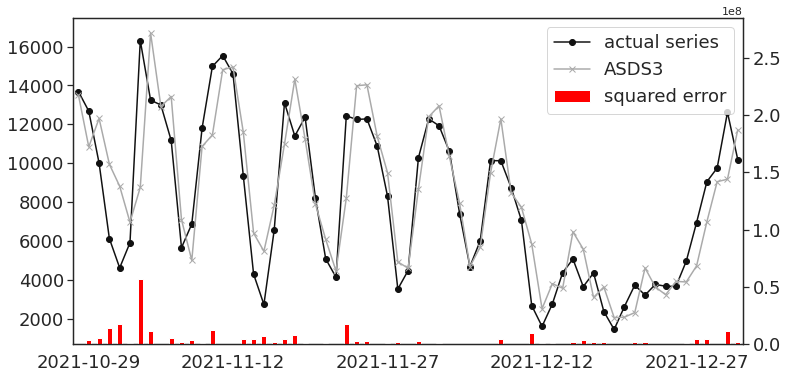

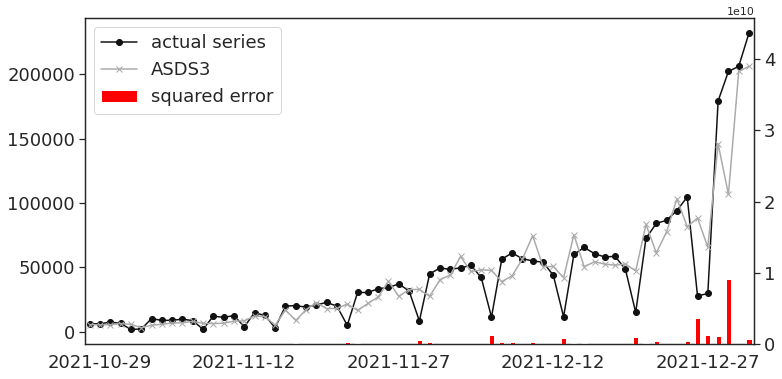

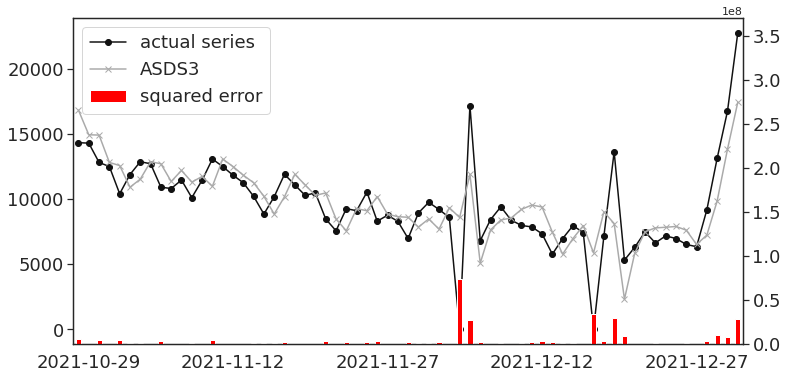

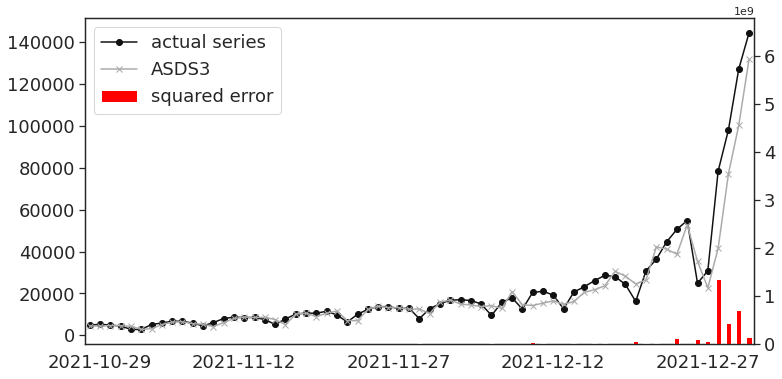

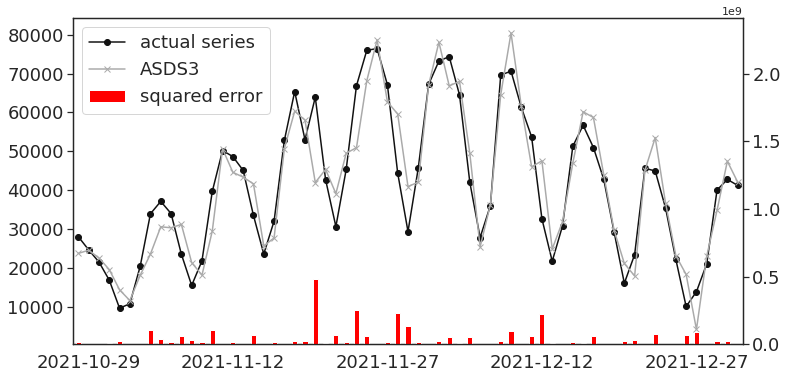

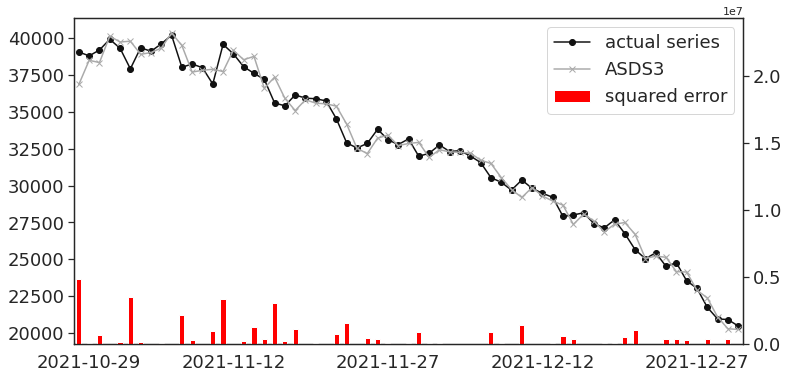

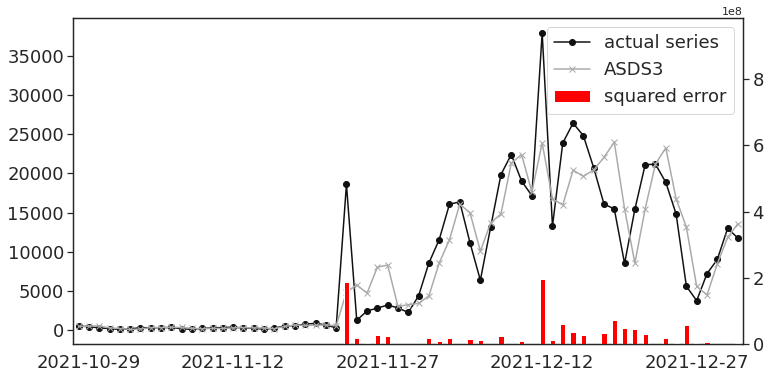

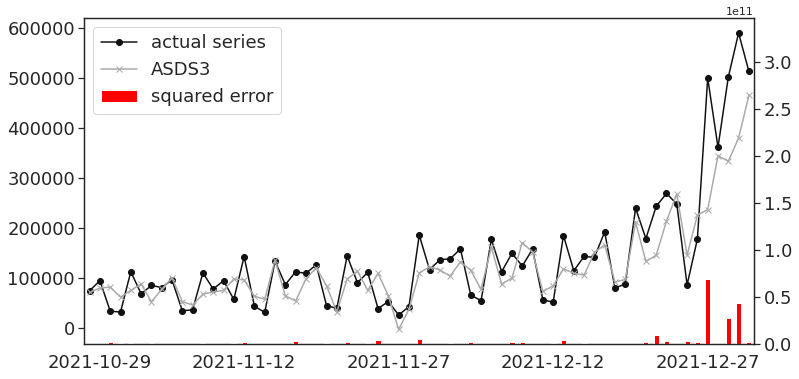

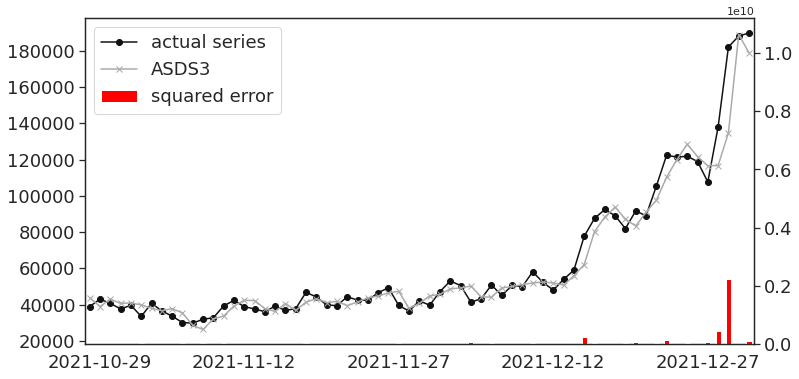

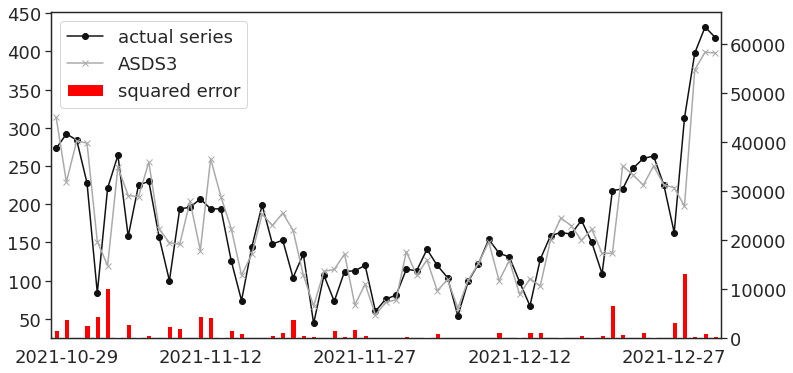

In [96]:
#sns.set_theme(style="white", palette='colorblind')
#sns.set_theme(style='white', palette='binary_r')
plt.rc('legend',fontsize=18)

for country in countries:
    #print(country)
    for model in models2:
        print(country, model)
        col = predictions[country][model].columns[0]
        name = model.upper()
        if (name == 'SVM'):
            name = 'SVR' 
         
        try:
            fig, ax = plt.subplots(figsize=(12,6))
            ix = pd.to_datetime(data[country]['test_data'].iloc[-65:].index).astype('str')
            true = pd.DataFrame(data[country]['test_data'].iloc[-65:].values, index=ix).rename({country:'true'}, axis=1)
            pred = pd.DataFrame(predictions[country][model].iloc[-65:].values, index=ix).rename({col:'true'}, axis=1)
            sqerror = pd.DataFrame(((true.rsub(pred, axis=1)) ** 2).values, index=ix).rename({0:'squared error'}, axis=1)
            pred = pd.DataFrame(predictions[country][model].iloc[-65:].values, index=ix).rename({col: model}, axis=1)
            g1 = ax.plot(true, label='actual series', marker='o')
            g2 = ax.plot(pred, label=name, marker='x')
            #print(ticks)
            # plt.xticks(ix)
            # plt.yticks(fontsize=16)
            plt.legend(fontsize="large")            
            g3 = sqerror.plot.bar(ax=ax, secondary_y=True, color='red', rot=0, mark_right=False, fontsize=18, legend=True)
            ax.right_ax.set_ylim(0, sqerror.max()[0]*5)
            # plt.legend(fontsize=16)
            # ax.legend_(handles=[g1,g2,g3],fontsize=16)
            # plt.yticks(fontsize=16)
            plt.xticks([1, 15, 30, 45 ,60])
            #plt.title(country + ' ' + model)
            plt.savefig(f"./images/forecast4/forecast_{country}_{model}.pdf", bbox_inches="tight")
        except:
            print('error')       
        # break
    # break

Brazil arima
Brazil sarima
Brazil svm
Brazil elm
Brazil mlp
Brazil lstm
Brazil ensemble
Brazil xgb
Brazil ASDS
France arima
France sarima
France svm
France elm
France mlp
France lstm
France ensemble
France xgb
France ASDS
India arima
India sarima
India svm


/tmp/ipykernel_19632/221510724.py:10: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=(12,6))


India elm
India mlp
India lstm
India ensemble
India xgb
India ASDS
Italy arima
Italy sarima
Italy svm
Italy elm
Italy mlp
Italy lstm
Italy ensemble
Italy xgb
Italy ASDS
Mexico arima
Mexico sarima
Mexico svm
Mexico elm
Mexico mlp
Mexico lstm
Mexico ensemble
Mexico xgb
Mexico ASDS
Russia arima
Russia sarima
Russia svm
Russia elm
Russia mlp
Russia lstm
Russia ensemble
Russia xgb
Russia ASDS
South Africa arima
South Africa sarima
South Africa svm
South Africa elm
South Africa mlp
South Africa lstm
South Africa ensemble
South Africa xgb
South Africa ASDS
US arima
US sarima
US svm
US elm
US mlp
US lstm
US ensemble
US xgb
US ASDS
United Kingdom arima
United Kingdom sarima
United Kingdom svm
United Kingdom elm
United Kingdom mlp
United Kingdom lstm
United Kingdom ensemble
United Kingdom xgb
United Kingdom ASDS


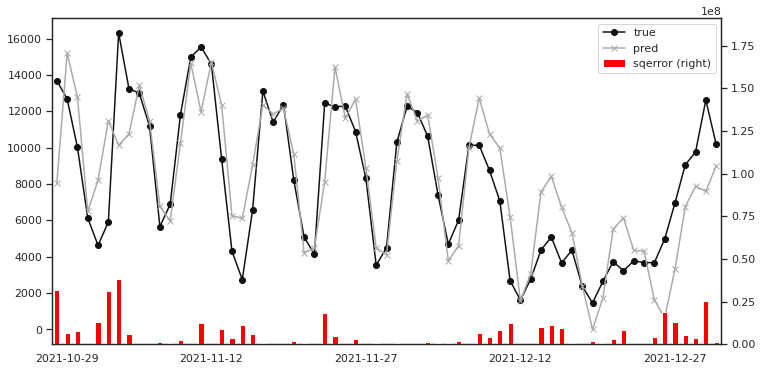

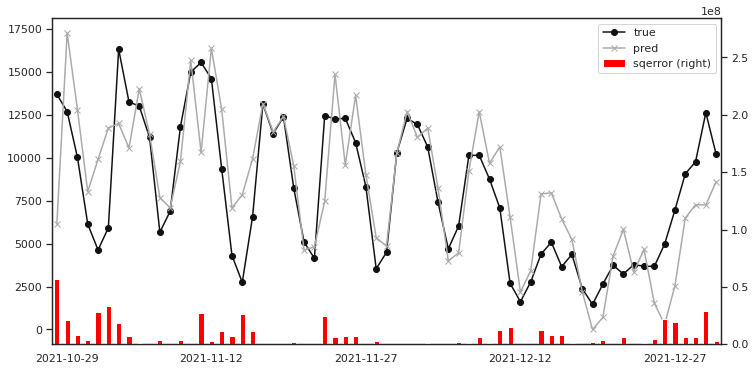

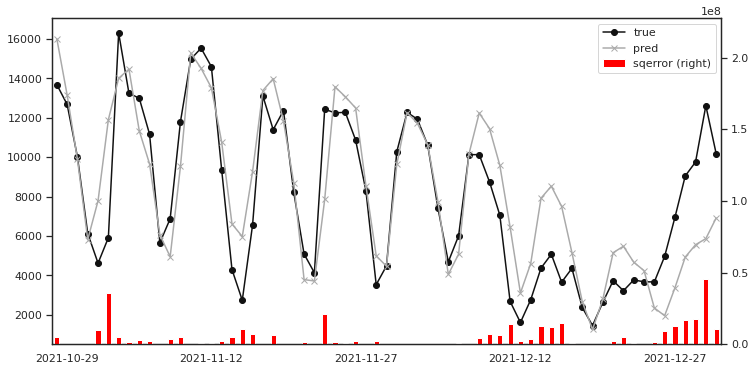

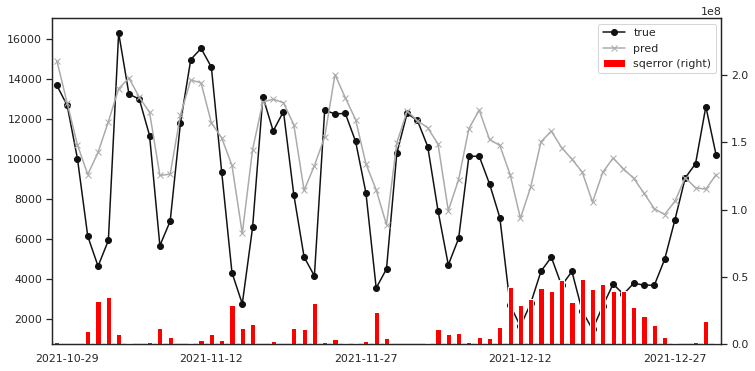

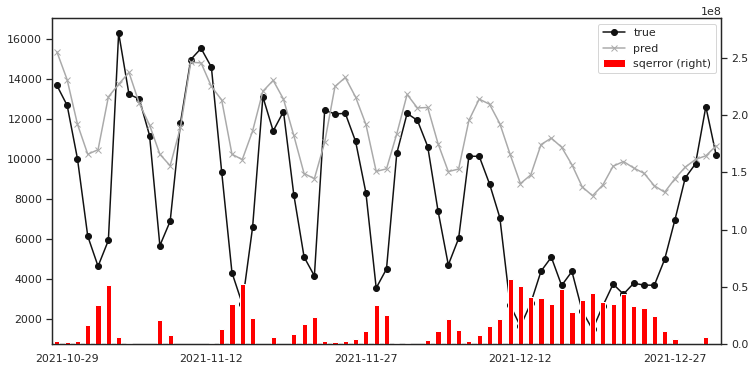

...

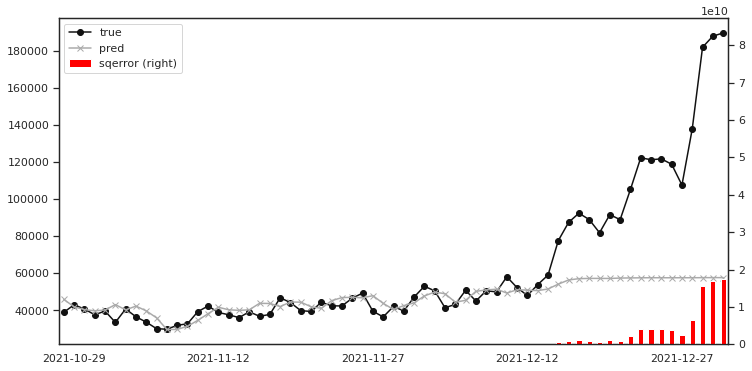

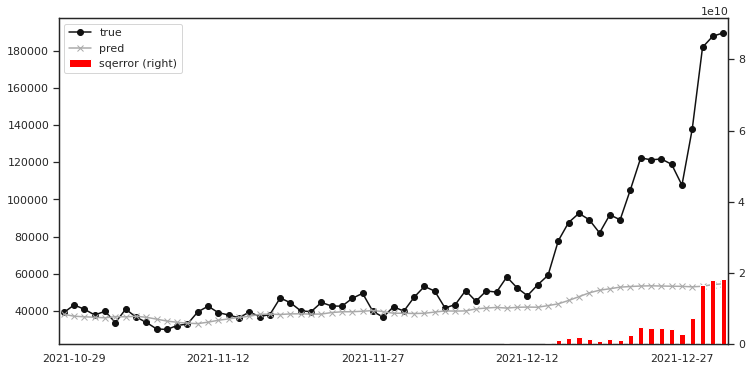

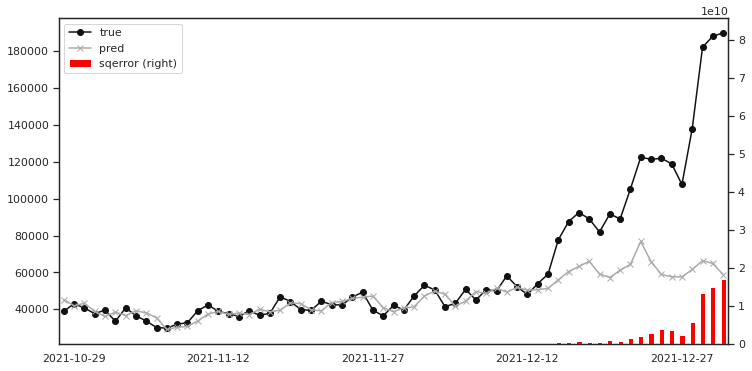

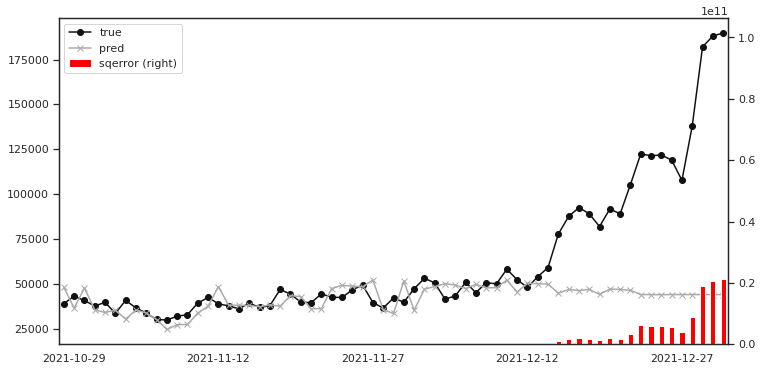

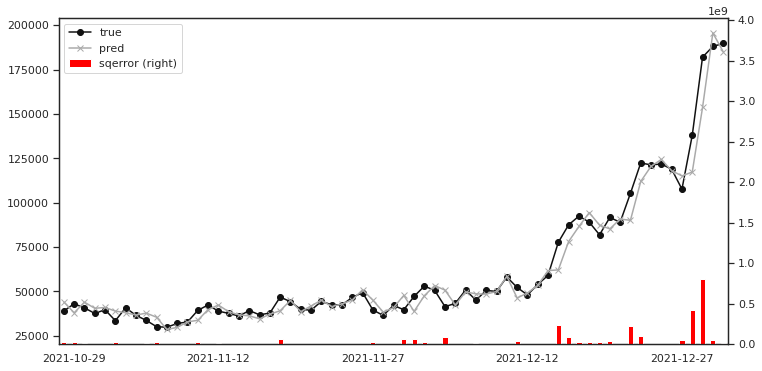

In [ ]:
#sns.set_theme(style="white", palette='colorblind')
#sns.set_theme(style='white', palette='binary_r')

for country in countries:
    #print(country)
    for model in models2:
        print(country, model)
        col = predictions[country][model].columns[0]
        try:
            fig, ax = plt.subplots(figsize=(12,6))
            ix = pd.to_datetime(data[country]['test_data'].iloc[-65:].index).astype('str')
            true = pd.DataFrame(data[country]['test_data'].iloc[-65:].values, index=ix).rename({country:'true'}, axis=1)
            pred = pd.DataFrame(predictions[country][model].iloc[-65:].values, index=ix).rename({col:'true'}, axis=1)
            sqerror = pd.DataFrame(((true.rsub(pred, axis=1)) ** 2).values, index=ix).rename({0:'sqerror'}, axis=1)
            pred = pd.DataFrame(predictions[country][model].iloc[-65:].values, index=ix).rename({col: model}, axis=1)
            ax.plot(true, label='true', marker='o')
            ax.plot(pred, label='pred', marker='x')
            plt.legend(fontsize=14)
            #print(ticks)
            # plt.xticks(ix)
            sqerror.plot.bar(ax=ax, secondary_y=True, color='red', rot=0)
            ax.right_ax.set_ylim(0, sqerror.max()[0]*5)
            plt.xticks([1, 15, 30, 45 ,60])
            #plt.title(country + ' ' + model)
            plt.savefig(f"./images/forecast/forecast_{country}_{model}.pdf")
        except:
            print('error')       

Brazil arima
error
Brazil sarima
error
Brazil svm
Brazil elm
Brazil mlp
Brazil lstm
Brazil ensemble
Brazil ASDS
France arima
error
France sarima
error
France svm
France elm
France mlp
France lstm
France ensemble
France ASDS
India arima
error
India sarima
error
India svm
India elm
India mlp


/tmp/ipykernel_8555/3112177052.py:8: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=(10,6))


India lstm
India ensemble
India ASDS
Italy arima
error
Italy sarima
error
Italy svm
Italy elm
Italy mlp
Italy lstm
Italy ensemble
Italy ASDS
Mexico arima
error
Mexico sarima
error
Mexico svm
Mexico elm
Mexico mlp
Mexico lstm
Mexico ensemble
Mexico ASDS
Russia arima
error
Russia sarima
error
Russia svm
Russia elm
Russia mlp
Russia lstm
Russia ensemble
Russia ASDS
South Africa arima
error
South Africa sarima
error
South Africa svm
South Africa elm
South Africa mlp
South Africa lstm
South Africa ensemble
South Africa ASDS
US arima
error
US sarima
error
US svm
US elm
US mlp
US lstm
US ensemble
US ASDS
United Kingdom arima
error
United Kingdom sarima
error
United Kingdom svm
United Kingdom elm
United Kingdom mlp
United Kingdom lstm
United Kingdom ensemble
United Kingdom ASDS


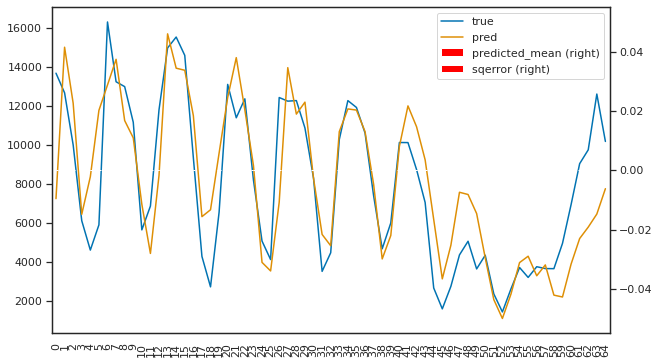

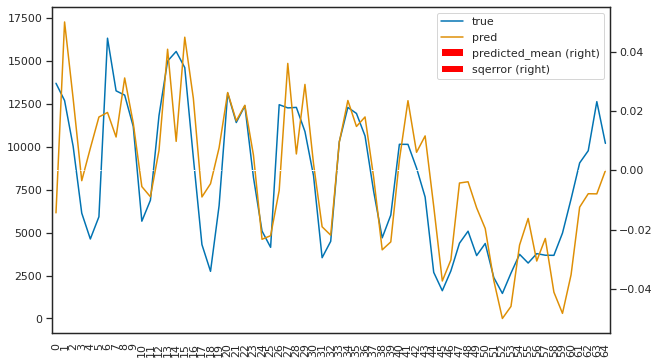

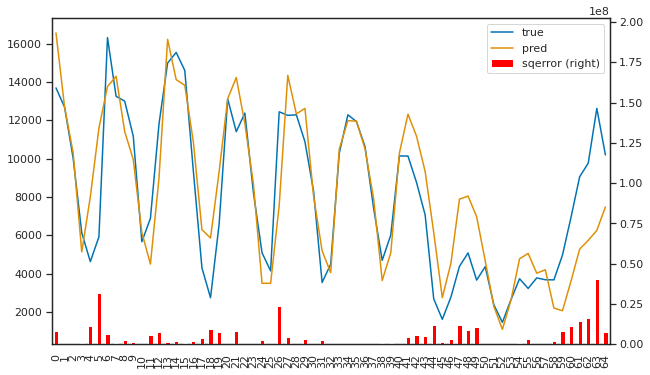

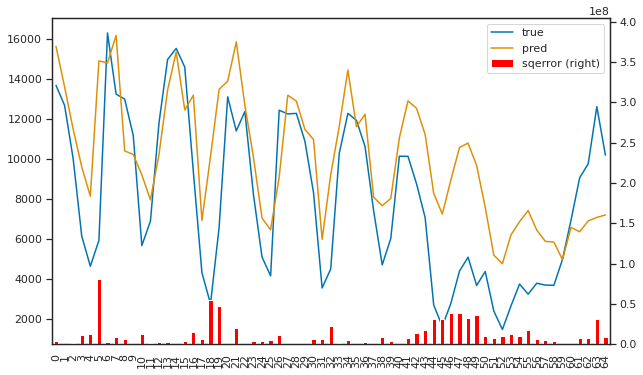

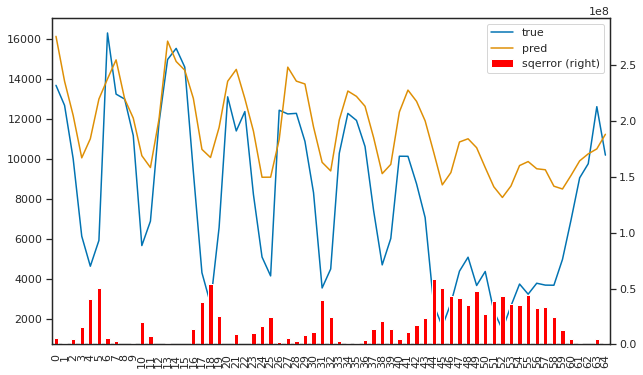

...

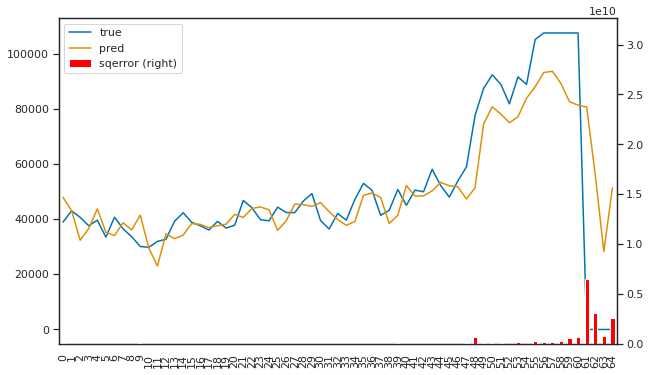

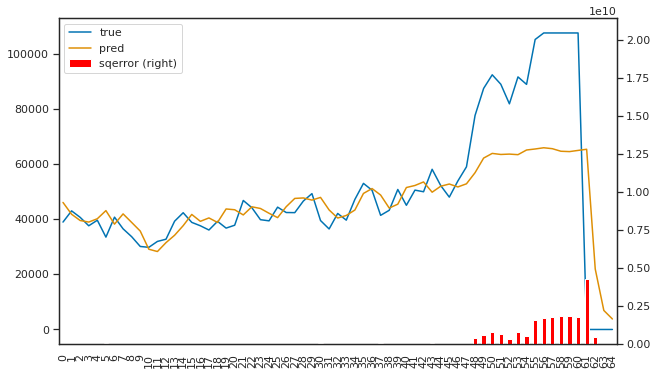

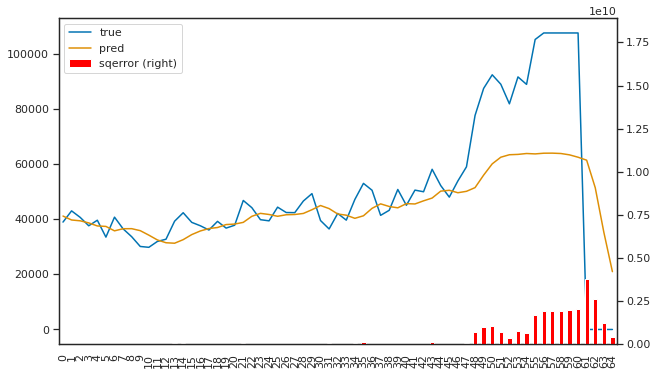

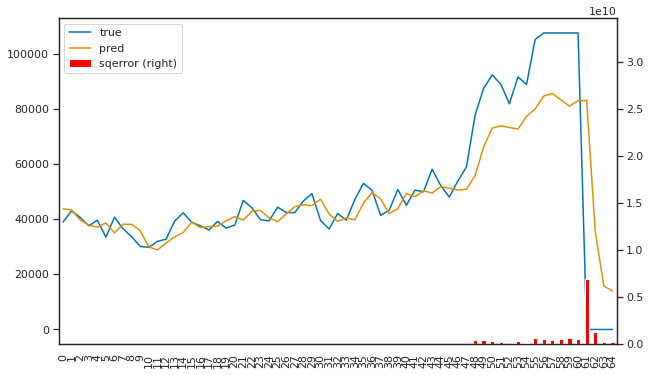

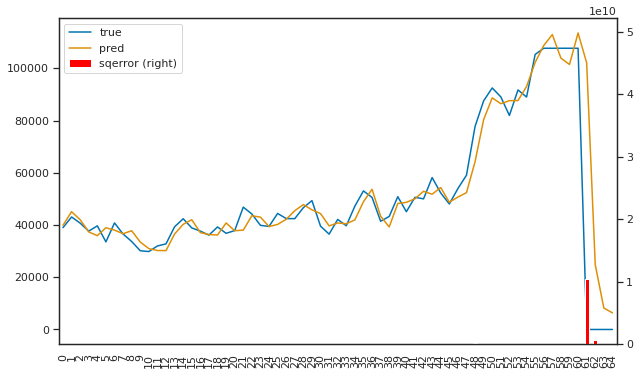

In [ ]:
sns.set_theme(style="white", palette='colorblind')

for country in countries:
    # print(country)
    for model in models2:
        print(country, model)
        try:
            fig, ax = plt.subplots(figsize=(10,6))
            true = data[country]['test_data'].iloc[-65:].reset_index(drop=True).rename({country:'true'}, axis=1)
            pred = predictions[country][model].iloc[-65:].reset_index(drop=True).rename({'0':'true'}, axis=1)
            sqerror = ((true.rsub(pred, axis=1)) ** 2).rename({'true':'sqerror'}, axis=1)
            pred = predictions[country][model].iloc[-65:].reset_index(drop=True).rename({'0':'pred'}, axis=1)
            ax.plot(true, label='true')
            ax.plot(pred, label='pred')
            plt.legend()
            sqerror.plot.bar(ax=ax, secondary_y=True, color='red')
            ax.right_ax.set_ylim(0, sqerror.max()[0]*5)
            #plt.title(country + ' ' + model)
            plt.savefig(f"./images/forecast_{country}_{model}.pdf")
        except:
            print('error')

In [ ]:
dir(ax)

['ArtistList',
 '_PROPERTIES_EXCLUDED_FROM_SET',
 '__class__',
 '__delattr__',
 '__dict__',
 '__dir__',
 '__doc__',
 '__eq__',
 '__format__',
 '__ge__',
 '__getattribute__',
 '__getstate__',
 '__gt__',
 '__hash__',
 '__init__',
 '__init_subclass__',
 '__le__',
 '__lt__',
 '__module__',
 '__ne__',
 '__new__',
 '__reduce__',
 '__reduce_ex__',
 '__repr__',
 '__setattr__',
 '__setstate__',
 '__sizeof__',
 '__str__',
 '__subclasshook__',
 '__weakref__',
 '_add_text',
 '_adjustable',
 '_agg_filter',
 '_alias_map',
 '_alpha',
 '_anchor',
 '_animated',
 '_aspect',
 '_autoscaleXon',
 '_autoscaleYon',
 '_autotitlepos',
 '_axes',
 '_axes_class',
 '_axes_locator',
 '_axis_names',
 '_axisbelow',
 '_box_aspect',
 '_callbacks',
 '_check_no_units',
 '_children',
 '_clipon',
 '_clippath',
 '_cm_set',
 '_colorbars',
 '_convert_dx',
 '_current_image',
 '_default_contains',
 '_deprecate_noninstance',
 '_facecolor',
 '_fill_between_x_or_y',
 '_frameon',
 '_gci',
 '_gen_axes_patch',
 '_gen_axes_spines',
 '_

# Computational Cost

In [ ]:
svmp = pd.read_csv('./results/svm_predict.csv')

In [ ]:
xgb.groupby('data')['Duration'].mean().mean()

Timedelta('0 days 00:00:00.575655555')

In [ ]:
elm['Duration'] = pd.to_timedelta(elm['Duration'])

In [ ]:
arima['Duration'] = pd.to_timedelta(arima['Duration'])
# arimap['Duration'] = pd.to_timedelta(arimap['Duration'])
sarima['Duration'] = pd.to_timedelta(sarima['Duration'])
# sarimap['Duration'] = pd.to_timedelta(sarimap['Duration'])
AA['Duration'] = pd.to_timedelta(AA['Duration'])
AADS['Duration'] = pd.to_timedelta(AADS['Duration'])
AS['Duration'] = pd.to_timedelta(AS['Duration'])
ASDS['Duration'] = pd.to_timedelta(ASDS['Duration'])
svm['Duration'] = pd.to_timedelta(svm['Duration'])
# svmp['Duration'] = pd.to_timedelta(svmp['Duration'])
elm['Duration'] = pd.to_timedelta(elm['Duration'])
mlp['Duration'] = pd.to_timedelta(mlp['Duration'])
lstm['Duration'] = pd.to_timedelta(lstm['Duration'])
xgb['Duration'] = pd.to_timedelta(xgb['Duration'])

In [ ]:
svm_train = svm.iloc[svm.groupby('data')['Duration'].idxmax().values]
svm_test = svm.iloc[svm.groupby('data')['Duration'].idxmin().values]

In [ ]:
lstm_train = lstm.iloc[lstm.groupby('data')['Duration'].idxmax().values]
lstm_test = lstm.iloc[~(lstm.index.isin(lstm.groupby('data')['Duration'].idxmax().values))]

In [ ]:
elm_train = elm.iloc[elm.groupby('data')['Duration'].idxmax().values]
elm_test = elm.iloc[~(elm.index.isin(elm.groupby('data')['Duration'].idxmax().values))]


In [ ]:
xgb_train = xgb.iloc[xgb.groupby('data')['Duration'].idxmax().values]
xgb_test = xgb.iloc[~(xgb.index.isin(xgb.groupby('data')['Duration'].idxmax().values))]

In [ ]:
mlp_train = mlp.iloc[mlp.groupby('data')['Duration'].idxmax().values]
mlp_test = mlp.iloc[~(mlp.index.isin(mlp.groupby('data')['Duration'].idxmax().values))]


In [ ]:
AADS_train = AA.groupby('Name').Duration.sum()
ASDS_train = AS.groupby('Name').Duration.sum()

In [ ]:
AADS_test = AADS.Duration
ASDS_test = ASDS.Duration

In [ ]:
ASDS_train, ASDS_test

(Name
 France.AS.test                  0 days 00:00:34
 India.AS.test            0 days 00:00:31.900000
 Italy.AS.test                   0 days 00:00:38
 Russia.AS.test           0 days 00:00:44.900000
 South Africa.AS.test     0 days 00:00:58.600000
 US.AS.test               0 days 00:00:44.800000
 United Kingdom.AS.test   0 days 00:00:34.600000
 Name: Duration, dtype: timedelta64[ns],
 0          0 days 00:00:02
 1   0 days 00:00:02.200000
 2   0 days 00:00:01.900000
 3   0 days 00:00:01.400000
 4   0 days 00:00:01.900000
 5   0 days 00:00:02.100000
 6   0 days 00:00:01.900000
 7          0 days 00:00:02
 8   0 days 00:00:01.800000
 Name: Duration, dtype: timedelta64[ns])

In [ ]:
sns.set_theme(style='white', palette='binary_r')

In [ ]:
train_time = {}
train_time['ARIMA'] = 10.7
train_time['SARIMA'] = 64
train_time['SVR'] = 2.5
train_time['ELM'] = 0.6
train_time['MLP'] = 91.3
train_time['LSTM'] = 132.7
train_time['XGB'] = 0.8
train_time['ASDS'] = 41
train_time

{'ARIMA': 10.7,
 'SARIMA': 64,
 'SVR': 2.5,
 'ELM': 0.6,
 'MLP': 91.3,
 'LSTM': 132.7,
 'XGB': 0.8,
 'ASDS': 41}

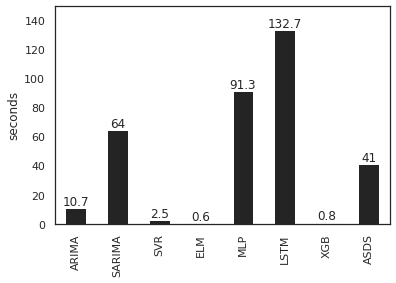

In [ ]:
ax = pd.Series(train_time).round(1).plot.bar(ylabel='seconds')

for container in ax.containers:
    ax.bar_label(container)
ax.patch.set_edgecolor('black')  
ax.patch.set_linewidth('0')
ax.set_ylim(0, ax.get_ylim()[1]+10)
plt.savefig(f"./images/time/training_time.pdf", bbox_inches="tight")

In [ ]:
train_time = {}
train_time['ARIMA'] = arima.Duration.mean()
train_time['SARIMA'] = sarima.Duration.mean()
train_time['SVR'] = svm_train.Duration.mean()
train_time['ELM'] = elm_train.Duration.mean()
train_time['MLP'] = mlp_train.Duration.mean()
train_time['LSTM'] = lstm_train.Duration.mean()
train_time['XGB'] = xgb_train.Duration.mean()
train_time['ASDS'] = ASDS_train.mean()
train_time

{'ARIMA': Timedelta('0 days 00:00:19.477777777'),
 'SARIMA': Timedelta('0 days 00:00:00.544000'),
 'SVR': Timedelta('0 days 00:00:00.855555555'),
 'ELM': Timedelta('0 days 00:00:00.439444444'),
 'MLP': Timedelta('0 days 00:01:31.744444444'),
 'LSTM': Timedelta('0 days 00:02:23.333333333'),
 'XGB': Timedelta('0 days 00:00:00.755555555'),
 'ASDS': Timedelta('0 days 00:00:03.435051851')}

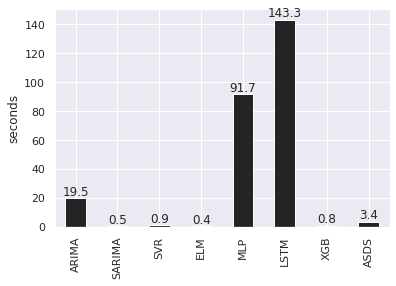

In [ ]:
ax = pd.Series(train_time).dt.total_seconds().round(1).plot.bar(ylabel='seconds')

for container in ax.containers:
    ax.bar_label(container)
plt.savefig(f"./images/time/training_time.pdf", bbox_inches="tight")

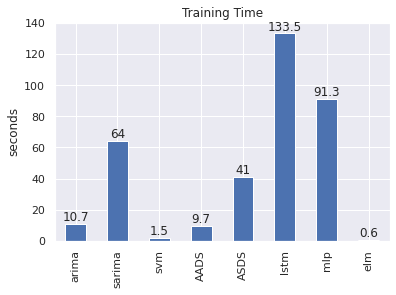

In [ ]:
ax = pd.Series(train_time).dt.total_seconds().round(1).plot.bar(ylabel='seconds', title='Training Time')

for container in ax.containers:
    ax.bar_label(container)

In [ ]:
test_time = {}
test_time['ARIMA'] = 0.4
test_time['SARIMA'] = 0.6
test_time['SVR'] = 1.5
test_time['ELM'] = 0.3
test_time['MLP'] = 7
test_time['LSTM'] = 4.4
test_time['XGB'] = 0.6
test_time['ASDS'] = 1.9
test_time

{'ARIMA': 0.4,
 'SARIMA': 0.6,
 'SVR': 1.5,
 'ELM': 0.3,
 'MLP': 7,
 'LSTM': 4.4,
 'XGB': 0.6,
 'ASDS': 1.9}

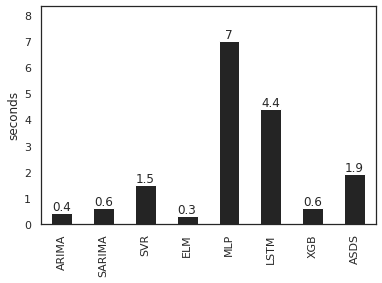

In [ ]:
ax = pd.Series(test_time).round(1).plot.bar(ylabel='seconds')

for container in ax.containers:
    ax.bar_label(container)
    ax.set_ylim(0, ax.get_ylim()[1]+1)
plt.savefig(f"./images/time/testing_time.pdf", bbox_inches="tight")

In [ ]:
test_time = {}
test_time['ARIMA'] = arimap.Duration.mean()
test_time['SARIMA'] = sarimap.Duration.mean()
test_time['SVR'] = svm_test.Duration.mean()
test_time['ELM'] = elm_test.Duration.mean()
test_time['MLP'] = mlp_test.Duration.mean()
test_time['LSTM'] = lstm_test.Duration.mean()
test_time['XGB'] = elm_test.Duration.mean()
test_time['ASDS'] = ASDS.Duration.mean()
test_time

NameError: name 'arimap' is not defined

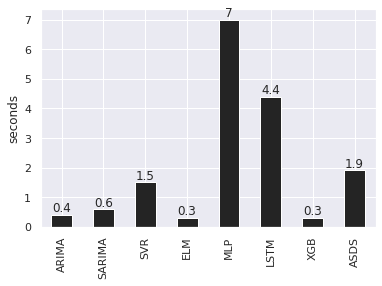

In [ ]:
ax = pd.Series(test_time).dt.total_seconds().round(1).plot.bar(ylabel='seconds')

for container in ax.containers:
    ax.bar_label(container)
plt.savefig(f"./images/time/testing_time.pdf")

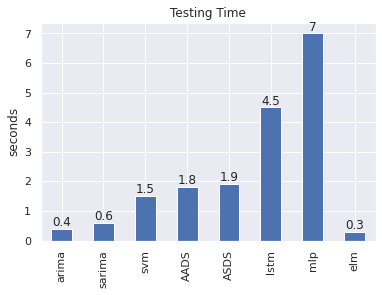

In [ ]:
ax = pd.Series(test_time).dt.total_seconds().round(1).plot.bar(ylabel='seconds', title="Testing Time")

for container in ax.containers:
    ax.bar_label(container)

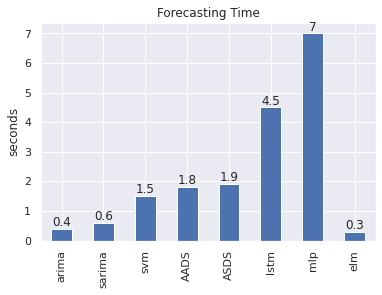

In [ ]:
ax = pd.Series(test_time).dt.total_seconds().round(1).plot.bar(ylabel='seconds', title="Forecasting Time")

for container in ax.containers:
    ax.bar_label(container)

<AxesSubplot:>

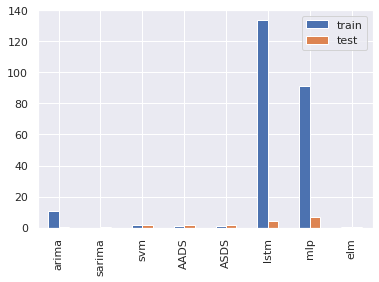

In [ ]:
pd.concat([pd.Series(train_time).dt.total_seconds(),pd.Series(test_time).dt.total_seconds()],axis=1).rename({0:'train', 1:'test'},axis=1).plot.bar()


# Models

In [73]:
import pprint as pp

In [74]:
sarimas = {}
for i in range(13):
    sarimas[i] = sm.load("models/Brazil/sarimas/sarima"+str(i)+".pkl")    
    

In [75]:
sarimas2 = {}
for i in range(13):
    sarimas2[i] = sm.load("models/Brazil/sarimas2/sarima"+str(i)+".pkl")
    pp.pprint(sarimas2[i].specification)
    print("")

{'concentrate_scale': False,
 'enforce_invertibility': True,
 'enforce_stationarity': True,
 'hamilton_representation': False,
 'k_ar': 3,
 'k_ar_params': 3,
 'k_diff': 1,
 'k_exog': 0,
 'k_ma': 1,
 'k_ma_params': 1,
 'k_seasonal_ar': 8,
 'k_seasonal_diff': 0,
 'k_seasonal_ma': 4,
 'k_trend': 2,
 'measurement_error': False,
 'mle_regression': False,
 'order': (3, 1, 1),
 'seasonal_order': (2, 0, 1, 4),
 'seasonal_periods': 4,
 'simple_differencing': False,
 'state_regression': False,
 'time_varying_regression': False,
 'trend': 'ct',
 'trend_offset': 1}

{'concentrate_scale': False,
 'enforce_invertibility': True,
 'enforce_stationarity': True,
 'hamilton_representation': False,
 'k_ar': 1,
 'k_ar_params': 1,
 'k_diff': 1,
 'k_exog': 0,
 'k_ma': 1,
 'k_ma_params': 1,
 'k_seasonal_ar': 4,
 'k_seasonal_diff': 0,
 'k_seasonal_ma': 4,
 'k_trend': 2,
 'measurement_error': False,
 'mle_regression': False,
 'order': (1, 1, 1),
 'seasonal_order': (1, 0, 1, 4),
 'seasonal_periods': 4,
 'simple_

In [76]:
sarimas[0].model_orders

{'trend': 0,
 'exog': 0,
 'ar': 3,
 'ma': 1,
 'seasonal_ar': 8,
 'seasonal_ma': 4,
 'reduced_ar': 11,
 'reduced_ma': 5,
 'exog_variance': 0,
 'measurement_variance': 0,
 'variance': 1}

In [77]:
sarimas[0].test_serial_correlation(method='ljungbox')

array([[[0.10622741, 0.36341747, 0.45060475, 0.66718488, 1.21474858,
         4.61112575, 8.50778765, 8.53774721],
        [0.74448075, 0.83384417, 0.92960131, 0.95531318, 0.94345464,
         0.59456418, 0.2899509 , 0.3827767 ]]])

In [78]:
sarimas = {}
for i in range(13):
    sarimas[i] = sm.load("models/Brazil/sarimas/sarima"+str(i)+".pkl")
    print(i, sarimas[i].specification.trend)
    

0 n
1 n
2 n
3 n
4 n
5 n
6 n
7 n
8 n
9 n
10 n
11 n
12 n


In [79]:
sarimas2 = {}
for i in range(13):
    sarimas2[i] = sm.load("models/Brazil/sarimas2/sarima"+str(i)+".pkl")
    print(i, sarimas2[i].specification.trend)

0 ct
1 ct
2 ct
3 None
4 None
5 None
6 ct
7 None
8 ct
9 None
10 ct
11 ct
12 None


In [80]:
df_sarima = {}

for i in range(13):
    # print(sarimas[i].summary())
    df_sarima[i] = {
        'order': sarimas2[i].specification.order,
        'sorder': sarimas2[i].specification.seasonal_order,
        'trend': sarimas2[i].specification.trend,
        'k_trend': sarimas2[i].specification.k_trend,
        'aic': sarimas2[i].aic,
        'mse': sarimas2[i].mse,
        'params': sarimas2[i].params,
        'norm': sarimas2[i].test_normality(method='jarquebera'),
        'acf': sarimas2[i].test_serial_correlation(method='ljungbox'),
        'het': sarimas2[i].test_heteroskedasticity       
    }

In [81]:
df_sarima = pd.DataFrame(df_sarima).T

In [100]:
'{:.2f}'.format(df_sarima['params'][0]['intercept'])


'-71.38'

In [103]:
trends = {}
for i in range(13):
    print(df_sarima['params'][i])
    try:
        trends[i] = {
            'intercept' : '{:.2f}'.format(df_sarima['params'][i]['intercept']),
            'drift' : '{:.2f}'.format(df_sarima['params'][i]['drift'])
            }        
    except:    
        trends[i] = {
            'intercept' : 0,
            'drift' : 0
            }
    
    

intercept      -71.382567
drift            2.953352
ar.L1           -1.087378
ar.L2           -0.836786
ar.L3           -0.699489
ma.L1            0.495861
ar.S.L4         -0.151935
ar.S.L8          0.671139
ma.S.L4         -0.761639
sigma2       89086.403294
dtype: float64
intercept    4.764244e+02
drift        2.444060e+01
ar.L1        1.141981e-01
ma.L1       -9.999769e-01
ar.S.L4     -8.224782e-01
ma.S.L4      4.083819e-01
sigma2       7.155333e+06
dtype: float64
intercept    2.488912e+03
drift       -1.100690e+02
ma.L1       -8.539739e-01
ma.S.L4      5.397787e-02
sigma2       2.141086e+08
dtype: float64
ar.S.L4   -4.474866e-01
sigma2     1.085999e+08
dtype: float64
ar.L1     3.723677e-01
ar.L2    -2.604055e-01
ma.L1    -9.656522e-01
sigma2    1.810600e+08
dtype: float64
ar.L1      1.226742e+00
ar.L2     -9.642110e-01
ma.L1     -1.714490e+00
ma.L2      1.423093e+00
ma.L3     -6.080364e-01
ar.S.L4    5.070625e-01
ar.S.L8   -2.451894e-01
sigma2     3.844880e+07
dtype: float64
interc

In [82]:
df_sarima[['order', 'sorder', 'aic', 'mse', 'trend']].style.format({'mse':'{:.1f}', 'aic': '{:.1f}'})

,order,sorder,aic,mse,trend
0,"(3, 1, 1)","(2, 0, 1, 4)",1357.3,68545.0,ct
1,"(1, 1, 1)","(1, 0, 1, 4)",612.2,7249385.6,ct
2,"(0, 1, 1)","(0, 0, 1, 4)",707.2,177242059.0,ct
3,"(0, 1, 0)","(1, 0, 0, 4)",687.1,120236364.5,None
4,"(2, 1, 1)","(0, 0, 0, 4)",702.6,233628838.1,None
5,"(2, 1, 3)","(2, 0, 0, 4)",1294.1,55584210.2,None
6,"(2, 1, 3)","(0, 0, 0, 4)",693.5,95349453.3,ct
7,"(0, 1, 2)","(1, 0, 0, 4)",1411.1,200150439.6,None
8,"(1, 1, 1)","(0, 0, 0, 4)",724.2,306765011.8,ct
9,"(2, 1, 2)","(0, 1, 0, 4)",646.0,743236639.1,None


In [154]:
df_sarima[['order', 'sorder', 'aic', 'mse', 'trend']].style.format({'mse':'{:.1f}', 'aic': '{:.1f}'}).to_latex('./latex/modelsbr',  caption='Models Brasil', hrules=True, label='modelsbr', position='H', position_float="centering")